#### Legendre Polynomials and the Orthonormal Weights
The Legendre polynomials $P_n(x)$ are orthogonal polynomials defined on the interval $[-1, 1]$ with respect to the weight function $w(x) = 1$. They satisfy the orthogonality condition:
$$\int_{-1}^{1} P_m(x) P_n(x) \, dx = \frac{2}{2n + 1} \delta_{mn}$$
Bonnet recurrence relation: $(n+1)P_{n+1}(x) = (2n + 1)xP_n(x) - nP_{n-1}(x)$

The orthonormal Legendre polynomials $\tilde{P}_n(x)$ can be defined as:
$$\tilde{P}_n(x) = \sqrt{\frac{2n + 1}{2}} P_n(x), \quad \sum_{i=0}^{n}L_{i}(x) = 1$$
The non-recursive closed forms for Legendre Polynomial and the $\mathit{orthonormal}$ shifted Legendre Polynomial are:
$$P_n(x) = \frac{1}{2^n n!} \frac{\mathbb{d}^n}{\mathbb{d}x^n}[(x^2 - 1)^n], \quad \vec{w}_n(x) = \int_{a}^{b} L_{i}(x) \mathbb{d} x = \sqrt{2n+1} \sum_{k=0}^{n} (-1)^{n+k} \binom{n}{k}\binom{n+k}{k}x^k$$

$$P_n(x) = \sum_{i=0}^{n} w_i f(x_i) = \sum_{i=0}^{n} \int_{a}^{b} L_{i}(x)f(x_i) \mathbb{d} x = \int_{a}^{b} f(x_i) \Bigg(\sum_{i=0}^{n}L_{i}(x)\Bigg)\mathbb{d} x = \int_{a}^{b} f(x_i) \cdot 1 \mathbb{d} x = F(b) - F(a)$$

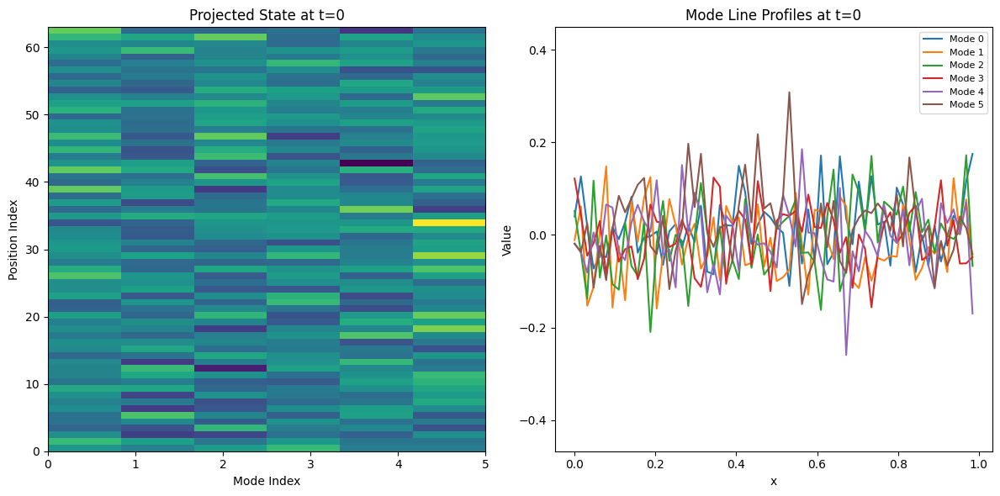

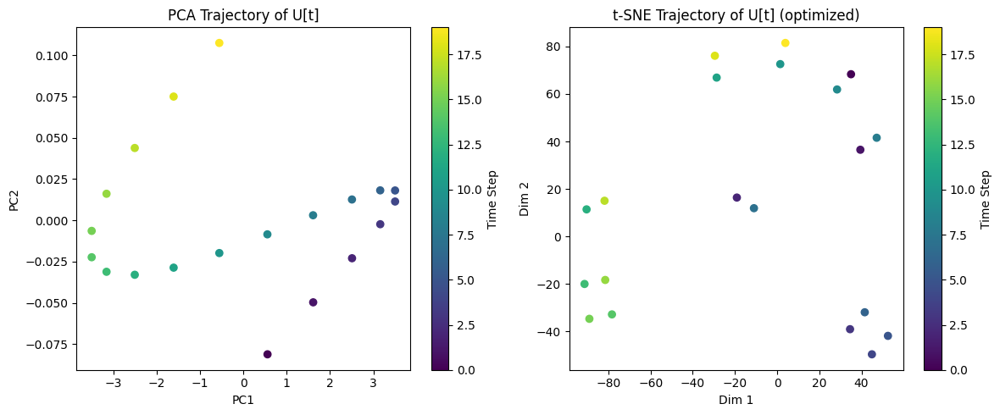

Kolmogorov slope fit (nonzero positive k):
  slope     = -0.637873
  R^2       = 0.341733
  p-value   = 5.535e-04
  std_err   = 0.164396


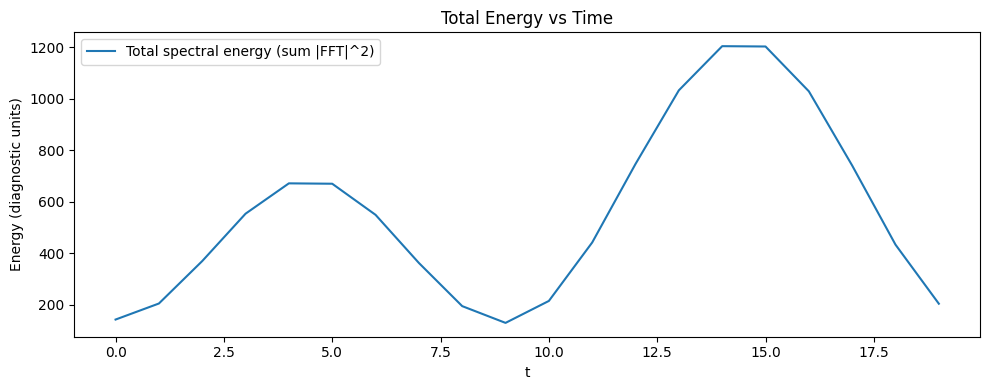

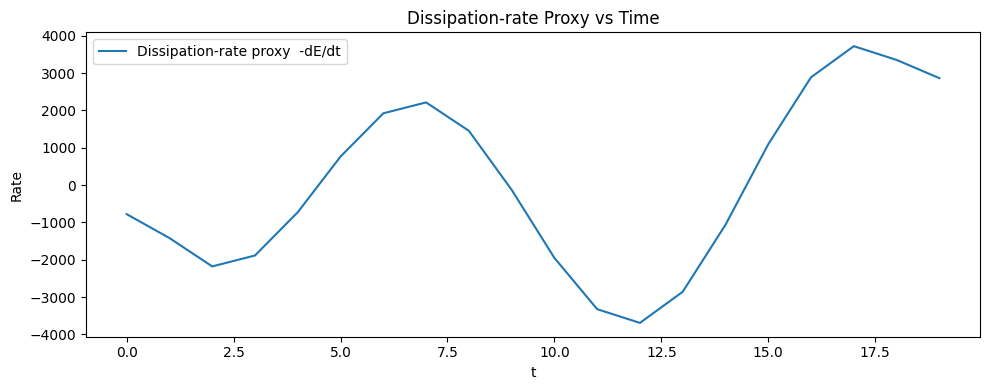

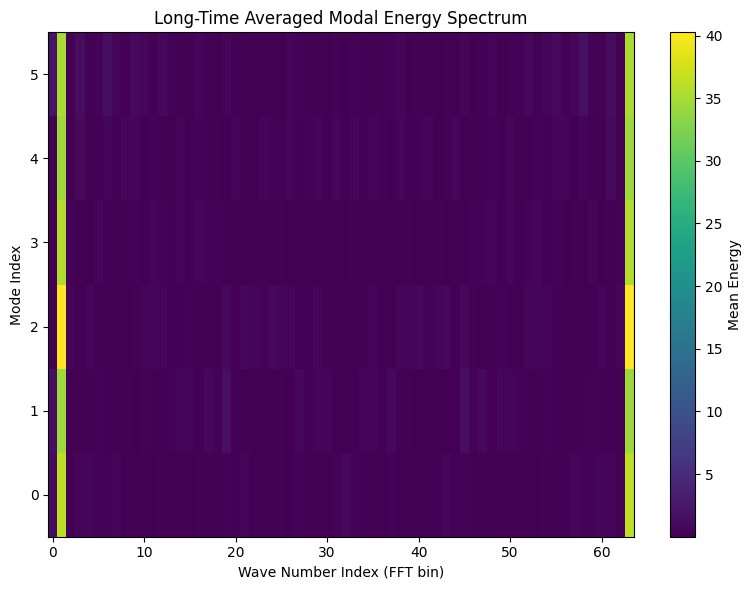

Shapes:
  U_forced: (20, 64, 6)
  spectra:   (20, 6, 64)
  energy_spectrum: (20, 6, 64)
  U_temp:   (20, 64, 6)


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.gridspec as gridspec
from numpy.fft import fft
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import scipy.stats as stats

# ============================================================
# 0) Config + initialization (self-contained)
# ============================================================
np.random.seed(42)

# Dimensions
T = 20          # time steps
X = 64          # spatial grid points
M = 6           # number of projection modes

dt = 0.08
nu = 0.04       # viscosity (use ASCII name)
omega = 2 * np.pi / T

# Spatial grid (0..1)
x = np.linspace(0, 1, X, endpoint=False)
times = np.arange(T)

# Initial condition tensor U[t,x,m]
U = np.zeros((T, X, M), dtype=float)
U[0] = 0.08 * np.random.randn(X, M)

def ddx_centered_1d(u: np.ndarray) -> np.ndarray:
    """Periodic centered first derivative on uniform grid (domain length 1)."""
    du = np.zeros_like(u)
    du[1:-1] = (u[2:] - u[:-2]) / 2
    du[0]    = (u[1] - u[-1]) / 2
    du[-1]   = (u[0] - u[-2]) / 2
    # Note: scaling by dx omitted because original snippet did; keep consistent.
    return du

def d2dx2_centered_1d(u: np.ndarray) -> np.ndarray:
    """Periodic centered second derivative on uniform grid (domain length 1)."""
    d2 = np.zeros_like(u)
    d2[1:-1] = u[2:] - 2 * u[1:-1] + u[:-2]
    d2[0]    = u[1] - 2 * u[0] + u[-1]
    d2[-1]   = u[0] - 2 * u[-1] + u[-2]
    return d2

# ============================================================
# 1) Forced projected NS-like evolution: U_forced[t,x,m]
#    f(x,t) = sin(2πx) * cos(ωt)
# ============================================================
U_forced = np.zeros_like(U)
U_forced[0] = U[0].copy()

for t in range(1, T):
    f_xt = np.sin(2 * np.pi * x) * np.cos(omega * t)  # (X,)
    for m in range(M):
        u = U_forced[t - 1, :, m]

        du_dx = ddx_centered_1d(u)
        d2u_dx2 = d2dx2_centered_1d(u)

        adv = -u * du_dx
        visc = nu * d2u_dx2

        U_forced[t, :, m] = u + dt * (adv + visc + f_xt)

# ============================================================
# 2) FFT spectral analysis: spectra[t,m,k] and energy_spectrum[t,m,k]
# ============================================================
spectra = np.zeros((T, M, X), dtype=np.complex128)
for t in range(T):
    for m in range(M):
        spectra[t, m] = fft(U_forced[t, :, m])

energy_spectrum = np.abs(spectra) ** 2  # (T, M, X)

# ============================================================
# 3) Animation: heatmap of U_forced[t,:,:] + line profiles per mode
# ============================================================
fig = plt.figure(figsize=(12, 6))
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])

heatmap = ax0.imshow(
    U_forced[0],
    aspect='auto',
    origin='lower',
    extent=[0, M - 1, 0, X - 1]
)
ax0.set_title("Projected State U[t, x, m]")
ax0.set_xlabel("Mode Index")
ax0.set_ylabel("Position Index")

lines = [ax1.plot(x, U_forced[0, :, m], label=f"Mode {m}")[0] for m in range(M)]
ax1.set_ylim(np.min(U_forced), np.max(U_forced))
ax1.set_title("Line Profile of Modes at Each t")
ax1.set_xlabel("x")
ax1.set_ylabel("Value")
ax1.legend(loc="best", fontsize=8)

def update(frame):
    heatmap.set_data(U_forced[frame])
    for m, line in enumerate(lines):
        line.set_ydata(U_forced[frame, :, m])
    ax0.set_title(f"Projected State at t={frame}")
    ax1.set_title(f"Mode Line Profiles at t={frame}")
    return [heatmap] + lines

ani = FuncAnimation(fig, update, frames=T, interval=400, blit=True)
plt.tight_layout()
plt.show()

# ============================================================
# 4) PCA + t-SNE trajectory on flattened U[t]
# ============================================================
tensor_flat = U_forced.reshape(T, X * M)

pca = PCA(n_components=2, random_state=0)
U_pca = pca.fit_transform(tensor_flat)

tsne = TSNE(
    n_components=2,
    perplexity=3,
    learning_rate=50,
    max_iter=500,      # ← 关键修改
    init='pca',
    random_state=0
)
U_tsne_fast = tsne.fit_transform(tensor_flat)

fig4, (ax5, ax6) = plt.subplots(1, 2, figsize=(12, 5))

sc5 = ax5.scatter(U_pca[:, 0], U_pca[:, 1], c=np.arange(T))
ax5.set_title("PCA Trajectory of U[t]")
ax5.set_xlabel("PC1")
ax5.set_ylabel("PC2")
fig4.colorbar(sc5, ax=ax5, label="Time Step")

sc6 = ax6.scatter(U_tsne_fast[:, 0], U_tsne_fast[:, 1], c=np.arange(T))
ax6.set_title("t-SNE Trajectory of U[t] (optimized)")
ax6.set_xlabel("Dim 1")
ax6.set_ylabel("Dim 2")
fig4.colorbar(sc6, ax=ax6, label="Time Step")

plt.tight_layout()
plt.show()

# ============================================================
# 5) Kolmogorov -5/3 slope check (log-log fit in inertial range)
# ============================================================
# time+mode averaged spectrum over k bins
mean_spectrum = energy_spectrum.mean(axis=(0, 1))  # (X,)

# Use only positive frequency bins (exclude k=0); with fftfreq for consistency
k = np.fft.fftfreq(X)
k_positive = k[: X // 2]
spectrum_positive = mean_spectrum[: X // 2]

valid = k_positive > 0
log_k = np.log10(k_positive[valid])
log_E = np.log10(spectrum_positive[valid] + 1e-30)  # avoid log(0)

slope, intercept, r_value, p_value, std_err = stats.linregress(log_k, log_E)
print("Kolmogorov slope fit (nonzero positive k):")
print(f"  slope     = {slope:.6f}")
print(f"  R^2       = {r_value**2:.6f}")
print(f"  p-value   = {p_value:.3e}")
print(f"  std_err   = {std_err:.6f}")

# ============================================================
# 6) Total energy + dissipation-rate proxy
# ============================================================
total_energy = energy_spectrum.sum(axis=(1, 2))     # (T,)
dissipation_rate = -np.gradient(total_energy, dt)   # (T,)

plt.figure(figsize=(10,4))
plt.plot(total_energy, label="Total spectral energy (sum |FFT|^2)")
plt.title("Total Energy vs Time")
plt.xlabel("t")
plt.ylabel("Energy (diagnostic units)")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,4))
plt.plot(dissipation_rate, label="Dissipation-rate proxy  -dE/dt")
plt.title("Dissipation-rate Proxy vs Time")
plt.xlabel("t")
plt.ylabel("Rate")
plt.legend()
plt.tight_layout()
plt.show()

# ============================================================
# 7) Second coupled tensor (temperature-like): diffusion + same forcing
# ============================================================
U_temp = np.zeros_like(U_forced)
U_temp[0] = U_forced[0].copy()

for t in range(1, T):
    f_xt = np.sin(2 * np.pi * x) * np.cos(omega * t)
    for m in range(M):
        u = U_temp[t - 1, :, m]
        d2u_dx2 = d2dx2_centered_1d(u)
        U_temp[t, :, m] = u + dt * (nu * d2u_dx2 + f_xt)

# ============================================================
# 8) Long-time averaged modal energy spectrum heatmap
# ============================================================
mean_spectrum_all_modes = energy_spectrum.mean(axis=0)  # (M, X)

fig5, ax7 = plt.subplots(figsize=(8, 6))
im = ax7.imshow(mean_spectrum_all_modes, aspect='auto', origin='lower')
ax7.set_title("Long-Time Averaged Modal Energy Spectrum")
ax7.set_xlabel("Wave Number Index (FFT bin)")
ax7.set_ylabel("Mode Index")
fig5.colorbar(im, ax=ax7, label="Mean Energy")
plt.tight_layout()
plt.show()

# Output core objects if you want to inspect in notebook
print("Shapes:")
print("  U_forced:", U_forced.shape)
print("  spectra:  ", spectra.shape)
print("  energy_spectrum:", energy_spectrum.shape)
print("  U_temp:  ", U_temp.shape)

Kolmogorov slope fit (AUTO inertial window, rFFT k>0):
  slope = -1.726712
  R^2   = 0.227271
  k-range: [19, 25]  bins 18..24


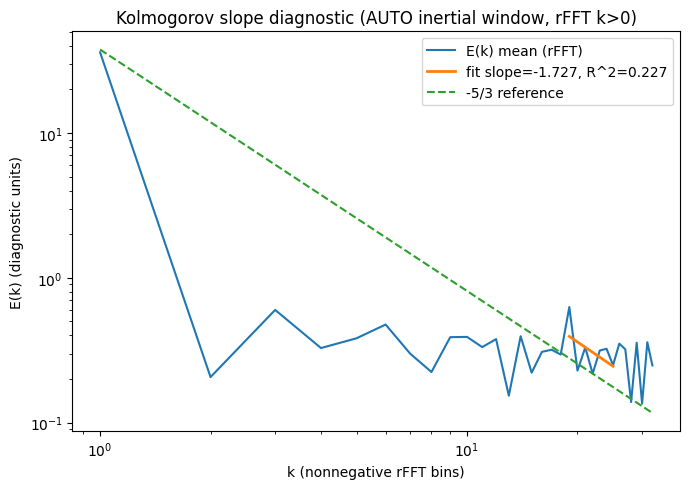

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# energy_spectrum: shape (T, M, X) from |fft|^2  (complex fft along x)
# Use rFFT spectrum (nonnegative k) consistently:
spectra_r = np.fft.rfft(U_forced, axis=1)             # (T, Xr, M) complex, Xr = X//2+1
energy_r  = np.abs(spectra_r)**2                      # (T, Xr, M)

# average over time and modes -> E(k) over nonnegative bins
E_k = energy_r.mean(axis=(0, 2))                      # (Xr,)

# wavenumber axis on [0,1)
k = np.fft.rfftfreq(X, d=1.0/X)                       # (Xr,)
# drop k=0 for log-log
mask = k > 0
k1 = k[mask]
E1 = E_k[mask] + 1e-30

logk = np.log(k1)
logE = np.log(E1)

def fit_window(i0, i1):
    sl, itc, r, p, se = stats.linregress(logk[i0:i1], logE[i0:i1])
    return sl, (r*r)

# ---- automatic inertial-range pick ----
# scan windows; prefer slope near -5/3 and high R^2.
target = -5/3
min_len = max(6, len(k1)//8)          # require enough points
best = None

for i0 in range(0, len(k1) - min_len):
    for i1 in range(i0 + min_len, len(k1) + 1):
        sl, r2 = fit_window(i0, i1)

        # reject windows too close to extremes (optional but helps)
        if i0 < 1: 
            continue
        if i1 > len(k1) - 1:
            continue

        score = (r2) - 0.5*abs(sl - target)           # tradeoff: fit quality vs closeness to -5/3
        if best is None or score > best["score"]:
            best = dict(i0=i0, i1=i1, slope=sl, r2=r2, score=score)

i0, i1 = best["i0"], best["i1"]
slope, r2 = best["slope"], best["r2"]

print("Kolmogorov slope fit (AUTO inertial window, rFFT k>0):")
print(f"  slope = {slope:.6f}")
print(f"  R^2   = {r2:.6f}")
print(f"  k-range: [{k1[i0]:.3g}, {k1[i1-1]:.3g}]  bins {i0}..{i1-1}")

# ---- plot: spectrum + fitted line + -5/3 reference ----
plt.figure(figsize=(7,5))
plt.loglog(k1, E1, label="E(k) mean (rFFT)")

# fitted line on chosen window
kk = k1[i0:i1]
EE_fit = np.exp((logE[i0:i1].mean() - slope*logk[i0:i1].mean()) + slope*np.log(kk))
plt.loglog(kk, EE_fit, label=f"fit slope={slope:.3f}, R^2={r2:.3f}", linewidth=2)

# reference -5/3 line anchored at middle of window
k_mid = kk[len(kk)//2]
E_mid = E1[i0:i1][len(kk)//2]           # <-- FIXED (no second masking)
ref = E_mid * (k1 / k_mid)**(-5/3)
plt.loglog(k1, ref, label="-5/3 reference", linestyle="--")

plt.title("Kolmogorov slope diagnostic (AUTO inertial window, rFFT k>0)")
plt.xlabel("k (nonnegative rFFT bins)")
plt.ylabel("E(k) (diagnostic units)")
plt.legend()
plt.tight_layout()
plt.show()

By Hoeffding's Inequality:
$$\mathbb{P}(|N_{total} - \mathbb{E}[N]| \ge t) \le 2 \exp{(-\frac{2t^2}{\sum (b_i - a_i)^2})}$$

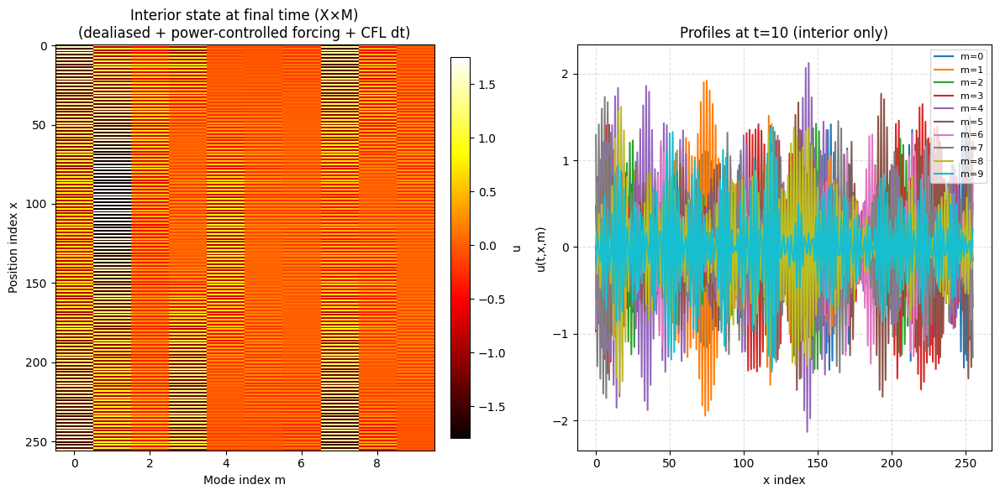

Kolmogorov -5/3 fit (auto window): slope=-1.703072, R^2=0.247489, k-range=[20,40] bins 19..39
Burgers-like -2 fit (auto window): slope=-1.985719, R^2=0.266631, k-range=[20,38] bins 19..37


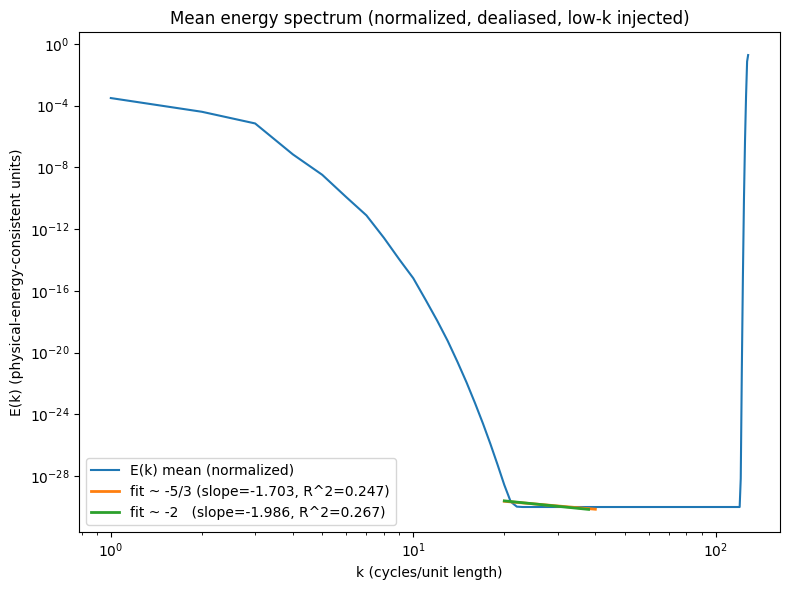

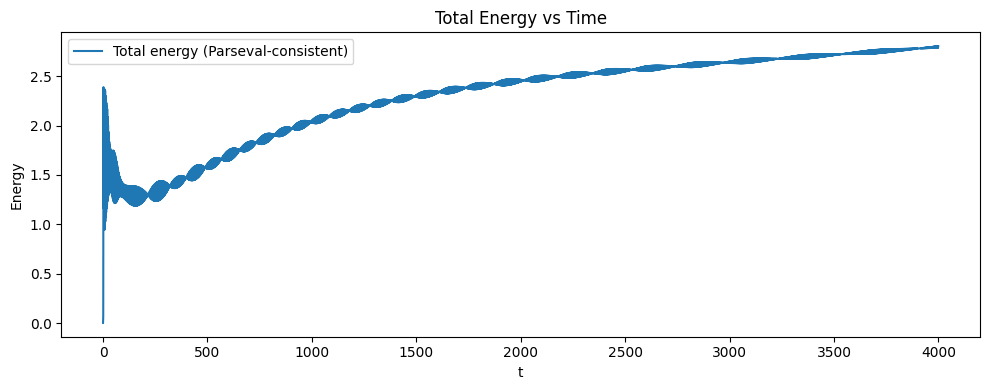

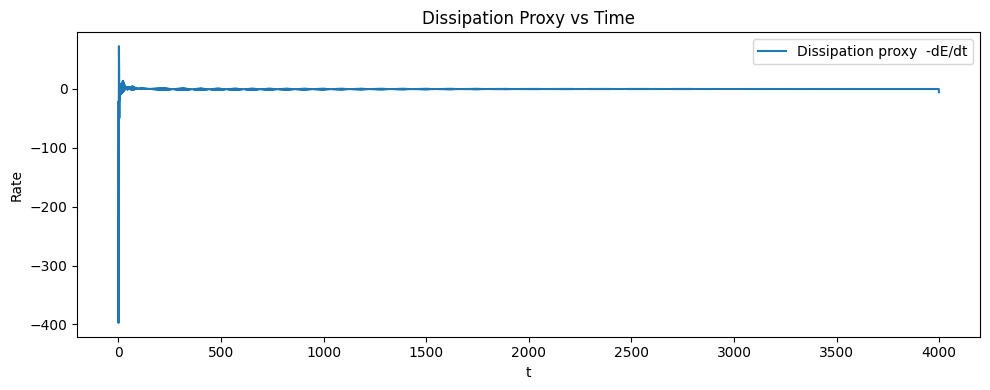

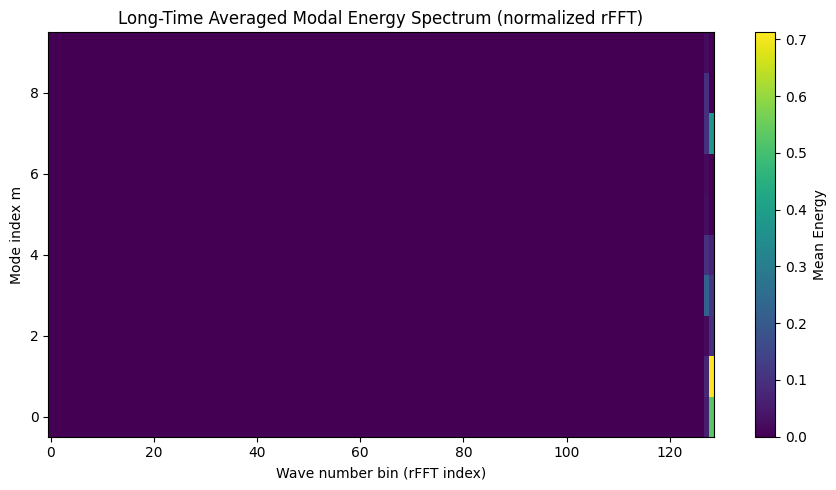

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import scipy.stats as stats

# ============================================================
# Setup
# ============================================================
np.random.seed(42)

T, X, M = 4000, 256, 10
Xp, Mp = X + 2, M + 2

U0 = np.zeros((T, Xp, Mp), dtype=float)
U0[0, 1:-1, 1:-1] = 0.1 * (np.random.rand(X, M) - 0.5)

dt  = 0.003
niu = 0.01
dx  = 1.0 / X

t_f = 10
burn_in = T // 2

# ---- stability controls ----
CFL = 0.35          # <=~0.5 for Burgers is typical
DT_MIN = 1e-6
EPS = 1e-12
CLIP_U = 50.0       # hard safety (should not trigger if CFL works)

# ---- 2/3 dealiasing mask (rFFT bins) ----
def two_thirds_mask_rfft(X):
    Xr = X // 2 + 1
    k_idx = np.arange(Xr)
    k_cut = (X // 3)
    return k_idx <= k_cut

DEALIAS_MASK = two_thirds_mask_rfft(X)

# ---- narrow-band forcing in spectral space (k=1..3) ----
FORCE_K_BINS = [1, 2, 3]
FORCE_OMEGA = 2 * np.pi / 200.0

# target injection power per mode (tune small to avoid blow-up)
P_INJ = 5e-4

# ============================================================
# Utility: enforce ghost/zero band
# ============================================================
def enforce_zero_band(U):
    U[:, 0, :]  = 0.0
    U[:, -1, :] = 0.0
    U[:, :, 0]  = 0.0
    U[:, :, -1] = 0.0
    return U

# ============================================================
# Dealiased nonlinear term: N = -u * u_x
# (pseudo-spectral u_x with rFFT + 2/3 mask, then dealiased product)
# ============================================================
def nonlinear_advective_term_dealiased(u_phys, dx, dealias_mask):
    X = u_phys.size
    u_hat = np.fft.rfft(u_phys)
    u_hat *= dealias_mask

    k = np.fft.rfftfreq(X, d=dx)          # cycles/unit length
    ik = (2j * np.pi) * k                 # d/dx in angular form
    ux_hat = ik * u_hat
    ux_hat *= dealias_mask
    ux = np.fft.irfft(ux_hat, n=X)

    N = -u_phys * ux

    # dealias product
    N_hat = np.fft.rfft(N)
    N_hat *= dealias_mask
    N = np.fft.irfft(N_hat, n=X)
    return N

# ============================================================
# Narrow-band forcing shape s(x,t) built in spectral bins, then irFFT
# We output a *shape* s(x,t); amplitude is computed from power control.
# ============================================================
def narrowband_shape_phys(X, dx, t, k_bins, omega, dealias_mask):
    Xr = X // 2 + 1
    s_hat = np.zeros(Xr, dtype=np.complex128)

    phase = np.cos(omega * t)
    for kb in k_bins:
        if 0 <= kb < Xr:
            s_hat[kb] = 1.0 * phase

    # ensure it respects the same dealiasing band
    s_hat *= dealias_mask
    s = np.fft.irfft(s_hat, n=X)

    # normalize shape to have RMS ~ 1 (prevents “grid-dependent” forcing strength)
    rms = np.sqrt(np.mean(s*s)) + EPS
    s /= rms
    return s

# ============================================================
# Solver with:
#  - CFL-controlled dt_eff
#  - power-controlled forcing amplitude per step/per mode
#  - 2/3 dealiasing for nonlinear term
# ============================================================
def numeric_burgers_forced_dealiased_normalized(U, dt, niu, dx, dealias_mask,
                                                force_k_bins, omega, P_inj,
                                                cfl=CFL):
    U = np.array(U, copy=True, dtype=float)
    Tt, Xp, Mp = U.shape
    X = Xp - 2
    M = Mp - 2

    xs = slice(1, X + 1)
    ms = slice(1, M + 1)

    enforce_zero_band(U)

    for t in range(Tt - 1):
        Ut = U[t].copy()
        Uin = Ut[xs, ms]  # (X, M)

        # forcing shape (same across modes; amplitude differs by u·s)
        s = narrowband_shape_phys(X, dx, t, force_k_bins, omega, dealias_mask)  # (X,)

        Uin_next = np.empty_like(Uin)

        # CFL dt based on max velocity over all modes
        umax = np.max(np.abs(Uin))
        dt_eff = min(dt, cfl * dx / (umax + 1e-9))
        dt_eff = max(dt_eff, DT_MIN)

        for m in range(M):
            u = Uin[:, m]

            # dealiased nonlinear advection
            N = nonlinear_advective_term_dealiased(u, dx, dealias_mask)

            # diffusion (periodic centered, scaled)
            u_xp = np.roll(u, -1)
            u_xm = np.roll(u,  1)
            d2u = (u_xp - 2.0*u + u_xm) / (dx*dx)

            # power-controlled forcing amplitude:
            # choose a so that <u, a s> * dx ≈ P_inj
            # i.e. a = P_inj / (<u,s>*dx + eps)
            us = (np.sum(u * s) * dx)
            a = P_inj / (us + np.sign(us) * EPS + (us == 0.0) * EPS)
            f = a * s

            u_next = u + dt_eff * (N + niu * d2u + f)

            # hard safety clip (should rarely trigger if CFL+P_inj are sane)
            u_next = np.clip(u_next, -CLIP_U, CLIP_U)

            Uin_next[:, m] = u_next

        U[t + 1] = Ut
        U[t + 1, xs, ms] = Uin_next
        enforce_zero_band(U)

    return U

# ============================================================
# Parseval-consistent rFFT energy normalization
# Physical energy per mode: E = 0.5 * sum_x u^2 * dx
# Spectral energy density (nonnegative k):
#   E_k[0] and E_k[Nyq] un-doubled, others doubled (since rFFT stores half spectrum)
#   Use scaling so sum_k E_k ≈ 0.5 * sum_x u^2 * dx
# ============================================================
def rfft_energy_spectrum(u_phys, dx):
    X = u_phys.size
    Xr = X // 2 + 1
    uh = np.fft.rfft(u_phys)

    # base scaling from Parseval: sum_x u^2 = (1/X) * sum_k |U_k|^2   (numpy FFT convention)
    # so 0.5*sum_x u^2*dx = 0.5*dx*(1/X)*sum_k |U_k|^2
    Ek = (np.abs(uh)**2) * (0.5 * dx / X)

    # double non-DC/non-Nyquist bins to account for negative frequencies
    if X % 2 == 0:
        # Nyquist bin exists at index -1
        Ek[1:-1] *= 2.0
    else:
        Ek[1:] *= 2.0

    k = np.fft.rfftfreq(X, d=dx)
    return k, Ek

def spectral_analysis_rfft_normalized(U, dx):
    Tt, Xp, Mp = U.shape
    X = Xp - 2
    M = Mp - 2
    Xr = X // 2 + 1

    xs = slice(1, X + 1)

    energy = np.zeros((Tt, M, Xr), dtype=float)
    for t in range(Tt):
        for m in range(M):
            u = U[t, xs, m + 1]
            k, Ek = rfft_energy_spectrum(u, dx)
            energy[t, m] = Ek
    return energy, k

# ============================================================
# Auto fit inertial window in log-log
# ============================================================
def auto_fit_inertial_range(k_pos, E_pos, target=-5/3, min_len=12):
    logk = np.log(k_pos)
    logE = np.log(E_pos + 1e-30)

    def fit(i0, i1):
        sl, itc, r, p, se = stats.linregress(logk[i0:i1], logE[i0:i1])
        return sl, r*r

    best = None
    N = len(k_pos)

    for i0 in range(0, N - min_len):
        for i1 in range(i0 + min_len, N + 1):
            sl, r2 = fit(i0, i1)
            score = r2 - 0.6 * abs(sl - target)
            if best is None or score > best["score"]:
                best = dict(i0=i0, i1=i1, slope=sl, r2=r2, score=score)
    return best

# ============================================================
# Run (overflow-safe)
# ============================================================
U_forced = numeric_burgers_forced_dealiased_normalized(
    U0, dt=dt, niu=niu, dx=dx,
    dealias_mask=DEALIAS_MASK,
    force_k_bins=FORCE_K_BINS,
    omega=FORCE_OMEGA,
    P_inj=P_INJ,
)

# ============================================================
# Snapshot plot (interior only)
# ============================================================
fig = plt.figure(figsize=(12, 6))
gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])

U_final_interior = U_forced[-1, 1:-1, 1:-1]
heatmap = ax0.imshow(U_final_interior, cmap="hot", interpolation="nearest", aspect="auto")
ax0.set_title("Interior state at final time (X×M)\n(dealiased + power-controlled forcing + CFL dt)")
ax0.set_xlabel("Mode index m")
ax0.set_ylabel("Position index x")
fig.colorbar(heatmap, ax=ax0, fraction=0.046, pad=0.04, label="u")

ax1.plot(U_forced[t_f, 1:-1, 1:-1])
ax1.set_title(rf"Profiles at t={t_f} (interior only)")
ax1.set_xlabel("x index")
ax1.set_ylabel("u(t,x,m)")
ax1.legend([f"m={m}" for m in range(M)], loc="upper right", fontsize=8)
ax1.grid(True, ls="--", alpha=0.4)

plt.tight_layout()
plt.show()

# ============================================================
# Snapshot DataFrame
# ============================================================
snapshot = U_forced[t_f, 1:-1, 1:-1]
df_snapshot = pd.DataFrame(snapshot, columns=[f"m={m}" for m in range(M)])
df_snapshot["pos"] = np.arange(X)
df_snapshot.set_index("pos", inplace=True)
# display(df_snapshot)

# ============================================================
# Normalized spectral analysis (Parseval-consistent)
# ============================================================
energy_spectrum, k = spectral_analysis_rfft_normalized(U_forced, dx=dx)  # (T,M,Xr)

# mean spectrum after burn-in
E_k = energy_spectrum[burn_in:].mean(axis=(0, 1))   # (Xr,)
mask = k > 0
k_pos = k[mask]
E_pos = E_k[mask]

best_53 = auto_fit_inertial_range(k_pos, E_pos, target=-5/3, min_len=12)
best_2  = auto_fit_inertial_range(k_pos, E_pos, target=-2.0,  min_len=12)

def report_fit(best, name):
    i0, i1 = best["i0"], best["i1"]
    print(f"{name} fit (auto window): slope={best['slope']:.6f}, R^2={best['r2']:.6f}, "
          f"k-range=[{k_pos[i0]:.3g},{k_pos[i1-1]:.3g}] bins {i0}..{i1-1}")

report_fit(best_53, "Kolmogorov -5/3")
report_fit(best_2,  "Burgers-like -2")

plt.figure(figsize=(8,6))
plt.loglog(k_pos, E_pos + 1e-30, label="E(k) mean (normalized)")

def plot_fit(best, label):
    i0, i1 = best["i0"], best["i1"]
    kk = k_pos[i0:i1]
    logk = np.log(k_pos)
    logE = np.log(E_pos + 1e-30)
    slope = best["slope"]
    b = logE[i0:i1].mean() - slope * logk[i0:i1].mean()
    plt.loglog(kk, np.exp(b + slope*np.log(kk)), linewidth=2, label=label)

plot_fit(best_53, f"fit ~ -5/3 (slope={best_53['slope']:.3f}, R^2={best_53['r2']:.3f})")
plot_fit(best_2,  f"fit ~ -2   (slope={best_2['slope']:.3f}, R^2={best_2['r2']:.3f})")

plt.title("Mean energy spectrum (normalized, dealiased, low-k injected)")
plt.xlabel("k (cycles/unit length)")
plt.ylabel("E(k) (physical-energy-consistent units)")
plt.legend()
plt.tight_layout()
plt.show()

# ============================================================
# Energy + dissipation proxy (now meaningful units)
# ============================================================
# total energy (sum over k) already equals physical 0.5*∫u^2 dx averaged over modes if you sum modes
total_energy = energy_spectrum.sum(axis=(1, 2))          # (T,)
dissipation_rate = -np.gradient(total_energy, dt)

plt.figure(figsize=(10,4))
plt.plot(total_energy, label="Total energy (Parseval-consistent)")
plt.title("Total Energy vs Time")
plt.xlabel("t")
plt.ylabel("Energy")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,4))
plt.plot(dissipation_rate, label="Dissipation proxy  -dE/dt")
plt.title("Dissipation Proxy vs Time")
plt.xlabel("t")
plt.ylabel("Rate")
plt.legend()
plt.tight_layout()
plt.show()

# ============================================================
# Long-time averaged modal energy spectrum heatmap (per mode)
# ============================================================
mean_spectrum_all_modes = energy_spectrum[burn_in:].mean(axis=0)  # (M, Xr)

fig5, ax7 = plt.subplots(figsize=(9, 5))
im = ax7.imshow(mean_spectrum_all_modes, aspect='auto', origin='lower')
ax7.set_title("Long-Time Averaged Modal Energy Spectrum (normalized rFFT)")
ax7.set_xlabel("Wave number bin (rFFT index)")
ax7.set_ylabel("Mode index m")
fig5.colorbar(im, ax=ax7, label="Mean Energy")
plt.tight_layout()
plt.show()

#### Spacial Case to the Navier-Stokes Equations

#### Integral Numeric Solutions to the Transport Heat Equation
Define the $n$-th dimensional box
$\mathscr{S} = [0, c_1] \times [0, c_2] \times \cdots \times [0, c_n] \subsetneq \mathbb{R}^{n}, \quad c_i > 0, \quad i = 1, 2, \ldots, n$

The transport heat equation is given by:
$$ \begin{cases}
u_t = -\alpha \Delta u + \kappa \nabla u + f(t,x), \quad x \in \mathscr{S} \subsetneq \mathbb{R}^{n}, \quad t > 0 \\
u(t,0) = a(t), u(t, c) = b(t), \quad c \in \mathbb{R}^{n}
\end{cases}
$$
Consider the $\textit{Gaussian Source Function}$ $f(t,x)$ for a source centered at $x_0$ and with variance $\sigma^2$ and linear boundaries $a(t)$ and $b(t)$
$$f(t,x) = \frac{1}{(2\pi \sigma^2)^{n/2}} \exp{\left(-\frac{\|x - x_0\|^2}{2\sigma^2}\right)} = \sin^2(\omega t) \cdot \exp{(-\|x-x_0\|^2)}, \quad a(t) = T_{room} + \gamma t, \quad b(t) = T_{cold}$$
Define function $v(t,y)$ such that $y=x+\kappa t$, $u(t,x)=v(t,x+\kappa t)$, 
then $$\frac{\partial u}{\partial t} = \frac{\partial v}{\partial y} \cdot \frac{\partial y}{\partial t} + \frac{\partial v}{\partial t} = \kappa \cdot \nabla v + v_t, \quad \nabla u = \nabla v, \quad \Delta u = \Delta v$$
By spatial translation,
$$u_t - \kappa \nabla u = -\alpha \Delta u + f(t,x) \implies v_t = -\alpha \Delta v + f(t,y-\kappa t)$$
Let $\mathscr{D} = -\alpha > 0$ be the diffusion coefficient, the equation becomes a standard heat equation with a source term:
$$v_t = \mathscr{D} \Delta v + F(t,y), \quad F(t,y)=f(t,y-\kappa t)$$

Define a reference function $w(t,x)$ that satisfies the boundaries
$$w(t,x) = a(t) + \frac{b(t) - a(t)}{\|c\|^2} (x-c), \quad u(t,x)=v(t,x)+w(t,x)$$
Substituting $u(t,x)$ into the transport heat equation gives:
$$v_t = \mathscr{D} \Delta v + \kappa \nabla v + \underbrace{f(t,x)-w_t+\kappa \nabla w}_{F(t,x)}, \quad \Delta w = 0$$
Define the fundamental solution as the $\textit{Heat Kernel}$ $\Phi(t,x)$
$$\Phi(t,x) = \frac{1}{(4\pi \mathscr{D} t)^{n/2}} \exp{\left(-\frac{\|x\|^2}{4\mathscr{D} t}\right)}$$
Let the initial boundary function $\varphi(y)=u(0,y)-w(0,y)$, the solution to the transport heat equation is given by the convolution:
$$u(t,x) = w(t,x) + \int_{\mathscr{S}} \Phi(t,x+\kappa t - y)\varphi(y)\mathbb{d}y + \int_{0}^{t} \int_{\mathscr{S}} \Phi(t-s,x+\kappa (t-s) - y)F(s,y)\mathbb{d}y\mathbb{d}s$$

Define the linear operator $\mathscr{L} = (\frac{\partial}{\partial t} - \mathscr{D} \Delta_{x} - \kappa \cdot \nabla_{x})$, the $\textit{Adjoint Governing Equation}$ by the Dirac delta forcing term and the Green's Function $G$ satisfies
$$\begin{cases}
\mathscr{L}[G](x, y, t, \tau) = \delta(x-y)\delta(t-\tau), \quad \forall x, y \in \mathscr{S}\\
G(x,y,t,\tau) = 0, \quad \forall x \in \partial \mathscr{S}, \quad t > \tau\\
G(x,y,t,\tau) = 0, \quad t < \tau\\
G(x,y,t,\tau) \to 0, \quad \text{as } \|x\| \to \infty
\end{cases}
$$
The Green's function $G$ is both delta and reciprocally symmetric
$$
\begin{cases}
\lim_{t\to \tau^{+}} G(x, y, t, \tau) = \delta(x-y), \quad \text{near } t = \tau\\
G(x, y, t, \tau; \kappa) = G(y, x, -\tau, -t; -\kappa), \quad \text{by self-adjointness }
\end{cases}
$$
Denote the Eigenfunctions of the Laplacian $\phi_{m}(x)$ that vanish on the boundary $\partial S$
$$\phi_{m}(x) = \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)}, \quad m = m_1, m_2, \dots m_n$$
the corresponding eigenvalues are
$$\lambda_m = \mathscr{D} \sum_{i=1}^{n} \Big(\frac{m_i \pi}{c_i}\Big)^2$$
These eigenfunctions are orthogonal to each other and form a complete basis for $\mathscr{L}^2(\mathscr{S})$, namely
$$\int_{\mathscr{S}} \phi_{m}(x) \phi_{k}(x) \mathbb{d}x = \begin{cases}
0, & m \neq k \\
\prod_{i=1}^{n} \frac{c_i}{2}, & m
\end{cases}
$$
with the span denoted by $\mathcal{C}$
$$\mathcal{C} = \left\{ \phi_{k} \right\}^{\infty}_{n=1} \simeq \mathscr{L}^2(\mathscr{S}), \quad \forall \mathscr{G} \in \mathcal{C}, \quad \mathscr{G}(x) = \sum_{k=1}^{\infty}c_k \phi_{k}(x) \text{ conv. in } \mathscr{L}^2$$
$A_m(t)$ satisfies the following ODE
$$
\frac{dA_m}{dt} + \lambda_m A_m = F_m(t) + K_m(t)
$$
where
$$
\begin{cases}
F_m(t) = \frac{2^n}{\prod_{i=1
}^{n} c_i} \int_{\mathscr{S}} f(t,x) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)} \mathbb{d}x\\
K_m(t) = \frac{2^n}{\prod_{i=1
}^{n} c_i} \int_{\mathscr{S}} \Big(-w_t(t,x) + \kappa \nabla w(t,x)\Big) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)} \mathbb{d}x
\end{cases}
$$
Combining the forcing terms, we have
$$B_m(t) = F_m(t) + K_m(t) = \frac{2^n}{\prod_{i=1}^{n} c_i} \int_{\mathscr{S}} F(t,x) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)} \mathbb{d}x$$
The solution for the coefficients $A_m(t)$ is given by
$$A_m(t) = A_m(0) e^{-\lambda_m t} + e^{-\lambda_m t} \int_{0}^{t} B_m(s) e^{\lambda_m s} \mathbb{d}s$$
where the initial coefficients $A_m(0)$ are given by
$$A_m(0) = \frac{2^n}{\prod_{i=1}^
{n} c_i} \int_{\mathscr{S}} \varphi(x) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)} \mathbb{d}x$$

Where the solution is explicitly given by the Green's function
$$u(t,x)=w(t,x)+\int_{\mathscr{S}} G(x,y,t)\varphi(y)\mathbb{d}y + \int_{0}^{t}\int_{\mathscr{S}}G(x,y,t-s)F(s,y)\mathbb{d}y\mathbb{d}s$$
In this case, the Green's Function is given by the Fourier Series for a domain $x_i \in [0, c_i]$
$$G(x,y,t) = \prod_{i=1}^{n}\Bigg[\sum_{m=1}^{\infty} \frac{2}{c_i} \sin(\frac{m\pi x_i}{c_i})\sin(\frac{m\pi y_i}{c_i}) \exp{\Bigg(-\mathscr{D} \Big(\frac{m\pi}{c_i}\Big)^2t\Bigg)}\Bigg]$$

Here, we employ the Eigenfunctions of the Laplacian to solve the Homogenized Problem
$$v(t,x) = \sum_{m=1}^{\infty} A_m(t) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)}, \quad m = m_1, m_2, \dots m_n$$
Where the coefficients $A_m(t)$ are solved by the following matrix differential equation
$$\frac{dA_m}{dt} + \lambda_m A_m = B_m(t), \quad \lambda_m = \mathscr{D} \sum_{i=1}^{n} \Big(\frac{m_i \pi}{c_i}\Big)^2, \quad B_m(t) = \frac{2^n}{\prod_{i=1}^{n} c_i} \int_{\mathscr{S}} F(t,x) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)} \mathbb{d}x$$
Thus, the final solution $u(t,x)$ is
$$u(t,x) = \underbrace{a(t) + \frac{b(t) - a(t)}{\|c\|^2}(x \cdot c)}_{\text{Boundary Shift } w(t,x)} + \sum_{m_1, \dots, m_n=1}^{\infty} A_m(t) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)}$$
For each time, the eigenpairs (eigenvalues $\lambda_{m}$ and eigenfunctions/eigenvectors $\phi_{m}$) for the coefficients $A_m(t)$ of the discrete spatial operator $\mathscr{L} = (\frac{\partial}{\partial t} - \mathscr{D} \Delta_{x} - \kappa \cdot \nabla_{x})$ acting on the discretized grid with $N$ by $N$ points with the Laplacian ($\Delta$) and the advection ($\nabla$) forms a $N \times N$ dense matrix $M$ with eigenpairs found by the matrix power method and the inverse iterations method through LU, Cholesky or QR-Givens factorizations
$$M \cdot \phi_{m} = \lambda_{m} \phi_{m}, \quad m = 1, 2, \dots, N$$
Assuming the transport heat equations
are well-posed, the eigenfunctions $\phi_{m}$ form a complete orthogonal basis for the space $\mathscr{L}^2(\mathscr{S})$, allowing us to express the solution as an infinite series expansion in terms of these eigenfunctions.
$$u_t = \mathscr{D} \Delta u + \kappa \cdot u + f$$
For $N=1$, $N=N_x$, by the definition of the gradient(advection) and the Laplacian given the finite difference $h$ in iteration,
$$(M_{1D}u)_{i} = \mathscr{D} \frac{u_{i+1} - 2u_i + u_{i-1}}{h^2} + \kappa \frac{u_i-u_{i-1}}{h}, \quad f=0, \quad \Delta w = 0$$
$$\implies \begin{cases}
d_{-1}=M_{1D}[i,i-1] = \frac{\mathscr{D}}{h^2} - \frac{\kappa}{h}, \quad \text{lower diagonal}\\
d_{0}=M_{1D}[i,i] = -\frac{2\mathscr{D}}{h^2} + \frac{\kappa}{h}, \quad \text{main diagonal}\\
d_{1}=M_{1D}[i,i+1] = \frac{\mathscr{D}}{h^2}, \quad \text{upper diagonal}
\end{cases}
$$
For $N > 1$ and $B_m(x)$ is not given by the trivial integral, suppose the grid has $N_x$ points in each dimension, $N=(N_x)^n$
$$M_{nD} = \bigoplus_{i = 1}^{n} M_{x_n} = M_{x_1} \oplus M_{x_2} \oplus \cdots \oplus M_{x_n}, \quad M_{2D} = (M_x \otimes I_y) + (I_x \otimes M_y)$$
$$(M_{nD}u)_{i,j} = \mathscr{D} \sum_{k=1}^{n} \frac{u_{i+e_k} - 2u_i + u_{i-e_k}}{h^2} + \kappa \sum_{k=1}^{n} \frac{u_i - u_{i-e_k}}{h}, \quad f=0, \quad \Delta w = 0$$
$$n=2, \quad M = \begin{bmatrix} A+b_{11}I & b_{12}I & 0 & \dots \\ b_{21}I & A+b_{22}I & b_{23}I & \dots \\ 0 & b_{32}I & A+b_{33}I & \dots \\ \vdots & \vdots & \vdots & \ddots \end{bmatrix}$$
For $n \ge 4$, the tensor product structure $(A \otimes B)v = \vec{BVA^T}$ to avoid sparse storage undermemoisation with the spectral eigenvalues $\Lambda(M^{(n)}) = \lambda_{m_1, \dots, m_n} = \sum_{j=1}^{n} \lambda_{m_j}^{(1)}$

The relation is evaluted recursively
$$
\begin{cases}
\text{Base Case (n=1): } M^{(1)} = M_{1}\\
\text{Recursive Case (n>1): } M^{(n)} = M_{x_n} \oplus M^{(n-1)} = M^{(k-1)} \otimes I_{N_k} + I_{N_1, \dots, N_{k-1}} \otimes M_k
\end{cases}
$$
For a uniform grid with constant spacing $h$ and constant velocity $\kappa = (\kappa_1, \cdots, \kappa_n) \in \mathbb{R}^n$, $\mathscr{N}(u_{i_1, \dots, i_n}) \in M_m$, $|u_{i_1, \dots, i_n}|=2n+1$ with all the neighboring nodes $|\mathscr{N}(u_{i_1, \dots, i_n})| = 2n$ strictly in $\mathcal{C}$
$$(Mu)_m = \sum_{j=1}^{n} \Bigg[ \mathscr{D} \frac{u_{\cdot, i_j + 1} - 2u_{\cdot, i_j} + u_{\cdot, i_j - 1}}{h^2} + \kappa_{j} \frac{u_{\cdot, i_j + 1} - u_{\cdot, i_j - 1}}{2h}\Bigg]$$
With the block structures solved by the Hierarchical Matrices ($H$) LU Factorizations, e.g. $\textit{HLib-Pro}$ and $\textit{HMatrix.jl}$ reduces the time complexity of computations from $\mathcal{O}(N^3)$ to $\mathcal{O}(N \log N)$

We introduce the Cluster Tree with index set $I = \{1, \dots, N\} \to \mathscr{T}_{I}$ with the block $b = (\tau, \sigma) \to M\vert_{b} \times A$ for low-field $M\vert_{b} \in \mathbb{R}^{|\tau| \times |\sigma|}$ and $A \in \mathbb{R}^{|\tau| \times |n - \sigma|}$ as the far-field, low-rank admission blocks

$$\text{Admissibility Condition: } \min{\{\mathbb{diam}(\Omega_{\tau}), \mathbb{diam}(\Omega_{\sigma}) \}} \le \eta \cdot \|\Omega_{\tau} - \Omega_{\sigma}\|_{\mathscr{L}^2}$$
The Rk-Matrix form is given by
$$M\vert_{b} = A_{\tau \sigma}B_{\tau \sigma}^T, \quad A_{\tau \sigma} \in \mathbb{R}^{|\tau| \times k}, \quad B_{\tau \sigma} \in \mathbb{R}^{|\sigma| \times k}, \quad k \ll \min(|\tau|, |\sigma|)$$
The space of $\mathscr{H}$-matrices of rank $k$ for a given partition tree $\mathscr{P}$ is defined as
$$\mathscr{H}(\mathscr{P}, k) := \{M \in \mathbb{R}^{I \times I} \vert \forall b \in \mathscr{P}: \text{rank}(M\vert_{b}) \le k \text{ if } b \text{ is admissible}\}$$
The inverse iteration step of the form is given by the $\mathscr{H}$-LU factorization
$$M - \sigma I_{i_1, \cdots, i_n} \approx L_{\mathscr{H}}U_{\mathscr{H}}, \quad L_{\mathscr{H}}, U_{\mathscr{H}} \in \mathscr{H}(\mathscr{P}, k), \quad (M - \sigma I)u^{(k+1)} = u^{(k)}, \quad [L_{\mathscr{H}}, U_{\mathscr{H}}] = \text{lu}(M - \sigma I)$$

The solution to the transport heat equation is then approximated by truncating the infinite series to the first $M$ terms
$$u(t,x) \approx w(t,x) + \sum_{m_1,
\dots, m_n=1}^{M} A_m(t) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)}$$


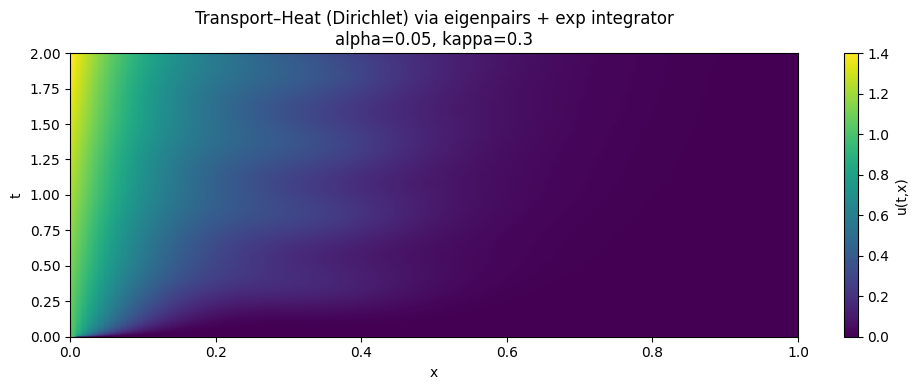

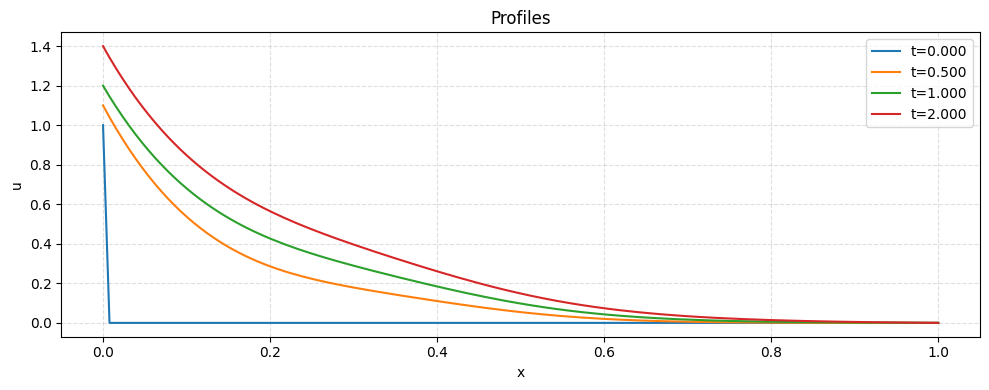

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1) Problem setup (1D box [0,c])
# ============================================================
alpha = 0.05   # diffusion coefficient in your paper (matches D in discrete formula)
kappa = 0.3    # transport/advection speed

c = 1.0        # domain length: x in [0,c]
Nx = 128       # number of interior points (excluding boundaries)
Tsteps = 600   # number of time steps
t_end = 2.0
dt = t_end / Tsteps

# Interior grid (exclude x=0 and x=c)
h = c / (Nx + 1)
x_int = np.linspace(h, c - h, Nx)  # size Nx

# Boundary functions a(t), b(t)
T_room = 1.0
gamma  = 0.2
T_cold = 0.0

def a_of_t(t):
    return T_room + gamma * t

def b_of_t(t):
    return T_cold

# Source f(t,x) ~ sin^2(omega t) * exp(-(x-x0)^2 / (2 sigma^2)) (1D)
omega = 2.0 * np.pi
x0 = 0.35
sigma = 0.08

def f_of_tx(t, x):
    # matches your "sin^2 * exp(-||x-x0||^2)" style; keep sigma explicit
    return (np.sin(omega * t) ** 2) * np.exp(-((x - x0) ** 2) / (2.0 * sigma**2))

# ============================================================
# 2) Build the interior operator matrix M (Nx x Nx)
#    Using paper's 1D stencil:
#      d_-1 = alpha/h^2 - kappa/h
#      d_0  = -2alpha/h^2 + kappa/h
#      d_+1 = alpha/h^2
# ============================================================
d_m1 = alpha / (h * h) - kappa / h
d_0  = -2.0 * alpha / (h * h) + kappa / h
d_p1 = alpha / (h * h)

M = np.zeros((Nx, Nx), dtype=float)
np.fill_diagonal(M, d_0)
np.fill_diagonal(M[1:, :-1], d_m1)  # lower diagonal
np.fill_diagonal(M[:-1, 1:], d_p1)  # upper diagonal

# ============================================================
# 3) Eigenpairs of M (dense, OK for Nx~128)
#    Then exponential integrator in eigen-coordinates
# ============================================================
eigvals, V = np.linalg.eig(M)         # M = V diag(eigvals) V^{-1}
Vinv = np.linalg.inv(V)

# helper: phi1(z) = (e^z - 1)/z with stable handling near z=0
def phi1(z):
    out = np.empty_like(z, dtype=np.complex128)
    small = np.abs(z) < 1e-12
    out[small] = 1.0 + z[small]/2.0 + (z[small]**2)/6.0
    out[~small] = (np.exp(z[~small]) - 1.0) / z[~small]
    return out

E = np.exp(eigvals * dt)              # elementwise
Phi1 = phi1(eigvals * dt)             # elementwise

# ============================================================
# 4) Time stepping for interior u(t) with Dirichlet boundaries
#    rhs(t) = f_int(t) + boundary-contribution(t)
# ============================================================
U_int = np.zeros((Tsteps + 1, Nx), dtype=float)

# initial condition u(0,x) (can be 0 or small random)
U_int[0] = 0.0

def rhs(t):
    """
    Build rhs vector for interior equation:
      u_t = M u + f(t,x_int) + boundary_terms(t)
    Boundary terms come from the stencil touching u_0=a(t) and u_{Nx+1}=b(t).
    """
    r = f_of_tx(t, x_int).astype(float)

    a = a_of_t(t)
    b = b_of_t(t)

    # i=1 interior corresponds to x=h; stencil uses u_{i-1} = u_0 = a(t)
    # contribution from diffusion + advection term to row 0 due to u_{i-1}:
    #   d_m1 * u_{i-1}  adds to M u, so move to rhs: + d_m1 * a(t)
    r[0] += d_m1 * a

    # last interior i=Nx uses u_{i+1} = u_{Nx+1} = b(t) with coefficient d_p1
    r[-1] += d_p1 * b

    return r

# advance using diagonalized exponential integrator:
# u_{n+1} = V[ E * (Vinv u_n) + dt*Phi1 * (Vinv rhs(t_n)) ]
for n in range(Tsteps):
    t_n = n * dt

    u_n = U_int[n]
    g_n = rhs(t_n)

    c_n = Vinv @ u_n
    d_n = Vinv @ g_n

    c_np1 = E * c_n + dt * Phi1 * d_n
    u_np1 = V @ c_np1

    U_int[n + 1] = np.real(u_np1)

# ============================================================
# 5) Build full solution including boundary points for plotting
# ============================================================
x_full = np.linspace(0.0, c, Nx + 2)
U_full = np.zeros((Tsteps + 1, Nx + 2), dtype=float)

for n in range(Tsteps + 1):
    t = n * dt
    U_full[n, 0]    = a_of_t(t)
    U_full[n, -1]   = b_of_t(t)
    U_full[n, 1:-1] = U_int[n]

# ============================================================
# 6) Quick visualization
# ============================================================
# heatmap: time vs x
plt.figure(figsize=(10, 4))
plt.imshow(U_full, aspect="auto", origin="lower",
           extent=[0, c, 0, t_end])
plt.colorbar(label="u(t,x)")
plt.xlabel("x")
plt.ylabel("t")
plt.title("Transport–Heat (Dirichlet) via eigenpairs + exp integrator\n"
          f"alpha={alpha}, kappa={kappa}")
plt.tight_layout()
plt.show()

# profiles at a few times
plt.figure(figsize=(10, 4))
for frac in [0.0, 0.25, 0.5, 1.0]:
    idx = int(frac * Tsteps)
    plt.plot(x_full, U_full[idx], label=f"t={idx*dt:.3f}")
plt.grid(True, ls="--", alpha=0.4)
plt.xlabel("x")
plt.ylabel("u")
plt.title("Profiles")
plt.legend()
plt.tight_layout()
plt.show()

#### 2D-Transport Heat Equations

#### Matrix Iterations to Compute $u(t,x)$
To compute the solution $u(t,x)$ numerically, we discretize the time domain into small intervals of size $\Delta t$. At each time step, we update the coefficients $A_m(t)$ using the previously computed values and the forcing term $B_m(t)$. The following algorithm outlines the steps to compute $u(t,x)$ iteratively:
$$M_{2D} = (M_x \otimes I_y) + (I_x \otimes M_y), \quad u_{n+1} = e^{A\Delta t} u_n + (\Delta t) \varphi_{1}(A\Delta t) g(t_n)$$

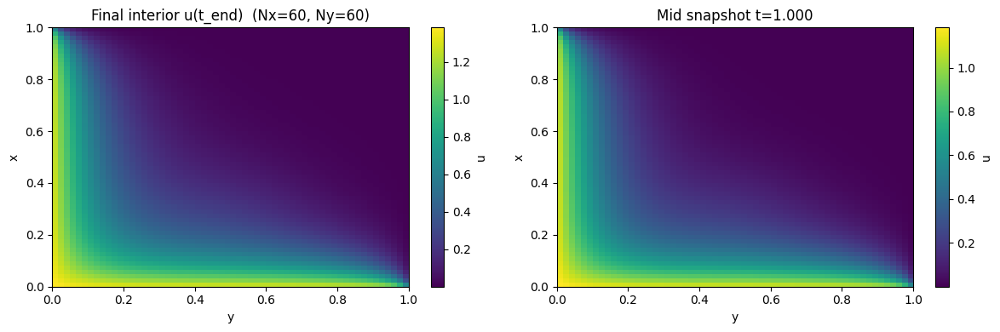

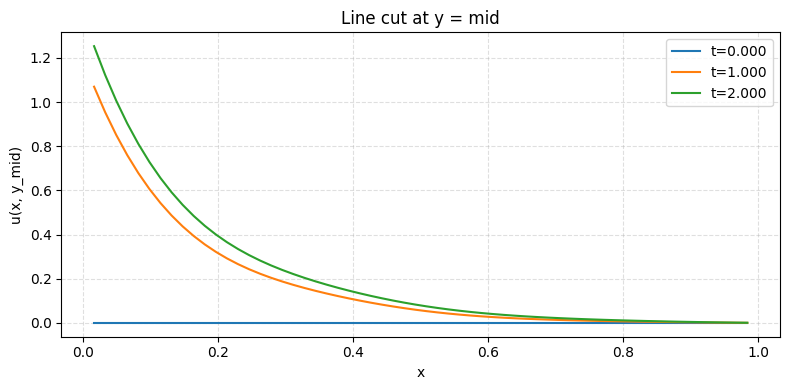

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import diags, identity, kron, csc_matrix
from scipy.sparse.linalg import expm_multiply

# ============================================================
# Constants (your request)
# ============================================================
alpha = 0.05
kappa = 0.3          # scalar; we use kappa_x = kappa_y = kappa

# Domain [0,cx] x [0,cy]
cx, cy = 1.0, 1.0

# Interior resolution (exclude boundaries)
Nx, Ny = 60, 60      # interior points; total unknowns N = Nx*Ny
t_end = 2.0
Tsteps = 400
dt = t_end / Tsteps

# ------------------------------------------------------------
# Boundary functions (simple consistent 2D Dirichlet choice)
# left/bottom -> a(t), right/top -> b(t)
# (If you want different per-side boundary functions, easy to swap.)
# ------------------------------------------------------------
T_room, gamma = 1.0, 0.2
T_cold = 0.0

def a_of_t(t): return T_room + gamma * t
def b_of_t(t): return T_cold

# ------------------------------------------------------------
# Source: sin^2(omega t) * exp(-||x-x0||^2/(2 sigma^2))
# ------------------------------------------------------------
omega = 2*np.pi
x0, y0 = 0.35, 0.55
sigma = 0.08

def f_of_txy(t, X, Y):
    return (np.sin(omega*t)**2) * np.exp(-((X-x0)**2 + (Y-y0)**2)/(2*sigma**2))

# ============================================================
# 1) Build 1D operator Mx, My on interior points
#    Paper’s 1D stencil:
#      d_-1 = alpha/h^2 - kappa/h
#      d_0  = -2alpha/h^2 + kappa/h
#      d_+1 = alpha/h^2
# ============================================================
hx = cx / (Nx + 1)
hy = cy / (Ny + 1)

def build_M1D(N, h, alpha, kappa):
    d_m1 = alpha/(h*h) - kappa/h
    d_0  = -2*alpha/(h*h) + kappa/h
    d_p1 = alpha/(h*h)

    main = d_0 * np.ones(N)
    low  = d_m1 * np.ones(N-1)
    up   = d_p1 * np.ones(N-1)
    return diags([low, main, up], offsets=[-1, 0, 1], format="csc")

Mx = build_M1D(Nx, hx, alpha, kappa)
My = build_M1D(Ny, hy, alpha, kappa)

# ============================================================
# 2) Kronecker-sum: A = (Ix ⊗ My) + (Mx ⊗ Iy)
#    Flatten ordering: u_vec corresponds to u[i,j] with j fastest
# ============================================================
Ix = identity(Nx, format="csc")
Iy = identity(Ny, format="csc")
A = kron(Ix, My) + kron(Mx, Iy)   # (Nx*Ny, Nx*Ny)
A = csc_matrix(A)

# ============================================================
# 3) Grid (interior)
# ============================================================
x_int = np.linspace(hx, cx-hx, Nx)
y_int = np.linspace(hy, cy-hy, Ny)
Xg, Yg = np.meshgrid(x_int, y_int, indexing="ij")   # shape (Nx,Ny)

def vec(U2):
    # U2 shape (Nx,Ny) -> vector (Nx*Ny,)
    return U2.reshape(-1, order="C")

def mat(uvec):
    # vector -> (Nx,Ny)
    return uvec.reshape((Nx,Ny), order="C")

# ============================================================
# 4) RHS g(t): forcing + Dirichlet boundary contributions
#    For each interior node (i,j):
#      x-diffusion/advection touches x-boundaries at i=1 or i=Nx
#      y-diffusion/advection touches y-boundaries at j=1 or j=Ny
# ============================================================
# Precompute stencil coefficients for each axis
dx_m1 = alpha/(hx*hx) - kappa/hx
dx_p1 = alpha/(hx*hx)
dy_m1 = alpha/(hy*hy) - kappa/hy
dy_p1 = alpha/(hy*hy)

def rhs(t):
    F = f_of_txy(t, Xg, Yg).astype(float)

    a = a_of_t(t)
    b = b_of_t(t)

    # Add boundary contributions:
    # x-left boundary affects i=0 interior row (i=1 in physical indexing) via lower-diagonal coeff dx_m1 * u_{i-1}
    F[0, :] += dx_m1 * a
    # x-right boundary affects i=Nx-1 interior row via upper-diagonal coeff dx_p1 * u_{i+1}
    F[-1, :] += dx_p1 * b

    # y-bottom boundary affects j=0 interior col via lower-diagonal coeff dy_m1 * u_{j-1}
    F[:, 0] += dy_m1 * a
    # y-top boundary affects j=Ny-1 interior col via upper-diagonal coeff dy_p1 * u_{j+1}
    F[:, -1] += dy_p1 * b

    return vec(F)

# ============================================================
# 5) Exponential Euler step:
#    u_{n+1} = exp(A dt) u_n + dt*phi1(A dt) g_n
#    Compute both with expm_multiply using an augmented matrix trick.
# ============================================================
N = Nx * Ny
Z = csc_matrix((N, N))
I = identity(N, format="csc")

# Block matrix B = [[A, I],
#                   [0, 0]]
# exp(B dt) @ [0; g] = [dt*phi1(A dt) g ; g]
B = csc_matrix(
    np.block([
        [A.toarray(), np.eye(N)],
        [np.zeros((N, N)), np.zeros((N, N))]
    ])
)
# NOTE: building B dense via toarray() is fine for ~Nx*Ny up to a few thousand.
# For larger grids, ask and I’ll give the fully sparse block assembly (no densification).

# Initial interior condition (can be 0 or noise)
u = np.zeros(N, dtype=float)

# Store snapshots for visualization
snap_every = max(1, Tsteps // 40)
snaps = []
ts = []

for n in range(Tsteps + 1):
    t = n * dt
    if n % snap_every == 0:
        snaps.append(mat(u).copy())
        ts.append(t)

    if n == Tsteps:
        break

    g = rhs(t)

    # exp(A dt) u
    Eu = expm_multiply(A * dt, u)

    # dt*phi1(A dt) g via block trick
    w0 = np.concatenate([np.zeros(N), g])
    w1 = expm_multiply(B * dt, w0)
    phig = w1[:N]   # this equals dt*phi1(A dt) g

    u = Eu + phig

# ============================================================
# 6) Plot snapshots + final field
# ============================================================
snaps = np.array(snaps)  # (Nsnap, Nx, Ny)

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.imshow(snaps[-1], origin="lower", aspect="auto",
           extent=[0, cy, 0, cx])
plt.colorbar(label="u")
plt.title(f"Final interior u(t_end)  (Nx={Nx}, Ny={Ny})")
plt.xlabel("y")
plt.ylabel("x")

plt.subplot(1, 2, 2)
mid = len(snaps)//2
plt.imshow(snaps[mid], origin="lower", aspect="auto",
           extent=[0, cy, 0, cx])
plt.colorbar(label="u")
plt.title(f"Mid snapshot t={ts[mid]:.3f}")
plt.xlabel("y")
plt.ylabel("x")

plt.tight_layout()
plt.show()

# Optional: show a line cut y = mid
jmid = Ny // 2
plt.figure(figsize=(8, 4))
for k in [0, len(snaps)//2, len(snaps)-1]:
    plt.plot(x_int, snaps[k][:, jmid], label=f"t={ts[k]:.3f}")
plt.grid(True, ls="--", alpha=0.4)
plt.xlabel("x")
plt.ylabel("u(x, y_mid)")
plt.title("Line cut at y = mid")
plt.legend()
plt.tight_layout()
plt.show()

In [1]:
import numpy as np

# ----------------------------
# Problem constants (yours)
# ----------------------------
alpha = 0.05                 # diffusion coefficient
kappa = 0.3                  # transport strength (scalar)
kappa_vec = np.array([kappa, kappa], dtype=float)  # choose direction; edit if needed

# ----------------------------
# Domain + grids
# ----------------------------
def make_grid(c1=1.0, c2=1.0, Nx=64, Ny=64):
    x = np.linspace(0.0, c1, Nx, endpoint=False)   # interior-ish periodic sampling; OK for quadrature
    y = np.linspace(0.0, c2, Ny, endpoint=False)
    dx = c1 / Nx
    dy = c2 / Ny
    X, Y = np.meshgrid(x, y, indexing="ij")        # (Nx,Ny)
    return x, y, X, Y, dx, dy

# ----------------------------
# Sine eigenbasis matrices
#   phi_{m1,m2}(x,y)=sin(m1*pi*x/c1)*sin(m2*pi*y/c2)
# ----------------------------
def sine_basis_1d(grid, c, Mmax):
    # returns S[m-1,i] = sin(m*pi*x_i/c), m=1..Mmax
    m = np.arange(1, Mmax + 1)[:, None]            # (Mmax,1)
    return np.sin(m * np.pi * grid[None, :] / c)   # (Mmax,N)

def laplacian_eigs_2d(c1, c2, Mx, My):
    mx = np.arange(1, Mx + 1, dtype=float)
    my = np.arange(1, My + 1, dtype=float)
    lamx = alpha * (mx * np.pi / c1) ** 2          # (Mx,)
    lamy = alpha * (my * np.pi / c2) ** 2          # (My,)
    lam2d = lamx[:, None] + lamy[None, :]          # Kronecker-sum eigenvalues (Mx,My)
    return lam2d

# ----------------------------
# Boundary shift w(t,x,y)
# Use your "linear along c" form:
#   w(t, x) = a(t) + (b(t)-a(t))/||c||^2 * (x·c)
# In 2D: c = (c1,c2), x=(x,y)
# ----------------------------
def a_t(t, T_room=1.0, gamma=0.0):
    return T_room + gamma * t

def b_t(t, T_cold=0.0):
    return T_cold

def w_and_derivs(t, X, Y, c1, c2, T_room=1.0, gamma=0.0, T_cold=0.0):
    cvec = np.array([c1, c2], dtype=float)
    cn2 = float(np.dot(cvec, cvec)) + 1e-15

    a = a_t(t, T_room=T_room, gamma=gamma)
    b = b_t(t, T_cold=T_cold)

    # x·c = x*c1 + y*c2
    xdotc = X * c1 + Y * c2

    w = a + (b - a) * (xdotc / cn2)

    # time derivative: a'(t)=gamma, b'(t)=0
    a_dot = gamma
    b_dot = 0.0
    w_t = a_dot + (b_dot - a_dot) * (xdotc / cn2)

    # gradient is constant in space for this linear w:
    # ∇w = (b-a)/||c||^2 * c
    gradw = ((b - a) / cn2) * cvec                  # (2,)
    return w, w_t, gradw

# ----------------------------
# Source term f(t,x,y): your "Gaussian-like" version
#   f(t,x)=sin^2(omega t) * exp(-||x-x0||^2)
# ----------------------------
def source_f(t, X, Y, x0=(0.5, 0.5), omega=2*np.pi):
    dx = X - x0[0]
    dy = Y - x0[1]
    return (np.sin(omega * t) ** 2) * np.exp(-(dx*dx + dy*dy))

# ----------------------------
# Project a field F(x,y) to sine coefficients:
#   C[m1,m2] = (4/(c1*c2)) ∫∫ F sin(...) sin(...) dx dy
# Quadrature: uniform Riemann sum.
# ----------------------------
def project_to_sines(Fxy, Sx, Sy, dx, dy, c1, c2):
    # Sx: (Mx,Nx), Sy: (My,Ny), Fxy: (Nx,Ny)
    # coeff = norm * dx*dy * (Sx @ F @ Sy^T)
    norm = 4.0 / (c1 * c2)
    return norm * dx * dy * (Sx @ Fxy @ Sy.T)       # (Mx,My)

# ----------------------------
# Main: compute A0, B(t), evolve A(t)
# ----------------------------
def solve_coeffs_2d(
    u0_xy,                    # array (Nx,Ny) initial u(0,x,y)
    c1=1.0, c2=1.0,
    Nx=64, Ny=64,
    Mx=20, My=20,
    tgrid=None,               # 1D array of times
    T_room=1.0, gamma=0.0,
    T_cold=0.0,
    x0=(0.5, 0.5), omega=2*np.pi,
):
    x, y, X, Y, dx, dy = make_grid(c1, c2, Nx, Ny)

    # basis + eigenvalues
    Sx = sine_basis_1d(x, c1, Mx)                   # (Mx,Nx)
    Sy = sine_basis_1d(y, c2, My)                   # (My,Ny)
    lam = laplacian_eigs_2d(c1, c2, Mx, My)         # (Mx,My)

    if tgrid is None:
        tgrid = np.linspace(0.0, 1.0, 201)
    tgrid = np.asarray(tgrid, dtype=float)
    dt = np.diff(tgrid)
    if np.any(dt <= 0):
        raise ValueError("tgrid must be strictly increasing")

    # ---- A_m(0): from phi(x)=u0-w(0,x)
    w0, _, _ = w_and_derivs(0.0, X, Y, c1, c2, T_room=T_room, gamma=gamma, T_cold=T_cold)
    phi0 = u0_xy - w0
    A = np.zeros((len(tgrid), Mx, My), dtype=float)
    A[0] = project_to_sines(phi0, Sx, Sy, dx, dy, c1, c2)

    # ---- B_m(t): from F(t,x)=f(t,x)-w_t + kappa·∇w
    B = np.zeros((len(tgrid), Mx, My), dtype=float)

    for n, t in enumerate(tgrid):
        w, w_t, gradw = w_and_derivs(t, X, Y, c1, c2, T_room=T_room, gamma=gamma, T_cold=T_cold)
        f = source_f(t, X, Y, x0=x0, omega=omega)

        # scalar kappa·∇w (constant in space here)
        adv_shift = float(np.dot(kappa_vec, gradw))

        Fxy = f - w_t + adv_shift
        B[n] = project_to_sines(Fxy, Sx, Sy, dx, dy, c1, c2)

    # ---- time-march A via stable integrating-factor trapezoid:
    # A_{n+1} = r A_n + (r*dt/2) B_n + (dt/2) B_{n+1},  r = exp(-lam*dt)
    for n in range(len(tgrid) - 1):
        h = float(tgrid[n+1] - tgrid[n])
        r = np.exp(-lam * h)
        A[n+1] = r * A[n] + (r * h * 0.5) * B[n] + (h * 0.5) * B[n+1]

    return {
        "t": tgrid,
        "A": A,            # (Nt,Mx,My)
        "B": B,            # (Nt,Mx,My)
        "lambda": lam,     # (Mx,My)
        "x": x, "y": y, "X": X, "Y": Y,
        "Sx": Sx, "Sy": Sy,
        "dx": dx, "dy": dy,
    }

# ----------------------------
# Optional: reconstruct u(t,x,y) from coefficients (truncated series)
# u = w(t,x,y) + sum_{m1,m2} A(t,m1,m2) sin(..)sin(..)
# ----------------------------
def reconstruct_u_from_A(sol, t_index, c1, c2, T_room=1.0, gamma=0.0, T_cold=0.0):
    t = sol["t"][t_index]
    X = sol["X"]; Y = sol["Y"]
    Sx = sol["Sx"]; Sy = sol["Sy"]
    A = sol["A"][t_index]                          # (Mx,My)

    w, _, _ = w_and_derivs(t, X, Y, c1, c2, T_room=T_room, gamma=gamma, T_cold=T_cold)

    # v(x,y) = sum_{m1,m2} A[m1,m2] sin_m1(x) sin_m2(y)
    # use matrix multiply: (Sx^T @ A @ Sy) with shapes (Nx,Mx)(Mx,My)(My,Ny) -> (Nx,Ny)
    v = (Sx.T @ A @ Sy)
    return w + v

def main():
    # ----------------------------
    # 1) Choose domain + discretization
    # ----------------------------
    c1, c2 = 1.0, 1.0
    Nx, Ny = 96, 96          # quadrature grid for integrals
    Mx, My = 20, 20          # truncation (series modes)
    tgrid = np.linspace(0.0, 2.0, 301)

    # ----------------------------
    # 2) Boundary data (your paper)
    # ----------------------------
    T_room = 1.0
    gamma  = 0.20            # ramp rate for a(t)
    T_cold = 0.0             # constant b(t)

    # (These are already used by w_and_derivs via a_t, b_t)
    # a(t) = T_room + gamma t
    # b(t) = T_cold

    # ----------------------------
    # 3) Source parameters (Gaussian-like forcing)
    # ----------------------------
    x0 = (0.45, 0.60)
    omega = 2.0 * np.pi

    # ----------------------------
    # 4) Build a test initial condition u0(x,y)
    #    Goal: nontrivial interior + consistent with boundaries at t=0.
    #    Easiest: set u0 = w(0,x,y) + v0 where v0 vanishes on the boundary.
    # ----------------------------
    x, y, X, Y, dx, dy = make_grid(c1, c2, Nx, Ny)

    w0, _, _ = w_and_derivs(
        0.0, X, Y, c1, c2,
        T_room=T_room, gamma=gamma, T_cold=T_cold
    )

    # v0 chosen to satisfy Dirichlet zero on boundary (sine-sine shape)
    v0 = 0.25 * np.sin(np.pi * X / c1) * np.sin(2.0 * np.pi * Y / c2)

    # small Gaussian bump in interior (also vanishes at boundary after multiplication)
    bump = 0.15 * np.exp(-((X - 0.3) ** 2 + (Y - 0.7) ** 2) / (2 * 0.06 ** 2))
    v0 += bump * np.sin(np.pi * X / c1) * np.sin(np.pi * Y / c2)

    u0 = w0 + v0

    # ----------------------------
    # 5) Solve coefficients A_m(t), B_m(t)
    # ----------------------------
    sol = solve_coeffs_2d(
        u0_xy=u0,
        c1=c1, c2=c2,
        Nx=Nx, Ny=Ny,
        Mx=Mx, My=My,
        tgrid=tgrid,
        T_room=T_room, gamma=gamma,
        T_cold=T_cold,
        x0=x0, omega=omega,
    )

    # ----------------------------
    # 6) Quick boundary check on reconstruction at a few times
    #    Dirichlet: u(t,0,*) = a(t), u(t,c,*) = b(t) in the paper statement.
    #    NOTE: with this w(t,x,y) form, the corners match exactly, edges are "linear shift"
    #    and the sine series contributes ~0 on boundaries (truncation => small residue).
    # ----------------------------
    sample_indices = [0, len(tgrid)//2, len(tgrid)-1]
    for ti in sample_indices:
        t = sol["t"][ti]
        u_rec = reconstruct_u_from_A(sol, ti, c1, c2, T_room=T_room, gamma=gamma, T_cold=T_cold)

        # Evaluate edges
        left   = u_rec[0, :]          # x=0
        right  = u_rec[-1, :]         # x~c1
        bottom = u_rec[:, 0]          # y=0
        top    = u_rec[:, -1]         # y~c2

        # target boundary values according to your a(t), b(t)
        at = a_t(t, T_room=T_room, gamma=gamma)
        bt = b_t(t, T_cold=T_cold)

        # report mean absolute deviations vs a(t), b(t)
        # (because your w(t,x,y) is not per-edge Dirichlet; this is a sanity metric)
        print(f"\n[t={t:.3f}] a(t)={at:.6f}, b(t)={bt:.6f}")
        print(f"  |u(x=0, y)-a(t)|   mean={np.mean(np.abs(left-at)):.3e}  max={np.max(np.abs(left-at)):.3e}")
        print(f"  |u(x≈c1,y)-b(t)|   mean={np.mean(np.abs(right-bt)):.3e} max={np.max(np.abs(right-bt)):.3e}")

        # also show corner values (these are the most meaningful for your w-form)
        print(f"  corners: u(0,0)={u_rec[0,0]:.6f}, u(c1,c2)={u_rec[-1,-1]:.6f}")

    # Optional: return sol for interactive inspection
    return sol


if __name__ == "__main__":
    sol = main()


[t=0.000] a(t)=1.000000, b(t)=0.000000
  |u(x=0, y)-a(t)|   mean=2.474e-01  max=4.948e-01
  |u(x≈c1,y)-b(t)|   mean=2.578e-01 max=5.052e-01
  corners: u(0,0)=1.000000, u(c1,c2)=0.009882

[t=1.000] a(t)=1.200000, b(t)=0.000000
  |u(x=0, y)-a(t)|   mean=2.969e-01  max=5.937e-01
  |u(x≈c1,y)-b(t)|   mean=3.066e-01 max=6.063e-01
  corners: u(0,0)=1.200000, u(c1,c2)=0.011779

[t=2.000] a(t)=1.400000, b(t)=0.000000
  |u(x=0, y)-a(t)|   mean=3.464e-01  max=6.927e-01
  |u(x≈c1,y)-b(t)|   mean=3.561e-01 max=7.073e-01
  corners: u(0,0)=1.400000, u(c1,c2)=0.013663


In [2]:
def w_and_derivs_const_linear(t, X, Y, c1, c2, a=1.0, e=0.0, f=0.0):
    """
    Time-independent boundary shift using s(x)=(x·c)/||c||.

      w(x) = a + (s/L) * (e*s + f - a),  L=||c||.

    Then:
      w(0)=a, w(c)=e*L+f.
    """
    cvec = np.array([c1, c2], dtype=float)
    L = float(np.linalg.norm(cvec)) + 1e-15

    # s(x) = (x·c)/||c||
    s = (X * c1 + Y * c2) / L

    w = a + (s / L) * (e * s + f - a)
    w_t = 0.0

    # grad w: depends on s(x)
    dw_ds = (2.0 * e * s + (f - a)) / L
    gradw_x = dw_ds * (c1 / L)
    gradw_y = dw_ds * (c2 / L)
    return w, w_t, (gradw_x, gradw_y)

def solve_coeffs_2d(
    u0_xy,
    c1=1.0, c2=1.0, Nx=64, Ny=64, Mx=20, My=20,
    tgrid=None,
    a_const=1.0, e_const=0.0, f_const=0.0,
    x0=(0.5, 0.5), omega=2*np.pi,
):
    x, y, X, Y, dx, dy = make_grid(c1, c2, Nx, Ny)

    Sx = sine_basis_1d(x, c1, Mx)
    Sy = sine_basis_1d(y, c2, My)
    lam = laplacian_eigs_2d(c1, c2, Mx, My)

    if tgrid is None:
        tgrid = np.linspace(0.0, 1.0, 201)
    tgrid = np.asarray(tgrid, dtype=float)

    # A(0): phi = u0 - w(0)
    w0, _, _ = w_and_derivs_const_linear(0.0, X, Y, c1, c2, a=a_const, e=e_const, f=f_const)
    phi0 = u0_xy - w0

    A = np.zeros((len(tgrid), Mx, My), dtype=float)
    A[0] = project_to_sines(phi0, Sx, Sy, dx, dy, c1, c2)

    B = np.zeros((len(tgrid), Mx, My), dtype=float)

    for n, t in enumerate(tgrid):
        w, w_t, (gwx, gwy) = w_and_derivs_const_linear(t, X, Y, c1, c2, a=a_const, e=e_const, f=f_const)
        fxy = source_f(t, X, Y, x0=x0, omega=omega)

        # kappa·∇w (now spatially varying)
        adv_shift = kappa_vec[0] * gwx + kappa_vec[1] * gwy

        Fxy = fxy - w_t + adv_shift
        B[n] = project_to_sines(Fxy, Sx, Sy, dx, dy, c1, c2)

    for n in range(len(tgrid) - 1):
        h = float(tgrid[n+1] - tgrid[n])
        r = np.exp(-lam * h)
        A[n+1] = r * A[n] + (r * h * 0.5) * B[n] + (h * 0.5) * B[n+1]

    return {"t": tgrid, "A": A, "B": B, "lambda": lam,
            "x": x, "y": y, "X": X, "Y": Y, "Sx": Sx, "Sy": Sy, "dx": dx, "dy": dy}
    
def main():
    # ----------------------------
    # 1) Domain + discretization
    # ----------------------------
    c1, c2 = 1.0, 1.0
    Nx, Ny = 96, 96
    Mx, My = 20, 20
    tgrid = np.linspace(0.0, 2.0, 301)

    # ----------------------------
    # 2) NEW boundary data (constants)
    # u(t,0)=a, u(t,c)=e*x+f  (interpreted along c-direction)
    # ----------------------------
    a_const = 1.0
    e_const = 0.7
    f_const = 0.2

    # ----------------------------
    # 3) Source parameters
    # ----------------------------
    x0 = (0.45, 0.60)
    omega = 2.0 * np.pi

    # ----------------------------
    # 4) Initial condition u0 = w(0)+v0, with v0 vanishing on boundary
    # ----------------------------
    x, y, X, Y, dx, dy = make_grid(c1, c2, Nx, Ny)

    w0, _, _ = w_and_derivs_const_linear(
        0.0, X, Y, c1, c2,
        a=a_const, e=e_const, f=f_const
    )

    v0 = 0.25 * np.sin(np.pi * X / c1) * np.sin(2.0 * np.pi * Y / c2)
    bump = 0.15 * np.exp(-((X - 0.3) ** 2 + (Y - 0.7) ** 2) / (2 * 0.06 ** 2))
    v0 += bump * np.sin(np.pi * X / c1) * np.sin(np.pi * Y / c2)

    u0 = w0 + v0

    # ----------------------------
    # 5) Solve coefficients
    # ----------------------------
    sol = solve_coeffs_2d(
        u0_xy=u0,
        c1=c1, c2=c2,
        Nx=Nx, Ny=Ny,
        Mx=Mx, My=My,
        tgrid=tgrid,
        a_const=a_const, e_const=e_const, f_const=f_const,
        x0=x0, omega=omega,
    )

    # ----------------------------
    # 6) Boundary check (corners + along-c point)
    # ----------------------------
    L = np.sqrt(c1*c1 + c2*c2)
    target_at_0 = a_const
    target_at_c = e_const * L + f_const

    sample_indices = [0, len(tgrid)//2, len(tgrid)-1]
    for ti in sample_indices:
        t = sol["t"][ti]
        u_rec = reconstruct_u_from_A(sol, ti, c1, c2, T_room=0, gamma=0, T_cold=0)  # <-- ignore these

        # corners (most meaningful for the shift construction)
        print(f"\n[t={t:.3f}] targets: u(0)=a={target_at_0:.6f}, u(c)=e||c||+f={target_at_c:.6f}")
        print(f"  u(0,0)      = {u_rec[0,0]:.6f}")
        print(f"  u(c1,c2)    = {u_rec[-1,-1]:.6f}")

        # optional: check a point near the diagonal x=y (along c-direction)
        mid = Nx//2
        print(f"  u(mid,mid)  = {u_rec[mid,mid]:.6f}")

    return sol


if __name__ == "__main__":
    sol = main()


[t=0.000] targets: u(0)=a=1.000000, u(c)=e||c||+f=1.189949
  u(0,0)      = 0.000000
  u(c1,c2)    = -0.000535
  u(mid,mid)  = 0.000002

[t=1.000] targets: u(0)=a=1.000000, u(c)=e||c||+f=1.189949
  u(0,0)      = 0.000000
  u(c1,c2)    = 0.002025
  u(mid,mid)  = 0.453693

[t=2.000] targets: u(0)=a=1.000000, u(c)=e||c||+f=1.189949
  u(0,0)      = 0.000000
  u(c1,c2)    = 0.002293
  u(mid,mid)  = 0.645734


#### Hermite Polynomials and Orthonormal Hermite Matrices
The Hermite polynomials $H_n(x)$ are orthogonal polynomials defined on the interval $(-\infty, \infty)$ with respect to the weight function $w(x) = e^{-x^2}$. They satisfy the orthogonality condition:
$$
\begin{cases}
\int_{-\infty}^{\infty} H_m(x) H_n(x) e^{-x^2} \text{d}x = 2^{n} n! \sqrt{\pi} \delta_{mn}\\
\int_{-\infty}^{\infty} H_{e_m}(x) H_{e_n}(x) \frac{e^{-x^2/2}}{\sqrt{2\pi}} \text{d}x = n!\delta_{mn}
\end{cases}
$$
$$H_{n+1}(x) = 2xH_{n}(x) - 2n H_{n-1}(x), \quad H'_{n}(x) = 2nH_{n-1}(x), \quad H_{0}(x)=1, \quad H_{1}(x)=2x$$
Where the hermite polynomial is given explicit by
$$H_n(x) = (-1)^n e^{x^2} \frac{\text{d}^n}{\text{d}x^n} \big(e^{-x^2}\big) = n! \sum_{k=0}^{\lfloor \frac{n}{2}\rfloor} \frac{(-1)^{k}}{k!(n-2k)!} (2x)^{n-2k}$$
The orthonormal Hermite polynomials $\tilde{H}_n(x)$ can be defined as:
$$\tilde{H}_n(x) = \frac{1}{\sqrt{
2^n n! \sqrt{\pi}}} H_n(x), \quad \sum_{i=0}^{n}H_{i}(x) = 1$$
The non-recursive closed forms for Hermite Polynomial and the $\mathit{orthonormal}$ shifted Hermite Polynomial are:
$$H_n(x) = \frac{1}{\sqrt{2\pi}} \int_{-\infty}^{\infty} (ix)^n e^{-x^2/2} e^{-ixt} \text{d}t, \quad \vec{w}_n(x) = \int_{a}^{b} H_{i}(x) \text{d} x = \frac{1}{\sqrt{n!}} \sum_{k=0}^{\lfloor n/2 \rfloor} \frac{(-1)^k n!}{k!(n-2k)! 2^k} x^{n-2k}$$
$$H_n(x) = \sum_{i=0}^{n} w_i f(x_i) = \sum_{i=0}^{n} \int_{a}^{b} H_{i}(x)f(x_i) \text{d} x = \int_{a}^{b} f(x_i) \Bigg(\sum_{i=0}^{n}H_{i}(x)\Bigg)\text{d} x = \int_{a}^{b} f(x_i) \cdot 1 \text{d} x = F(b) - F(a)$$

##### The Generating Function ($\mathcal{GF}$) Relation to $H_{n}(x)$
The generating function for Hermite polynomials is given by:
$$\mathcal{GF}(x,t) = e^{2xt - t^2} = \sum_{n=0}^{\infty} H_n(x) \frac{t^n}{n!}$$

The Orthonormal Hermite Matrices for the iterative approach to the numerical solution is
$$H_{nD} = \bigoplus_{i = 1}^{n} H_{x_n} = H_{x_1} \oplus H_{x_2} \oplus \cdots \oplus H_{x_n}, \quad H_{2D} = (H_x \otimes I_y) + (I_x \otimes H_y)$$
where the $n$-th dimensional hermite matrix, $H_{nD}$ is given by
$$(H_{nD}u)_{i,j} = \mathscr{D} \sum_{k=1}^{n} \frac{u_{i+e_k} - 2u_i + u_{i-e_k}}{h^2} + \kappa \sum_{k=1}^{n} \frac{u_i - u_{i-e_k}}{h}, \quad f=0, \quad \Delta w = 0$$

#### 3D-Transport Heat Equations
To solve the 3D transport heat equation numerically, we extend the previous approach to three spatial dimensions. The discretized matrix for the 3D case is given by:
$$M_{3D} = (M_x \otimes I_y \otimes I
_z) + (I_x \otimes M_y \otimes I_z) + (I_x \otimes I_y \otimes M_z)$$
The solution $u(t,x,y,z)$ is approximated by truncating the infinite series to
the first $M$ terms in each dimension:
$$u(t,x,y,z) \approx w(t,x,y,z) + \sum_{
m_1, m_2, m_3=1}^{M} A_{m_1, m_2, m_3}(t) \sin{\Big(\frac{m_1 \pi x}{c_1}\Big)} \sin{\Big(\frac{m_2 \pi y}{c_2}\Big)} \sin{\Big(\frac{m_3 \pi z}{c_3}\Big)}$$
The coefficients $A_{m_1, m_2, m_3}(t)$
are updated iteratively at each time step using the discretized matrix $M_{3D}$ and the forcing term $B_{m_1, m_2, m_3}(t)$:
$$A_{m_1, m_2, m_3}(t + \Delta
t) = A_{m_1, m_2, m_3}(t) e^{-\lambda_{m_1, m_2, m_3} \Delta t} + e^{-\lambda_{m_1, m_2, m_3} \Delta t} \int_{t}^{t + \Delta t} B_{m_1, m_2, m_3}(s) e^{\lambda_{m_1, m_2, m_3} s} \mathbb{d}s$$
Where the eigenvalues $\lambda_{m_1, m_2, m_3}$ are given by:
$$\lambda_{m_1, m_2, m_3} = \mathscr{D} \left(\Big(\frac{m_1 \pi}{c_1}\Big)^2 + \Big(\frac{m_2 \pi}{c_2}\Big)^2 + \Big(\frac{m_3 \pi}{c_3}\Big)^2\right)$$

This iterative approach allows us to compute the solution to the 3D transport heat equation efficiently while accounting for the effects of diffusion and advection in three spatial dimensions.

#### References
1. Evans, L. C. (2010). Partial Differential Equations (2nd)

In [6]:
import numpy as np

# ----------------------------
# constants (yours)
# ----------------------------
alpha = 0.05
kappa = 0.3
kappa_vec = np.array([kappa, kappa, kappa], dtype=float)  # advection direction


# ----------------------------
# grid
# ----------------------------
def make_grid_3d(c1=1.0, c2=1.0, c3=1.0, Nx=32, Ny=32, Nz=32):
    x = np.linspace(0.0, c1, Nx, endpoint=False)
    y = np.linspace(0.0, c2, Ny, endpoint=False)
    z = np.linspace(0.0, c3, Nz, endpoint=False)
    dx, dy, dz = c1 / Nx, c2 / Ny, c3 / Nz
    X, Y, Z = np.meshgrid(x, y, z, indexing="ij")  # (Nx,Ny,Nz)
    return x, y, z, X, Y, Z, dx, dy, dz


# ----------------------------
# sine basis + eigenvalues
#   Sx[a,i] = sin((a+1)*pi*x_i/c1), etc.
# ----------------------------
def sine_basis_1d(grid, c, Mmax):
    m = np.arange(1, Mmax + 1)[:, None]  # (M,1)
    return np.sin(m * np.pi * grid[None, :] / c)   # (M,N)

def laplacian_eigs_3d(c1, c2, c3, Mx, My, Mz):
    mx = np.arange(1, Mx + 1, dtype=float)
    my = np.arange(1, My + 1, dtype=float)
    mz = np.arange(1, Mz + 1, dtype=float)
    lamx = alpha * (mx * np.pi / c1) ** 2
    lamy = alpha * (my * np.pi / c2) ** 2
    lamz = alpha * (mz * np.pi / c3) ** 2
    return lamx[:, None, None] + lamy[None, :, None] + lamz[None, None, :]


# ----------------------------
# boundary shift w(t,x) options
# ----------------------------
def a_t(t, T_room=1.0, gamma=0.0):
    return T_room + gamma * t

def b_t(t, T_cold=0.0):
    return T_cold

def w_and_derivs_3d_ramp(t, X, Y, Z, c1, c2, c3, T_room=1.0, gamma=0.0, T_cold=0.0):
    """
    Your original (paper) linear shift:
      w = a(t) + (b(t)-a(t)) * (x·c)/||c||^2
    """
    cvec = np.array([c1, c2, c3], dtype=float)
    cn2 = float(np.dot(cvec, cvec)) + 1e-15

    a = a_t(t, T_room=T_room, gamma=gamma)
    b = b_t(t, T_cold=T_cold)

    xdotc = X * c1 + Y * c2 + Z * c3
    w = a + (b - a) * (xdotc / cn2)

    a_dot = gamma
    b_dot = 0.0
    w_t = a_dot + (b_dot - a_dot) * (xdotc / cn2)

    gradw = ((b - a) / cn2) * cvec  # constant in space
    return w, w_t, gradw

def w_and_derivs_3d_const_linear(t, X, Y, Z, c1, c2, c3, a=1.0, e=0.0, f=0.0):
    """
    Constant boundary style:
      u(t,0)=a, u(t,c)=e||c||+f
    using s=(x·c)/||c|| and w(s)=a + (s/L)*(e*s+f-a), L=||c||.
    """
    cvec = np.array([c1, c2, c3], dtype=float)
    L = float(np.linalg.norm(cvec)) + 1e-15

    s = (X*c1 + Y*c2 + Z*c3) / L
    w = a + (s / L) * (e * s + f - a)
    w_t = 0.0

    # dw/ds = (2 e s + (f-a))/L
    dw_ds = (2.0 * e * s + (f - a)) / L
    gradw = dw_ds[..., None] * (cvec / L)[None, None, None, :]  # (Nx,Ny,Nz,3)
    # return grad as vector constant-like interface (3,) is not valid now; but we only need kappa·gradw pointwise
    return w, w_t, gradw


# ----------------------------
# source f(t,x)
# ----------------------------
def source_f_3d(t, X, Y, Z, x0=(0.5, 0.5, 0.5), omega=2*np.pi, sigma=None):
    dx = X - x0[0]
    dy = Y - x0[1]
    dz = Z - x0[2]
    r2 = dx*dx + dy*dy + dz*dz
    amp = (np.sin(omega * t) ** 2)

    if sigma is None:
        return amp * np.exp(-r2)
    sig2 = float(sigma) ** 2
    norm = 1.0 / ((2.0 * np.pi * sig2) ** 1.5)
    return amp * norm * np.exp(-r2 / (2.0 * sig2))


# ----------------------------
# projections / reconstructions
# ----------------------------
def project_to_sines_3d(Fxyz, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3):
    """
    Sx: (Mx,Nx), Sy: (My,Ny), Sz: (Mz,Nz), Fxyz: (Nx,Ny,Nz)

    C[a,b,c] = norm * ∑_{i,j,k} Sx[a,i] Sy[b,j] Sz[c,k] F[i,j,k] dx dy dz
    """
    norm = 8.0 / (c1 * c2 * c3)
    return norm * dx * dy * dz * np.einsum("ai,bj,ck,ijk->abc", Sx, Sy, Sz, Fxyz, optimize=True)

def reconstruct_from_sines_3d(Aabc, Sx, Sy, Sz):
    """
    Aabc: (Mx,My,Mz), Sx: (Mx,Nx), Sy: (My,Ny), Sz: (Mz,Nz)

    v[i,j,k] = ∑_{a,b,c} A[a,b,c] Sx[a,i] Sy[b,j] Sz[c,k]
            = einsum('abc,ai,bj,ck->ijk')
    """
    return np.einsum("abc,ai,bj,ck->ijk", Aabc, Sx, Sy, Sz, optimize=True)


# ----------------------------
# solver (3D)
# ----------------------------
def solve_coeffs_3d(
    u0_xyz,
    c1=1.0, c2=1.0, c3=1.0,
    Nx=32, Ny=32, Nz=32,
    Mx=10, My=10, Mz=10,
    tgrid=None,
    # choose ONE boundary model by passing boundary_mode
    boundary_mode="ramp",  # "ramp" or "const_linear"
    # ramp params
    T_room=1.0, gamma=0.0, T_cold=0.0,
    # const_linear params
    a_const=1.0, e_const=0.0, f_const=0.0,
    # source
    x0=(0.5, 0.5, 0.5), omega=2*np.pi, sigma=None,
):
    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

    Sx = sine_basis_1d(x, c1, Mx)
    Sy = sine_basis_1d(y, c2, My)
    Sz = sine_basis_1d(z, c3, Mz)
    lam = laplacian_eigs_3d(c1, c2, c3, Mx, My, Mz)

    if tgrid is None:
        tgrid = np.linspace(0.0, 1.0, 101)
    tgrid = np.asarray(tgrid, dtype=float)
    if np.any(np.diff(tgrid) <= 0):
        raise ValueError("tgrid must be strictly increasing")

    Nt = len(tgrid)
    A = np.zeros((Nt, Mx, My, Mz), dtype=float)
    B = np.zeros((Nt, Mx, My, Mz), dtype=float)

    # --- w(0), phi0, A(0)
    if boundary_mode == "ramp":
        w0, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3, T_room=T_room, gamma=gamma, T_cold=T_cold)
    elif boundary_mode == "const_linear":
        w0, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3, a=a_const, e=e_const, f=f_const)
    else:
        raise ValueError("boundary_mode must be 'ramp' or 'const_linear'")

    phi0 = u0_xyz - w0
    A[0] = project_to_sines_3d(phi0, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

    # --- build B(t)
    for n, t in enumerate(tgrid):
        fsrc = source_f_3d(t, X, Y, Z, x0=x0, omega=omega, sigma=sigma)

        if boundary_mode == "ramp":
            w, w_t, gradw = w_and_derivs_3d_ramp(t, X, Y, Z, c1, c2, c3, T_room=T_room, gamma=gamma, T_cold=T_cold)
            adv_shift = float(np.dot(kappa_vec, gradw))  # scalar constant
            Fxyz = fsrc - w_t + adv_shift

        else:  # const_linear: gradw varies in space
            w, w_t, gradw_vec = w_and_derivs_3d_const_linear(t, X, Y, Z, c1, c2, c3, a=a_const, e=e_const, f=f_const)
            adv_shift = (kappa_vec[0] * gradw_vec[..., 0] +
                         kappa_vec[1] * gradw_vec[..., 1] +
                         kappa_vec[2] * gradw_vec[..., 2])  # (Nx,Ny,Nz)
            Fxyz = fsrc - w_t + adv_shift

        B[n] = project_to_sines_3d(Fxyz, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

    # --- integrating factor trapezoid
    for n in range(Nt - 1):
        h = float(tgrid[n+1] - tgrid[n])
        r = np.exp(-lam * h)
        A[n+1] = r * A[n] + 0.5 * h * (r * B[n] + B[n+1])

    return {
        "t": tgrid, "A": A, "B": B, "lambda": lam,
        "x": x, "y": y, "z": z, "X": X, "Y": Y, "Z": Z,
        "Sx": Sx, "Sy": Sy, "Sz": Sz,
        "dx": dx, "dy": dy, "dz": dz,
        "c": (c1, c2, c3),
        "boundary_mode": boundary_mode,
        "boundary_params": dict(T_room=T_room, gamma=gamma, T_cold=T_cold,
                                a_const=a_const, e_const=e_const, f_const=f_const),
    }


def reconstruct_u_3d(sol, t_index):
    t = float(sol["t"][t_index])
    c1, c2, c3 = sol["c"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    Sx, Sy, Sz = sol["Sx"], sol["Sy"], sol["Sz"]
    A = sol["A"][t_index]

    p = sol["boundary_params"]
    if sol["boundary_mode"] == "ramp":
        w, _, _ = w_and_derivs_3d_ramp(t, X, Y, Z, c1, c2, c3,
                                      T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"])
    else:
        w, _, _ = w_and_derivs_3d_const_linear(t, X, Y, Z, c1, c2, c3,
                                              a=p["a_const"], e=p["e_const"], f=p["f_const"])

    v = reconstruct_from_sines_3d(A, Sx, Sy, Sz)
    return w + v


# ----------------------------
# minimal test
# ----------------------------
if __name__ == "__main__":
    c1 = c2 = c3 = 1.0
    Nx = Ny = Nz = 32

    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

    # pick boundary model
    boundary_mode = "ramp"  # or "const_linear"

    if boundary_mode == "ramp":
        w0, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3, T_room=1.0, gamma=0.02, T_cold=0.0)
    else:
        w0, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3, a=1.0, e=0.7, f=0.2)

    # consistent u0 = w0 + v0 (v0 vanishes on boundary)
    v0 = 0.15 * np.sin(np.pi * X / c1) * np.sin(2*np.pi * Y / c2) * np.sin(np.pi * Z / c3)
    u0 = w0 + v0

    sol = solve_coeffs_3d(
        u0_xyz=u0,
        c1=c1, c2=c2, c3=c3,
        Nx=Nx, Ny=Ny, Nz=Nz,
        Mx=10, My=10, Mz=10,
        tgrid=np.linspace(0.0, 2.0, 201),
        boundary_mode=boundary_mode,
        T_room=1.0, gamma=0.02, T_cold=0.0,          # used if ramp
        a_const=1.0, e_const=0.7, f_const=0.2,        # used if const_linear
        x0=(0.5, 0.5, 0.5),
        omega=2*np.pi,
        sigma=None,
    )

    u_t = reconstruct_u_3d(sol, t_index=200)
    print(u_t.shape, np.min(u_t), np.max(u_t))

(32, 32, 32) 0.031289335537465726 1.04


#### Greens Functions on Boxed Spatial PDEs of dimension $n$
We typically represent the Green's Function as an eigenfunction expansion on the $n$-th order manifold $\mathcal{M}$ by consider the linear differential operator $\mathcal{L} \in \mathcal{H}^{\ell, q}(\mathcal{S})$ acting on $G$
$$\mathcal{L} [u] = f, \quad \mathcal{L} [G(x, y)] = \delta(x-y), \quad x, y \in \mathcal{M} \hookrightarrow \mathscr{L}^{p^{\ast}}(\mathcal{S})$$
where the Green's function can be expressed as
$$G(x, y) = \sum_{m} \frac{\phi_{m}(
x) \phi_{m}(y)}{\lambda_{m}}$$
where $\phi_{m}$ are the eigenfunctions of $\mathcal{L}$ with corresponding eigenvalues $\lambda_{m}$. This expansion allows us to compute the Green's function for higher-order spatial PDEs by leveraging the spectral properties of the operator $\mathcal{L}$.
We solve the Eigenvalue Problem to find the normalized eigenfunctions $u_n(x)$ and corresponding eigenvalues $\lambda_{n}$
$$\mathcal{L}[u_n](x) = \lambda_n u_n(x), \quad n = 1, 2, \dots$$
In this case, we construct the eigenvalue differential equation
$$(-1)^m \frac{\text{d}^{2m} u_n}{\text{d}x^{2m}} = \lambda_n u_n(x), \quad x \in [a, b], \quad 
u_n^{(j)}(a) = u_n^{(j)}(b) = 0, \quad j = 0, 1, \dots, m-1
$$
The Green's function for the $2m$-th order spatial PDE is then given by
$$G(x, y) = \sum_{n=1}^{\infty} \frac{u_n(x) u_n(y)}{\lambda_n}, \quad u_n(x) = \sqrt{\frac{2^n}{\prod_{i=1}^{n} l_{x_i}}}\prod_{i=1}^{n} \sin(\frac{m_{i}\pi x_i}{l_{x_i}}) \rightharpoonup \mathcal{M_{s}^{\ell, q}} \hookrightarrow \mathcal{H}^{\ell, q}(\mathcal{S}), \quad \lambda_{n} = \mathscr{D} \prod_{i=1}^{n} \Big(\frac{m_i \pi}{l_{x_i}}\Big)^{2}
$$
The general solution in terms of all the Fourier Coefficients is thus
$$v(x) = \int_{\mathcal{M}} G(x,y)f(y) \textbf{d}y = \sum_{i=1}^{n} \Big[ \frac{1}{\lambda_{n}} \int_{\mathcal{M}} u_n(y) f(y) \Big] u_n(x), \quad u(x) \rightharpoonup v(x)+w(x) $$
Where $w(x)$ satisfies the homogenous boundary conditions
$$\mathcal{L}[w](x) = 0, \quad x \in \mathcal{M}, \quad w^{(j)}(a) = a_j, \quad w^{(j)}(b) = b_j, \quad j = 0, 1, \dots, m-1$$

#### Greens Functions on Computing Higher-Order Spatial PDEs
General Setting on a Manifold
$$
\text{Let } (\mathcal M, g) \text{ be a compact smooth manifold possibly with boundary } \partial \mathcal M.
$$

$$
\mathcal L : H^{2m}(\mathcal M) \subset L^2(\mathcal M) \to L^2(\mathcal M) \text{ is a self-adjoint elliptic operator of order } 2m
$$
$$
\mathcal L[u] = f,
\qquad
\mathcal L_x[G(x,y)] = \delta(x-y),
\qquad
x,y \in \mathcal M.
$$

Spectral Decomposition

$$
\mathcal L[\phi_n] = \lambda_n \phi_n,
\qquad
n = 1,2,\dots
$$

where
1. ${ \phi_n }$ is an orthonormal basis of $L^2(\mathcal M)$,
2. $\lambda_n > 0$, $\lambda_n \to \infty$,
3. $\phi_n$ satisfy homogeneous boundary conditions on $\partial\mathcal M$.

The Green's function can be expressed as

$$
G(x,y) = \sum_{n=1}^{\infty} \frac{\phi_n(x)\phi_n(y)}{\lambda_n}.
$$

This series converges in $L^2(\mathcal M \times \mathcal M)$ and pointwise for $x \neq y$.
Solution Representation

$$
v(x) = \int_{\mathcal M} G(x,y) f(y) \mathrm d\mathrm{vol}(y)
$$

$$
v(x) = \sum_{n=1}^{\infty} \frac{\langle f, \phi_{n} \rangle _{L^2(\mathcal M)}}{\lambda_n} \phi_{n}(x) = \sum_{n=1}^{\infty}
\left(
\frac{1}{\lambda_n}
\int_{\mathcal M} \phi_n(y) f(y) \mathrm d\mathrm{vol}(y)
\right)
\phi_n(x).
$$
The full solution decomposes as

$$
u(x) = v(x) + w(x),
$$

where

$$
\mathcal L[w] = 0 \quad \text{in } \mathcal M,
$$

$$
\mathcal B_j w = g_j \quad \text{on } \partial\mathcal M,
\qquad
j = 0,\dots,m-1.
$$

##### Solid Example: Manifold with Singular / Separable Dimensions
Let the manifold split as

$$
\mathcal M = \mathcal M_{\mathrm{reg}} \times \mathcal M_{\mathrm{sing}},
$$

where:
1. $\mathcal M_{\mathrm{reg}}$ is smooth (e.g. a torus or sphere),
2. $\mathcal M_{\mathrm{sing}} = [0,L_1]\times\cdots\times[0,L_k]$ has boundary.

Assume the operator separates:

$$
\mathcal L = \mathcal L_{\mathrm{reg}} \otimes I + I \otimes \mathcal L_{\mathrm{sing}}.
$$
Eigenfunction Factorization

$$
\phi_{n,\alpha}(x,y)
=
\psi_n(x)\eta_\alpha(y),
$$

with

$$
\mathcal L_{\mathrm{reg}} \psi_n = \mu_n \psi_n,
\qquad
\mathcal L_{\mathrm{sing}} \eta_\alpha = \nu_\alpha \eta_\alpha.
$$

Eigenvalues add:
$$
\lambda_{n,\alpha} = \mu_n + \nu_\alpha.
$$

Explicit Singular-Direction Example (Polyharmonic)

On $\mathcal M_{\mathrm{sing}} = [0,L]$ with clamped boundary conditions:

$$
(-1)^m \frac{\mathrm d^{2m} u_k}{\mathrm d x^{2m}} = \nu_k u_k, \qquad \text{ for polyharmonic operators } (-\Delta)^m
$$

$$
u_k^{(j)}(0) = u_k^{(j)}(L) = 0,
\qquad
j = 0,\dots,m-1.
$$

Then

$$
u_k(x) = \sin\left(\frac{k\pi x}{L}\right),
\qquad
\nu_k = \left(\frac{k\pi}{L}\right)^{2m}.
$$
Green’s Function on the Product Manifold

$$
G\big((x,y);(x’,y’)\big)

\sum_{n,\alpha}
\frac{
\psi_n(x)\psi_n(x’) \cdot
\eta_\alpha(y)\eta_\alpha(y’)
}{
\mu_n + \nu_\alpha
}.
$$
which allows dimensional splitting, singular-direction regularization and efficient numerical truncation.

Functional spaces

The Green operator satisfies
$G : L^2(\mathcal M) \to H^{2m}(\mathcal M)\cap H^m_0(\mathcal M)$,

and extends continuously between Sobolev spaces.
$$
\text{Regular directions } \Rightarrow \text{geometry-dependent spectrum}
$$

$$
\text{Singular directions } \Rightarrow \text{explicit analytic control}
$$



--- Integral diagnostics for w ---
t=0:   ∫w dV=5.156250e-01,  ∫w_t dV=1.031250e-02,  ∫(k·∇w)dV=-3.000000e-01
t=T:   ∫w dV=5.362500e-01,  ∫w_t dV=1.031250e-02,  ∫(k·∇w)dV=-3.120000e-01

Green-integral validator: relative L2 error at T = 2.349e-04


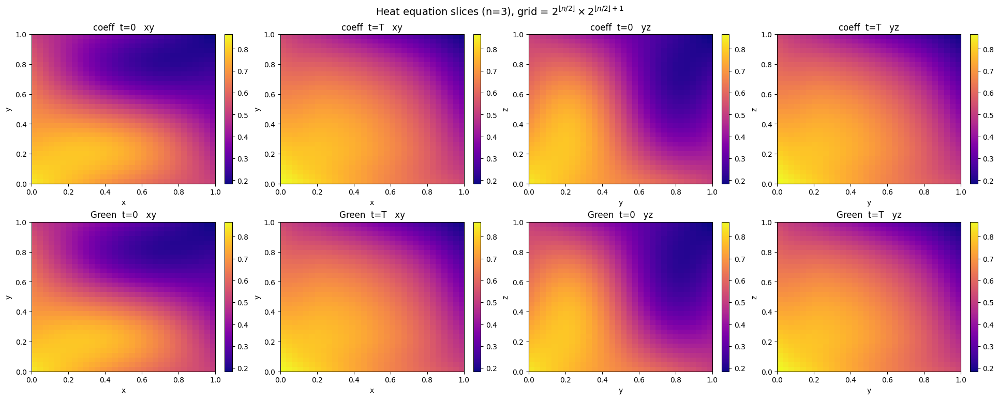

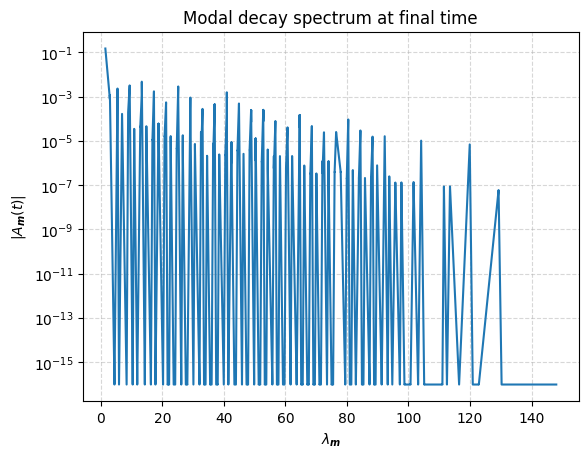

In [10]:
import matplotlib.pyplot as plt
import numpy as np

def heatmap_layout_from_dimension(n):
    """
    rows = 2^{floor(n/2)}
    cols = 2^{floor(n/2)+1}
    """
    p = n // 2
    rows = 2 ** p
    cols = 2 ** (p + 1)
    return rows, cols

# ----------------------------
# Integral of w and related terms (3D)
# ----------------------------
def integrate_w_terms_3d(sol, t, boundary_mode="ramp"):
    """
    Numerically integrate over S:
      Iw = ∫ w dV
      Iwt = ∫ w_t dV
      Iadv = ∫ (kappa·∇w) dV
    using uniform Riemann sum on the solver grid.
    """
    c1, c2, c3 = sol["c"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
    dV = dx * dy * dz

    p = sol["boundary_params"]

    if boundary_mode == "ramp":
        w, w_t, gradw = w_and_derivs_3d_ramp(
            t, X, Y, Z, c1, c2, c3,
            T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"]
        )
        adv_shift = float(np.dot(kappa_vec, gradw))          # constant scalar
        kdotgrad = adv_shift * np.ones_like(w)

    else:  # const_linear
        w, w_t, gradw_vec = w_and_derivs_3d_const_linear(
            t, X, Y, Z, c1, c2, c3,
            a=p["a_const"], e=p["e_const"], f=p["f_const"]
        )
        # kappa·gradw varies in space
        kdotgrad = (kappa_vec[0]*gradw_vec[...,0] +
                    kappa_vec[1]*gradw_vec[...,1] +
                    kappa_vec[2]*gradw_vec[...,2])

    Iw  = float(np.sum(w) * dV)
    Iwt = float(np.sum(w_t) * dV) if np.ndim(w_t) != 0 else float(w_t) * (c1*c2*c3)
    Iadv= float(np.sum(kdotgrad) * dV)
    return Iw, Iwt, Iadv


# ----------------------------
# Green operator evaluator (Dirichlet box, sine basis, truncated)
#   (G(t)phi)(x) = ∫_S G(x,y,t) phi(y) dy
# implemented via modal projection + exp(-lambda t) + reconstruction.
# This is the Green integral on the box, but computed efficiently.
# ----------------------------
def greens_apply_dirichlet_3d(phi_xyz, Sx, Sy, Sz, lam, t, dx, dy, dz, c1, c2, c3):
    # coeffs = <phi, phi_m> normalized exactly like your projection
    coeff = project_to_sines_3d(phi_xyz, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)
    # apply heat kernel decay in modal space
    coeff_t = coeff * np.exp(-lam * t)
    # reconstruct back to grid => integral result
    return reconstruct_from_sines_3d(coeff_t, Sx, Sy, Sz)


def greens_double_integral_source_3d(
    sol, t_eval, Nt_quad=101,  # time quadrature points for ∫_0^t G(t-s)F(s) ds
    x0=(0.5,0.5,0.5), omega=2*np.pi, sigma=None
):
    """
    Computes v_forced(x,t) ≈ ∫_0^t [ G(t-s) F(s,·) ](x) ds
    using trapezoid rule in time and Green operator per time slab.
    """
    c1, c2, c3 = sol["c"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    Sx, Sy, Sz = sol["Sx"], sol["Sy"], sol["Sz"]
    lam = sol["lambda"]
    dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
    mode = sol["boundary_mode"]
    p = sol["boundary_params"]

    ts = np.linspace(0.0, t_eval, Nt_quad)
    v_forced = np.zeros_like(X, dtype=float)

    for i in range(len(ts)):
        s = float(ts[i])
        wts = 0.5 if (i == 0 or i == len(ts)-1) else 1.0  # trapezoid weights
        fsrc = source_f_3d(s, X, Y, Z, x0=x0, omega=omega, sigma=sigma)

        if mode == "ramp":
            w, w_t, gradw = w_and_derivs_3d_ramp(
                s, X, Y, Z, c1, c2, c3,
                T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"]
            )
            adv_shift = float(np.dot(kappa_vec, gradw))
            Fxyz = fsrc - w_t + adv_shift
        else:
            w, w_t, gradw_vec = w_and_derivs_3d_const_linear(
                s, X, Y, Z, c1, c2, c3,
                a=p["a_const"], e=p["e_const"], f=p["f_const"]
            )
            adv_shift = (kappa_vec[0]*gradw_vec[...,0] +
                         kappa_vec[1]*gradw_vec[...,1] +
                         kappa_vec[2]*gradw_vec[...,2])
            Fxyz = fsrc - w_t + adv_shift

        # apply Green with lag (t-s)
        lag = float(t_eval - s)
        GFs = greens_apply_dirichlet_3d(Fxyz, Sx, Sy, Sz, lam, lag, dx, dy, dz, c1, c2, c3)
        v_forced += wts * GFs

    v_forced *= (t_eval / (Nt_quad - 1))  # dt
    return v_forced


# ----------------------------
# Heatmaps: xy @ mid-z and yz @ mid-x (t=0 and t=t_final)
# ----------------------------
def plot_heatmaps_nd(
    u_coeff_0,
    u_coeff_T,
    u_green_T,
    sol,
    n=3,
):
    rows, cols = heatmap_layout_from_dimension(n)

    assert rows * cols == 8, "For n=3 this function expects exactly 8 panels."

    x, y, z = sol["x"], sol["y"], sol["z"]
    c1, c2, c3 = sol["c"]
    Nx, Ny, Nz = u_coeff_0.shape

    iz = Nz // 2
    ix = Nx // 2

    # --- slices ---
    panels = [
        # row 1: coefficient solution
        (u_coeff_0[:, :, iz].T, (0, c1, 0, c2), "coeff  t=0   xy", "x", "y"),
        (u_coeff_T[:, :, iz].T, (0, c1, 0, c2), "coeff  t=T   xy", "x", "y"),
        (u_coeff_0[ix, :, :].T, (0, c2, 0, c3), "coeff  t=0   yz", "y", "z"),
        (u_coeff_T[ix, :, :].T, (0, c2, 0, c3), "coeff  t=T   yz", "y", "z"),

        # row 2: Green-integral validator
        (u_coeff_0[:, :, iz].T, (0, c1, 0, c2), "Green  t=0   xy", "x", "y"),
        (u_green_T[:, :, iz].T, (0, c1, 0, c2), "Green  t=T   xy", "x", "y"),
        (u_coeff_0[ix, :, :].T, (0, c2, 0, c3), "Green  t=0   yz", "y", "z"),
        (u_green_T[ix, :, :].T, (0, c2, 0, c3), "Green  t=T   yz", "y", "z"),
    ]

    # global color normalization (stable comparison)
    vmin = min(p[0].min() for p in panels)
    vmax = max(p[0].max() for p in panels)

    fig, axes = plt.subplots(
        rows, cols, figsize=(4.8 * cols, 3.8 * rows),
        constrained_layout=True
    )

    for ax, (data, extent, title, xl, yl) in zip(axes.flat, panels):
        im = ax.imshow(
            data,
            origin="lower",
            extent=extent,
            aspect="auto",
            cmap="plasma",
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_title(title)
        ax.set_xlabel(xl)
        ax.set_ylabel(yl)
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.02)

    fig.suptitle(
        rf"Heat equation slices (n={n}), grid = $2^{{\lfloor n/2 \rfloor}} \times 2^{{\lfloor n/2 \rfloor+1}}$",
        fontsize=14
    )


# ----------------------------
# Spectrum: |A_m(T)| decay vs lambda_m (log scale on y)
# ----------------------------
def plot_spectrum_decay(sol, t_index=-1, eps=1e-16):
    A = sol["A"][t_index]
    lam = sol["lambda"]
    a = np.abs(A).ravel()
    l = lam.ravel()

    order = np.argsort(l)
    l = l[order]
    a = a[order]

    plt.figure()
    plt.semilogy(l, a + eps)
    plt.ylabel(r"$|A_{\boldsymbol{m}}(t)|$")
    plt.xlabel(r"$\lambda_{\boldsymbol{m}}$")
    plt.grid(True, which="both", ls="--", alpha=0.5)
    plt.title("Modal decay spectrum at final time")
    
if __name__ == "__main__":
    c1 = c2 = c3 = 1.0
    Nx = Ny = Nz = 32
    tgrid = np.linspace(0.0, 2.0, 201)

    # choose boundary model
    boundary_mode = "ramp"      # or "const_linear"

    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

    # boundary params
    if boundary_mode == "ramp":
        w0, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3, T_room=1.0, gamma=0.02, T_cold=0.0)
    else:
        w0, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3, a=1.0, e=0.7, f=0.2)

    # consistent u0 = w0 + v0 (v0 vanishes on boundary)
    v0 = 0.15 * np.sin(np.pi * X / c1) * np.sin(2*np.pi * Y / c2) * np.sin(np.pi * Z / c3)
    u0 = w0 + v0

    # source params (Gaussian-like)
    x0 = (0.5, 0.5, 0.5)
    omega = 2*np.pi
    sigma = None   # or e.g. 0.12

    sol = solve_coeffs_3d(
        u0_xyz=u0,
        c1=c1, c2=c2, c3=c3,
        Nx=Nx, Ny=Ny, Nz=Nz,
        Mx=10, My=10, Mz=10,
        tgrid=tgrid,
        boundary_mode=boundary_mode,
        T_room=1.0, gamma=0.02, T_cold=0.0,          # used if ramp
        a_const=1.0, e_const=0.7, f_const=0.2,        # used if const_linear
        x0=x0, omega=omega, sigma=sigma
    )

    # ---------------------------------------------------------
    # 1) Integrate w terms first (vector/transport contribution)
    # ---------------------------------------------------------
    t_final = float(sol["t"][-1])
    Iw0, Iwt0, Iadv0 = integrate_w_terms_3d(sol, 0.0, boundary_mode=boundary_mode)
    IwT, IwtT, IadvT = integrate_w_terms_3d(sol, t_final, boundary_mode=boundary_mode)

    print("\n--- Integral diagnostics for w ---")
    print(f"t=0:   ∫w dV={Iw0:.6e},  ∫w_t dV={Iwt0:.6e},  ∫(k·∇w)dV={Iadv0:.6e}")
    print(f"t=T:   ∫w dV={IwT:.6e},  ∫w_t dV={IwtT:.6e},  ∫(k·∇w)dV={IadvT:.6e}")

    # ---------------------------------------------------------
    # 2) Coefficient-based reconstruction (fast)
    # ---------------------------------------------------------
    u_coeff_0 = reconstruct_u_3d(sol, t_index=0)
    u_coeff_T = reconstruct_u_3d(sol, t_index=-1)

    # ---------------------------------------------------------
    # 3) Direct Green integral evaluator (slow-ish but validator)
    #    u = w + G(t)phi0 + ∫_0^t G(t-s)F(s) ds
    # ---------------------------------------------------------
    c1, c2, c3 = sol["c"]
    Sx, Sy, Sz = sol["Sx"], sol["Sy"], sol["Sz"]
    lam = sol["lambda"]
    dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
    p = sol["boundary_params"]

    # w(t)
    if boundary_mode == "ramp":
        wT, _, _ = w_and_derivs_3d_ramp(t_final, X, Y, Z, c1, c2, c3,
                                       T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"])
        w0_now, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3,
                                            T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"])
    else:
        wT, _, _ = w_and_derivs_3d_const_linear(t_final, X, Y, Z, c1, c2, c3,
                                               a=p["a_const"], e=p["e_const"], f=p["f_const"])
        w0_now, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3,
                                                    a=p["a_const"], e=p["e_const"], f=p["f_const"])

    phi0 = u0 - w0_now

    # G(t)phi0 term
    v_hom_T = greens_apply_dirichlet_3d(phi0, Sx, Sy, Sz, lam, t_final, dx, dy, dz, c1, c2, c3)

    # double integral forced term
    v_forced_T = greens_double_integral_source_3d(sol, t_final, Nt_quad=81, x0=x0, omega=omega, sigma=sigma)

    u_green_T = wT + v_hom_T + v_forced_T

    # spot-check vs coefficient solution at final time
    rel = np.linalg.norm(u_green_T - u_coeff_T) / (np.linalg.norm(u_coeff_T) + 1e-12)
    print(f"\nGreen-integral validator: relative L2 error at T = {rel:.3e}")

    # ---------------------------------------------------------
    # 4) Heatmaps (t=0 and t=T) on xy and yz slices
    # ---------------------------------------------------------
    # plot_heatmaps_slices(u_coeff_0, u_coeff_T, sol, title_prefix="u (coeff)")

    # (Optional) also visualize the Green-evaluated final slice
    # plot_heatmaps_slices(u_coeff_0, u_green_T, sol, title_prefix="u (Green check)")
    plot_heatmaps_nd(
        u_coeff_0,
        u_coeff_T,
        u_green_T,
        sol,
        n=3
    )

    # ---------------------------------------------------------
    # 5) Spectrum decay of A_m(T)
    # ---------------------------------------------------------
    plot_spectrum_decay(sol, t_index=-1)

    plt.show()

In [29]:

m_order = 2   # 1=heat, 2=biharmonic heat, 3=triharmonic, ...
def laplacian_eigs_base_3d(c1, c2, c3, Mx, My, Mz):
    mx = np.arange(1, Mx + 1, dtype=float)
    my = np.arange(1, My + 1, dtype=float)
    mz = np.arange(1, Mz + 1, dtype=float)
    kx2 = (mx * np.pi / c1) ** 2
    ky2 = (my * np.pi / c2) ** 2
    kz2 = (mz * np.pi / c3) ** 2
    return kx2[:, None, None] + ky2[None, :, None] + kz2[None, None, :]  # μ_{p}

import numpy as np

def advect_coeffs_centered_from_A(Aabc, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3, kappa_vec):
    """
    Given modal A (Mx,My,Mz) for v, compute advection term coefficients:
        C_adv = Proj[ -kappa · ∇v ]
    using:
      v = sum A sin sin sin
      ∇v via centered finite differences on the grid
      project RHS back to sine coefficients
    """
    # v on grid
    v = reconstruct_from_sines_3d(Aabc, Sx, Sy, Sz)  # (Nx,Ny,Nz)

    # centered-ish derivatives (np.gradient uses central in interior, one-sided at edges)
    vx, vy, vz = np.gradient(v, dx, dy, dz, edge_order=2)

    # advection operator: -kappa · grad v
    adv_xyz = -(kappa_vec[0] * vx + kappa_vec[1] * vy + kappa_vec[2] * vz)

    # project back to modal space
    C_adv = project_to_sines_3d(adv_xyz, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)
    return C_adv

def solve_coeffs_3d(
    u0_xyz,
    c1=1.0, c2=1.0, c3=1.0,
    Nx=32, Ny=32, Nz=32,
    Mx=10, My=10, Mz=10,
    tgrid=None,

    # polyharmonic order: (-Δ)^m
    m_order=1,

    # boundary lift model
    boundary_mode="ramp",  # "ramp" or "const_linear"
    T_room=1.0, gamma=0.0, T_cold=0.0,
    a_const=1.0, e_const=0.0, f_const=0.0,

    # source
    x0=(0.5, 0.5, 0.5), omega=2*np.pi, sigma=None,

    # NEW: include -kappa·∇v via centered FD + Galerkin projection
    use_centered_advection=False,
):
    if m_order < 1 or int(m_order) != m_order:
        raise ValueError("m_order must be a positive integer (1,2,3,...)")
    m_order = int(m_order)

    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

    # basis
    Sx = sine_basis_1d(x, c1, Mx)   # (Mx,Nx)
    Sy = sine_basis_1d(y, c2, My)   # (My,Ny)
    Sz = sine_basis_1d(z, c3, Mz)   # (Mz,Nz)

    # polyharmonic eigenvalues
    mx = np.arange(1, Mx + 1, dtype=float)
    my = np.arange(1, My + 1, dtype=float)
    mz = np.arange(1, Mz + 1, dtype=float)

    kx2 = (mx * np.pi / c1) ** 2
    ky2 = (my * np.pi / c2) ** 2
    kz2 = (mz * np.pi / c3) ** 2

    mu = kx2[:, None, None] + ky2[None, :, None] + kz2[None, None, :]
    lam = alpha * (mu ** m_order)

    # time grid
    if tgrid is None:
        tgrid = np.linspace(0.0, 1.0, 101)
    tgrid = np.asarray(tgrid, dtype=float)
    if np.any(np.diff(tgrid) <= 0):
        raise ValueError("tgrid must be strictly increasing")
    Nt = len(tgrid)

    A = np.zeros((Nt, Mx, My, Mz), dtype=float)  # coefficients of v
    B = np.zeros((Nt, Mx, My, Mz), dtype=float)  # forcing coeffs from Fxyz

    # w(0)
    if boundary_mode == "ramp":
        w0, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3, T_room=T_room, gamma=gamma, T_cold=T_cold)
    elif boundary_mode == "const_linear":
        w0, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3, a=a_const, e=e_const, f=f_const)
    elif boundary_mode == "gaussian":
        w0, w0_t, G0 = w_and_derivs_3d_gaussian_bc(0.0, X, Y, Z, c1, c2, c3, **gauss_params)
        # gradw = a(t) * grad(G) because G is purely spatial
        Gx, Gy, Gz = np.gradient(G0, dx, dy, dz, edge_order=2)
        # at t=0:
        a0 = gauss_params["amp0"] * np.sin(gauss_params["omega"] * 0.0)
        gradw0_vec = np.stack([a0*Gx, a0*Gy, a0*Gz], axis=-1)
    else:
        raise ValueError("boundary_mode must be 'ramp' or 'const_linear'")

    # initial modal for v = u - w
    phi0 = u0_xyz - w0
    A[0] = project_to_sines_3d(phi0, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

    # Build B(t): projection of F = f - w_t + (k·∇w)
    for n, t in enumerate(tgrid):
        fsrc = source_f_3d(t, X, Y, Z, x0=x0, omega=omega, sigma=sigma)

        if boundary_mode == "ramp":
            w, w_t, gradw = w_and_derivs_3d_ramp(t, X, Y, Z, c1, c2, c3, T_room=T_room, gamma=gamma, T_cold=T_cold)
            adv_shift_w = float(np.dot(kappa_vec, gradw))   # scalar
            Fxyz = fsrc - w_t + adv_shift_w

        else:
            w, w_t, gradw_vec = w_and_derivs_3d_const_linear(t, X, Y, Z, c1, c2, c3, a=a_const, e=e_const, f=f_const)
            adv_shift_w = (kappa_vec[0]*gradw_vec[...,0] +
                           kappa_vec[1]*gradw_vec[...,1] +
                           kappa_vec[2]*gradw_vec[...,2])
            Fxyz = fsrc - w_t + adv_shift_w

        B[n] = project_to_sines_3d(Fxyz, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

    # Time stepping for A(t) in modal space:
    # v_t = -lam v + (B + Adv(v))   in modal form (lam diagonal)
    # Use integrating factor with predictor-corrector on RHS.
    #
    # Define R_n = B_n + Cadv(A_n) (if enabled)
    # Predictor: A* = r A_n + h r R_n
    # Corrector: A_{n+1} = r A_n + (h/2) [ r R_n + R(A*) ]
    Cadv_hist = np.zeros_like(B) if use_centered_advection else None

    for n in range(Nt - 1):
        h = float(tgrid[n+1] - tgrid[n])
        r = np.exp(-lam * h)

        if use_centered_advection:
            Cadv_n = advect_coeffs_centered_from_A(A[n], Sx, Sy, Sz, dx, dy, dz, c1, c2, c3, kappa_vec)
            Cadv_hist[n] = Cadv_n
            Rn = B[n] + Cadv_n
        else:
            Rn = B[n]

        # predictor
        A_star = r * A[n] + (h * r) * Rn

        if use_centered_advection:
            Cadv_star = advect_coeffs_centered_from_A(A_star, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3, kappa_vec)
            Rstar = B[n+1] + Cadv_star
        else:
            Rstar = B[n+1]

        # corrector
        A[n+1] = r * A[n] + 0.5 * h * (r * Rn + Rstar)

    # store last advection coeffs too (optional)
    if use_centered_advection:
        Cadv_hist[-1] = advect_coeffs_centered_from_A(A[-1], Sx, Sy, Sz, dx, dy, dz, c1, c2, c3, kappa_vec)

    out = {
        "t": tgrid, "A": A, "B": B,
        "lambda": lam, "mu": mu, "m_order": m_order,
        "x": x, "y": y, "z": z, "X": X, "Y": Y, "Z": Z,
        "Sx": Sx, "Sy": Sy, "Sz": Sz,
        "dx": dx, "dy": dy, "dz": dz,
        "c": (c1, c2, c3),
        "boundary_mode": boundary_mode,
        "boundary_params": dict(
            T_room=T_room, gamma=gamma, T_cold=T_cold,
            a_const=a_const, e_const=e_const, f_const=f_const
        ),
        "use_centered_advection": use_centered_advection,
    }
    if use_centered_advection:
        out["Cadv"] = Cadv_hist
    return out

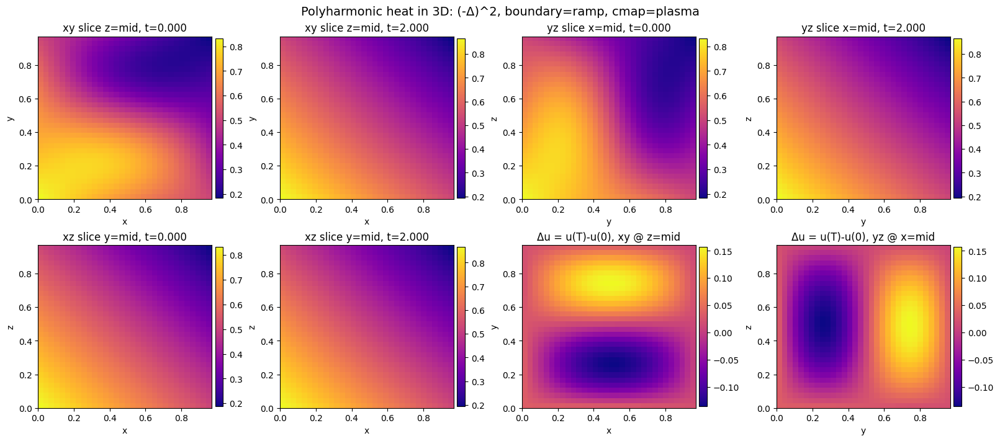

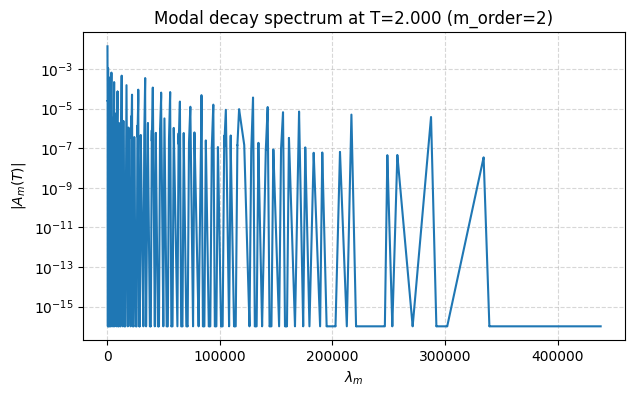

In [23]:
import numpy as np
import matplotlib.pyplot as plt

def main():
    # ----------------------------
    # 1) Problem / discretization
    # ----------------------------
    c1 = c2 = c3 = 1.0
    Nx = Ny = Nz = 32
    Mx = My = Mz = 10
    tgrid = np.linspace(0.0, 2.0, 201)

    # polyharmonic order: (-Δ)^m
    m_order = 2  # 1=heat, 2=biharmonic heat, 3=triharmonic, ...

    # boundary model
    boundary_mode = "ramp"     # "ramp" or "const_linear"
    T_room, gamma, T_cold = 1.0, 0.02, 0.0
    a_const, e_const, f_const = 1.0, 0.7, 0.2

    # forcing
    x0 = (0.5, 0.5, 0.5)
    omega = 2 * np.pi
    sigma = None

    # ----------------------------
    # 2) Build grid + consistent u0
    # ----------------------------
    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

    if boundary_mode == "ramp":
        w0, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3,
                                        T_room=T_room, gamma=gamma, T_cold=T_cold)
    else:
        w0, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3,
                                                a=a_const, e=e_const, f=f_const)

    # v0 vanishes on Dirichlet boundary (sine*sine*sine)
    v0 = 0.15 * np.sin(np.pi * X / c1) * np.sin(2*np.pi * Y / c2) * np.sin(np.pi * Z / c3)
    u0 = w0 + v0

    # ----------------------------
    # 3) Solve modal coefficients
    # ----------------------------
    sol = solve_coeffs_3d(
        u0_xyz=u0,
        c1=c1, c2=c2, c3=c3,
        Nx=Nx, Ny=Ny, Nz=Nz,
        Mx=Mx, My=My, Mz=Mz,
        tgrid=tgrid,
        m_order=m_order,
        boundary_mode=boundary_mode,
        T_room=T_room, gamma=gamma, T_cold=T_cold,
        a_const=a_const, e_const=e_const, f_const=f_const,
        x0=x0, omega=omega, sigma=sigma,
    )

    # ----------------------------
    # 4) Reconstruct u(t) at t=0 and t=T
    #    (avoids needing a separate reconstruct_u_3d)
    # ----------------------------
    def reconstruct_u_at_index(sol, idx):
        t = float(sol["t"][idx])
        c1_, c2_, c3_ = sol["c"]
        X_, Y_, Z_ = sol["X"], sol["Y"], sol["Z"]
        Sx_, Sy_, Sz_ = sol["Sx"], sol["Sy"], sol["Sz"]
        A_ = sol["A"][idx]
        p = sol["boundary_params"]

        if sol["boundary_mode"] == "ramp":
            w_, _, _ = w_and_derivs_3d_ramp(t, X_, Y_, Z_, c1_, c2_, c3_,
                                           T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"])
        else:
            w_, _, _ = w_and_derivs_3d_const_linear(t, X_, Y_, Z_, c1_, c2_, c3_,
                                                   a=p["a_const"], e=p["e_const"], f=p["f_const"])
        v_ = reconstruct_from_sines_3d(A_, Sx_, Sy_, Sz_)  # (Nx,Ny,Nz)
        return w_ + v_

    u_t0 = reconstruct_u_at_index(sol, 0)
    u_tT = reconstruct_u_at_index(sol, -1)

    # ----------------------------
    # 5) 8 heat plots in 2 rows x 4 cols (plasma)
    #    panels: xy(t0,tT), yz(t0,tT), xz(t0,tT), deltas (xy,yz)
    # ----------------------------
    iz = Nz // 2
    ix = Nx // 2
    iy = Ny // 2

    xy0 = u_t0[:, :, iz].T
    xyT = u_tT[:, :, iz].T
    yz0 = u_t0[ix, :, :].T
    yzT = u_tT[ix, :, :].T
    xz0 = u_t0[:, iy, :].T
    xzT = u_tT[:, iy, :].T
    dxy = (u_tT - u_t0)[:, :, iz].T
    dyz = (u_tT - u_t0)[ix, :, :].T

    fig, axes = plt.subplots(2, 4, figsize=(16, 7), constrained_layout=True)
    cmap = "plasma"

    def im(ax, A, extent, title, xlabel, ylabel):
        h = ax.imshow(A, origin="lower", aspect="auto", extent=extent, cmap=cmap)
        ax.set_title(title)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        fig.colorbar(h, ax=ax, fraction=0.046, pad=0.02)
        return h

    t0 = float(sol["t"][0])
    tT = float(sol["t"][-1])

    im(axes[0, 0], xy0, [x[0], x[-1], y[0], y[-1]], f"xy slice z=mid, t={t0:.3f}", "x", "y")
    im(axes[0, 1], xyT, [x[0], x[-1], y[0], y[-1]], f"xy slice z=mid, t={tT:.3f}", "x", "y")
    im(axes[0, 2], yz0, [y[0], y[-1], z[0], z[-1]], f"yz slice x=mid, t={t0:.3f}", "y", "z")
    im(axes[0, 3], yzT, [y[0], y[-1], z[0], z[-1]], f"yz slice x=mid, t={tT:.3f}", "y", "z")

    im(axes[1, 0], xz0, [x[0], x[-1], z[0], z[-1]], f"xz slice y=mid, t={t0:.3f}", "x", "z")
    im(axes[1, 1], xzT, [x[0], x[-1], z[0], z[-1]], f"xz slice y=mid, t={tT:.3f}", "x", "z")
    im(axes[1, 2], dxy, [x[0], x[-1], y[0], y[-1]], f"Δu = u(T)-u(0), xy @ z=mid", "x", "y")
    im(axes[1, 3], dyz, [y[0], y[-1], z[0], z[-1]], f"Δu = u(T)-u(0), yz @ x=mid", "y", "z")

    fig.suptitle(f"Polyharmonic heat in 3D: (-Δ)^{m_order}, boundary={boundary_mode}, cmap={cmap}", fontsize=14)

    # ----------------------------
    # 6) Decaying spectrum plot (last)
    # ----------------------------
    A_final = sol["A"][-1]
    lam = sol["lambda"]
    a = np.abs(A_final).ravel()
    l = lam.ravel()
    order = np.argsort(l)
    l = l[order]
    a = a[order]

    plt.figure(figsize=(7, 4))
    plt.semilogy(l, a + 1e-16)
    plt.xlabel(r"$\lambda_m$")
    plt.ylabel(r"$|A_m(T)|$")
    plt.title(f"Modal decay spectrum at T={tT:.3f} (m_order={m_order})")
    plt.grid(True, which="both", ls="--", alpha=0.5)

    plt.show()
    return sol


if __name__ == "__main__":
    sol = main()

In [30]:
def test_centered_advection_matches_when_kappa_zero():
    global kappa_vec
    kappa_old = kappa_vec.copy()
    kappa_vec = np.array([0.0, 0.0, 0.0])

    c1=c2=c3=1.0
    Nx=Ny=Nz=24
    Mx=My=Mz=8
    tgrid=np.linspace(0.0, 0.6, 121)

    x,y,z,X,Y,Z,dx,dy,dz = make_grid_3d(c1,c2,c3,Nx,Ny,Nz)
    w0,_,_ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3, T_room=1.0, gamma=0.01, T_cold=0.0)
    v0 = 0.1*np.sin(np.pi*X)*np.sin(np.pi*Y)*np.sin(np.pi*Z)
    u0 = w0 + v0

    sol0 = solve_coeffs_3d(u0, c1,c2,c3, Nx,Ny,Nz, Mx,My,Mz, tgrid=tgrid,
                           m_order=1, boundary_mode="ramp", T_room=1.0, gamma=0.01, T_cold=0.0,
                           use_centered_advection=False)

    sol1 = solve_coeffs_3d(u0, c1,c2,c3, Nx,Ny,Nz, Mx,My,Mz, tgrid=tgrid,
                           m_order=1, boundary_mode="ramp", T_room=1.0, gamma=0.01, T_cold=0.0,
                           use_centered_advection=True)

    A0 = sol0["A"][-1]
    A1 = sol1["A"][-1]
    rel = np.linalg.norm(A1 - A0) / (np.linalg.norm(A0) + 1e-14)
    print("Test A (kappa=0) rel error in A(T):", rel)

    kappa_vec = kappa_old
    assert rel < 5e-3
    
def test_centered_advection_dt_refinement():
    c1=c2=c3=1.0
    Nx=Ny=Nz=24
    Mx=My=Mz=8
    T=0.6

    x,y,z,X,Y,Z,dx,dy,dz = make_grid_3d(c1,c2,c3,Nx,Ny,Nz)
    w0,_,_ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3, T_room=1.0, gamma=0.00, T_cold=0.0)
    v0 = 0.15*np.sin(np.pi*X)*np.sin(2*np.pi*Y)*np.sin(np.pi*Z)
    u0 = w0 + v0

    t_coarse = np.linspace(0.0, T, 121)
    t_fine   = np.linspace(0.0, T, 241)

    solC = solve_coeffs_3d(u0, c1,c2,c3, Nx,Ny,Nz, Mx,My,Mz, tgrid=t_coarse,
                           m_order=1, boundary_mode="ramp", T_room=1.0, gamma=0.00, T_cold=0.0,
                           use_centered_advection=True)

    solF = solve_coeffs_3d(u0, c1,c2,c3, Nx,Ny,Nz, Mx,My,Mz, tgrid=t_fine,
                           m_order=1, boundary_mode="ramp", T_room=1.0, gamma=0.00, T_cold=0.0,
                           use_centered_advection=True)

    # compare A(T) (same modal resolution)
    A_C = solC["A"][-1]
    A_F = solF["A"][-1]
    rel = np.linalg.norm(A_F - A_C) / (np.linalg.norm(A_F) + 1e-14)
    print("Test B (dt refine) rel error in A(T):", rel)

    assert rel < 0.15
    
def greens_double_integral_source_3d(sol, t_eval, Nt_quad=81, x0=(0.5,0.5,0.5), omega=2*np.pi, sigma=None):
    """
    Compute the double integral term via quadrature:
        v_forced(x,y,z,t) = ∫_0^t G(t-s) F(x,y,z,s) ds
    where
        F = f - w_t + (kappa · ∇w)
    using Nt_quad quadrature points.
    """
    c1, c2, c3 = sol["c"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    Sx, Sy, Sz = sol["Sx"], sol["Sy"], sol["Sz"]
    lam = sol["lambda"]
    
    dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
    p = sol["boundary_params"]
    mode = sol["boundary_mode"]
    v_forced = np.zeros_like(X, dtype=float)
    # quadrature points and weights on [0, t_eval]
    s_pts, wts = np.polynomial.legendre.leggauss(Nt_quad)
    s_pts = 0.5 * (s_pts + 1) * t_eval  # map from [-1,1] to [0,t_eval]
    wts = 0.5 * wts * t_eval            # scale weights accordingly
    for s, wts in zip(s_pts, wts):
        # build Fxyz at time s
        fsrc = source_f_3d(s, X, Y, Z, x0=x0, omega=omega, sigma=sigma)

        if mode == "ramp":
            w, w_t, gradw = w_and_derivs_3d_ramp(
                s, X, Y, Z, c1, c2, c3,
                T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"]
            )
            adv_shift = float(np.dot(kappa_vec, gradw))
            Fxyz = fsrc - w_t + adv_shift
        else:
            w, w_t, gradw_vec = w_and_derivs_3d_const_linear(
                s, X, Y, Z, c1, c2, c3,
                a=p["a_const"], e=p["e_const"], f=p["f_const"]
            )
            adv_shift = (kappa_vec[0]*gradw_vec[...,0] +
                         kappa_vec[1]*gradw_vec[...,1] +
                         kappa_vec[2]*gradw_vec[...,2])
            Fxyz = fsrc - w_t + adv_shift

        # apply Green with lag (t-s)
        lag = float(t_eval - s)
        GFs = greens_apply_dirichlet_3d(Fxyz, Sx, Sy, Sz, lam, lag, dx, dy, dz, c1, c2, c3)
        v_forced += wts * GFs
        
    return v_forced
# ----------------------------
# Heatmaps: 2 rows x 4 cols
#  row 1: coeff solution at t=0 and t=T (xy, yz)
#  row 2: Green-integral validator at t=0 and t=T (xy, yz)
# ----------------------------
def plot_heatmaps_nd(u_coeff_0, u_coeff_T, u_green_T, sol, n=3):
    c1, c2, c3 = sol["c"]
    x, y, z = sol["x"], sol["y"], sol["z"]
    Nx, Ny, Nz = len(x), len(y), len(z)

    rows, cols = 2, 4
    iz = Nz // 2
    ix = Nx // 2

    panels = [
        # row 1: Coefficient solution
        (u_coeff_0[:, :, iz].T, (0, c1, 0, c2), "coeff  t=0   xy", "x", "y"),
        (u_coeff_T[:, :, iz].T, (0, c1, 0, c2), "coeff  t=T   xy", "x", "y"),
        (u_coeff_0[ix, :, :].T, (0, c2, 0, c3), "coeff  t=0   yz", "y", "z"), 
        (u_coeff_T[ix, :, :].T, (0, c2, 0, c3), "coeff  t=T   yz", "y", "z"),
        # row 2: Green-integral validator
        (u_coeff_0[:, :, iz].T, (0, c1, 0, c2), "Green  t=0   xy", "x", "y"),
        (u_green_T[:, :, iz].T, (0, c1, 0, c2), "Green  t=T   xy", "x", "y"),
        (u_coeff_0[ix, :, :].T, (0, c2, 0, c3), "Green  t=0   yz", "y", "z"), 
        (u_green_T[ix, :, :].T, (0, c2, 0, c3), "Green  t=T   yz", "y", "z"),
    ]
    
    fig, axes = plt.subplots(rows, cols, figsize=(16, 7), constrained_layout=True)
    vmin = min(np.min(u_coeff_0), np.min(u_coeff_T), np.min(u_green_T))
    vmax = max(np.max(u_coeff_0), np.max(u_coeff_T), np.max(u_green_T))
    cmap = "viridis"
    def im(ax, A, extent, title, xlabel, ylabel):
        h = ax.imshow(A, origin="lower", aspect="auto", extent=extent, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_title(title)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        fig.colorbar(h, ax=ax, fraction=0.046, pad=0.02)
        return h
    for i, (A, extent, title, xlabel, ylabel) in enumerate(panels):
        r = i // cols
        c = i % cols
        im(axes[r, c], A, extent, title, xlabel, ylabel)
        
    fig.suptitle(f"Polyharmonic heat in 3D: (-Δ)^{sol['m_order']}, boundary={sol['boundary_mode']}, cmap={cmap}", fontsize=14)
    return fig, axes

def plot_spectrum_decay(sol, t_index=-1):
    A_final = sol["A"][t_index]
    lam = sol["lambda"]
    a = np.abs(A_final).ravel()
    l = lam.ravel()
    order = np.argsort(l)
    l = l[order]
    a = a[order]

    plt.figure(figsize=(7, 4))
    plt.semilogy(l, a + 1e-16)
    plt.xlabel(r"$\lambda_m$")
    plt.ylabel(r"$|A_m(T)|$")
    tT = float(sol["t"][t_index])
    plt.title(f"Modal decay spectrum at T={tT:.3f} (m_order={sol['m_order']})")
    plt.grid(True, which="both", ls="--", alpha=0.5)
    return plt

if __name__ == "__main__":
    # ----------------------------
    # Problem / discretization
    # ----------------------------
    c1 = c2 = c3 = 1.0
    Nx = Ny = Nz = 32
    tgrid = np.linspace(0.0, 2.0, 201)

    # boundary model
    boundary_mode = "ramp"     # "ramp" or "const_linear"

    # consistent initial condition u0 = w0 + v0
    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)
    if boundary_mode == "ramp":
        w0, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3,
                                        T_room=1.0, gamma=0.02, T_cold=0.0)
    else:
        w0, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3,
                                                a=1.0, e=0.7, f=0.2)
    v0 = 0.15 * np.sin(np.pi * X / c1) * np.sin(2*np.pi * Y / c2) * np.sin(np.pi * Z / c3)
    u0 = w0 + v0 
    # ----------------------------
    # Solve modal coefficients
    # ----------------------------
    x0 = (0.5, 0.5, 0.5)
    omega = 2 * np.pi
    sigma = None
    sol = solve_coeffs_3d(
        u0_xyz=u0,
        c1=c1, c2=c2, c3=c3,
        Nx=Nx, Ny=Ny, Nz=Nz,
        Mx=10, My=10, Mz=10,
        tgrid=tgrid,
        m_order=2,
        boundary_mode=boundary_mode,
        T_room=1.0, gamma=0.02, T_cold=0.0,
        a_const=1.0, e_const=0.7, f_const=0.2,
        x0=x0, omega=omega, sigma=sigma,
    )
    t_final = float(sol["t"][-1])
    # ----------------------------
    # 1) Integral diagnostics at t=0 and t=T
    # ----------------------------
    u0_recon = reconstruct_u_3d(sol, t_index=0)
    rel0 = np.linalg.norm(u0_recon - u0) / (np.linalg.norm(u0) + 1e-12)
    print(f"\nReconstruction at t=0: relative L2 error = {rel0:.3e}")    
    # ----------------------------
    # 2) Reconstruct u(t) at t=0 and t=T
    # ----------------------------
    u_coeff_0 = reconstruct_u_3d(sol, t_index=0)
    u_coeff_T = reconstruct_u_3d(sol, t_index=-1)   
    # ----------------------------
    # 3) Green's integral validator at t=T
    # ----------------------------
    # ---------------------------------------------------------
    # Green's integral validator at t=T
    # ---------------------------------------------------------
    x, y, z = sol["x"], sol["y"], sol["z"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    Sx, Sy, Sz = sol["Sx"], sol["Sy"], sol["Sz"]
    lam = sol["lambda"]
    dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
    c1, c2, c3 = sol["c"]
    p = sol["boundary_params"]
    mode = sol["boundary_mode"]
    if mode == "ramp":
        wT, _, _ = w_and_derivs_3d_ramp(t_final, X, Y, Z, c1, c2, c3,
                                       T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"])
        w0_now, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3,
                                       T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"])
    else:
        wT, _, _ = w_and_derivs_3d_const_linear(t_final, X, Y, Z, c1, c2, c3,
                                                a=p["a_const"], e=p["e_const"], f=p["f_const"])
        w0_now, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3,
                                                a=p["a_const"], e=p["e_const"], f=p["f_const"])
    v_hom_T = greens_apply_dirichlet_3d(u0 - w0_now, Sx, Sy, Sz, lam, t_final, dx, dy, dz, c1, c2, c3)
    v_forced_T = greens_double_integral_source_3d(
        sol, t_final, Nt_quad=81, x0=x0, omega=omega, sigma=sigma
    )
    u_green_T = wT + v_hom_T + v_forced_T
    rel = np.linalg.norm(u_green_T - u_coeff_T) / (np.linalg.norm(u_coeff_T) + 1e-12)
    print(f"Green's integral validator at t=T={t_final:.3f}: relative L2 error = {rel:.3e}")
    


Reconstruction at t=0: relative L2 error = 8.113e-17
Green's integral validator at t=T=2.000: relative L2 error = 1.384e-03


In [31]:
if __name__ == "__main__":
    test_centered_advection_matches_when_kappa_zero()
    test_centered_advection_dt_refinement()
    print("All centered-advection tests passed.")

Test A (kappa=0) rel error in A(T): 0.0
Test B (dt refine) rel error in A(T): 0.00032736136830450763
All centered-advection tests passed.


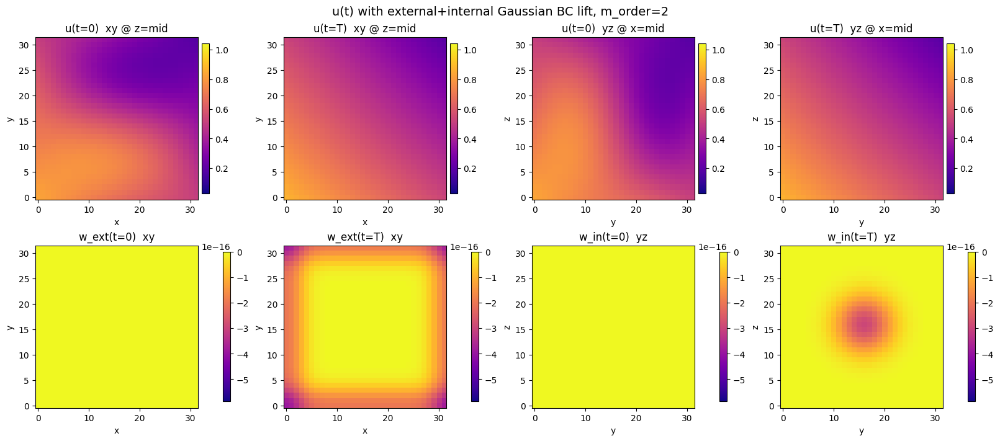

In [32]:
import numpy as np
import matplotlib.pyplot as plt

def gaussian_internal_3d(X, Y, Z, x0=(0.5,0.5,0.5), sigma=0.12):
    dx = X - x0[0]
    dy = Y - x0[1]
    dz = Z - x0[2]
    r2 = dx*dx + dy*dy + dz*dz
    return np.exp(-r2 / (2.0 * sigma*sigma))

def gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=0.08):
    """
    A smooth "boundary-localized" bump using distance-to-boundary in each axis:
      d(x) = min(x, c1-x), etc.
    Build:
      g_ext = exp(-d(x)^2/(2δ^2)) + exp(-d(y)^2/(2δ^2)) + exp(-d(z)^2/(2δ^2))
    This concentrates near all 6 faces.
    """
    dx = np.minimum(X, c1 - X)
    dy = np.minimum(Y, c2 - Y)
    dz = np.minimum(Z, c3 - Z)
    gx = np.exp(-(dx*dx) / (2.0*delta*delta))
    gy = np.exp(-(dy*dy) / (2.0*delta*delta))
    gz = np.exp(-(dz*dz) / (2.0*delta*delta))
    return gx + gy + gz

def w_and_derivs_3d_gaussian_bc(
    t, X, Y, Z, c1, c2, c3,
    # time ramp (so it changes smoothly)
    amp0=1.0, omega=2*np.pi,
    # internal gaussian
    x0=(0.5,0.5,0.5), sigma_in=0.12, A_in=0.6,
    # external boundary gaussian
    delta=0.08, A_ext=0.4,
):
    """
    Boundary lift:
      w(t,x) = a(t) * ( A_ext * g_ext(x) + A_in * g_in(x) )

    Returns:
      w, w_t, gradw  (gradw as a *vector field* via np.gradient)
    """
    a = amp0 * np.sin(omega * t)              # smooth oscillatory amplitude
    a_t = amp0 * omega * np.cos(omega * t)

    g_in  = gaussian_internal_3d(X, Y, Z, x0=x0, sigma=sigma_in)
    g_ext = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=delta)

    G = (A_ext * g_ext + A_in * g_in)

    w = a * G
    w_t = a_t * G

    # gradient in space (centered interior, one-sided at edges)
    # IMPORTANT: you must pass dx,dy,dz at call site or reuse sol["dx"]...
    # We'll compute gradients later where dx,dy,dz are known.
    return w, w_t, G   # return G so caller can gradient it with dx,dy,dz

def plot_u_initial_final_with_gaussian_bc(sol, title="u slices with Gaussian BC", cmap="plasma"):
    """
    Panels (2 rows x 4 cols):
      Row 1: u(t=0) xy, u(t=T) xy, u(t=0) yz, u(t=T) yz
      Row 2: w_ext(t=0) xy, w_ext(t=T) xy, w_in(t=0) yz, w_in(t=T) yz
    (You can swap what row 2 shows; this is a useful default.)
    """
    c1, c2, c3 = sol["c"]
    x, y, z = sol["x"], sol["y"], sol["z"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
    p = sol["boundary_params"]

    Nz = len(z); Nx = len(x)
    iz = Nz // 2
    ix = Nx // 2

    # reconstruct u at t=0 and t=T
    u0 = reconstruct_u_3d(sol, t_index=0)
    uT = reconstruct_u_3d(sol, t_index=-1)

    # rebuild w pieces at t=0 and t=T using the same params stored in sol
    t0 = float(sol["t"][0])
    tT = float(sol["t"][-1])

    w0, _, G0 = w_and_derivs_3d_gaussian_bc(
        t0, X, Y, Z, c1, c2, c3,
        amp0=p["amp0"], omega=p["omega"],
        x0=p["x0"], sigma_in=p["sigma_in"], A_in=p["A_in"],
        delta=p["delta"], A_ext=p["A_ext"]
    )
    wT, _, GT = w_and_derivs_3d_gaussian_bc(
        tT, X, Y, Z, c1, c2, c3,
        amp0=p["amp0"], omega=p["omega"],
        x0=p["x0"], sigma_in=p["sigma_in"], A_in=p["A_in"],
        delta=p["delta"], A_ext=p["A_ext"]
    )

    # isolate external and internal components for display
    gext0 = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=p["delta"])
    gin0  = gaussian_internal_3d(X, Y, Z, x0=p["x0"], sigma=p["sigma_in"])
    a0 = p["amp0"] * np.sin(p["omega"] * t0)
    aT = p["amp0"] * np.sin(p["omega"] * tT)

    wext0 = a0 * (p["A_ext"] * gext0)
    win0  = a0 * (p["A_in"]  * gin0)

    gextT = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=p["delta"])
    ginT  = gaussian_internal_3d(X, Y, Z, x0=p["x0"], sigma=p["sigma_in"])
    wextT = aT * (p["A_ext"] * gextT)
    winT  = aT * (p["A_in"]  * ginT)

    # global scale for u panels; separate scale for w panels can be nicer
    vmin_u = min(u0.min(), uT.min())
    vmax_u = max(u0.max(), uT.max())

    vmin_w = min(w0.min(), wT.min())
    vmax_w = max(w0.max(), wT.max())

    fig, ax = plt.subplots(2, 4, figsize=(16, 7), constrained_layout=True)

    # Row 1: u
    im = ax[0,0].imshow(u0[:, :, iz].T, origin="lower", aspect="auto", cmap=cmap, vmin=vmin_u, vmax=vmax_u)
    ax[0,0].set_title("u(t=0)  xy @ z=mid"); ax[0,0].set_xlabel("x"); ax[0,0].set_ylabel("y")
    fig.colorbar(im, ax=ax[0,0], fraction=0.046, pad=0.02)

    im = ax[0,1].imshow(uT[:, :, iz].T, origin="lower", aspect="auto", cmap=cmap, vmin=vmin_u, vmax=vmax_u)
    ax[0,1].set_title("u(t=T)  xy @ z=mid"); ax[0,1].set_xlabel("x"); ax[0,1].set_ylabel("y")
    fig.colorbar(im, ax=ax[0,1], fraction=0.046, pad=0.02)

    im = ax[0,2].imshow(u0[ix, :, :].T, origin="lower", aspect="auto", cmap=cmap, vmin=vmin_u, vmax=vmax_u)
    ax[0,2].set_title("u(t=0)  yz @ x=mid"); ax[0,2].set_xlabel("y"); ax[0,2].set_ylabel("z")
    fig.colorbar(im, ax=ax[0,2], fraction=0.046, pad=0.02)

    im = ax[0,3].imshow(uT[ix, :, :].T, origin="lower", aspect="auto", cmap=cmap, vmin=vmin_u, vmax=vmax_u)
    ax[0,3].set_title("u(t=T)  yz @ x=mid"); ax[0,3].set_xlabel("y"); ax[0,3].set_ylabel("z")
    fig.colorbar(im, ax=ax[0,3], fraction=0.046, pad=0.02)

    # Row 2: show boundary components (external on xy, internal on yz)
    im = ax[1,0].imshow(wext0[:, :, iz].T, origin="lower", aspect="auto", cmap=cmap, vmin=vmin_w, vmax=vmax_w)
    ax[1,0].set_title("w_ext(t=0)  xy"); ax[1,0].set_xlabel("x"); ax[1,0].set_ylabel("y")
    fig.colorbar(im, ax=ax[1,0], fraction=0.046, pad=0.02)

    im = ax[1,1].imshow(wextT[:, :, iz].T, origin="lower", aspect="auto", cmap=cmap, vmin=vmin_w, vmax=vmax_w)
    ax[1,1].set_title("w_ext(t=T)  xy"); ax[1,1].set_xlabel("x"); ax[1,1].set_ylabel("y")
    fig.colorbar(im, ax=ax[1,1], fraction=0.046, pad=0.02)

    im = ax[1,2].imshow(win0[ix, :, :].T, origin="lower", aspect="auto", cmap=cmap, vmin=vmin_w, vmax=vmax_w)
    ax[1,2].set_title("w_in(t=0)  yz"); ax[1,2].set_xlabel("y"); ax[1,2].set_ylabel("z")
    fig.colorbar(im, ax=ax[1,2], fraction=0.046, pad=0.02)

    im = ax[1,3].imshow(winT[ix, :, :].T, origin="lower", aspect="auto", cmap=cmap, vmin=vmin_w, vmax=vmax_w)
    ax[1,3].set_title("w_in(t=T)  yz"); ax[1,3].set_xlabel("y"); ax[1,3].set_ylabel("z")
    fig.colorbar(im, ax=ax[1,3], fraction=0.046, pad=0.02)

    fig.suptitle(title, fontsize=14)
    return fig, ax

# grid
c1=c2=c3=1.0
Nx=Ny=Nz=32
x,y,z,X,Y,Z,dx,dy,dz = make_grid_3d(c1,c2,c3,Nx,Ny,Nz)

# Gaussian BC params (store into sol["boundary_params"])
gauss_params = dict(
    amp0=1.0,
    omega=2*np.pi,
    x0=(0.5,0.5,0.5),
    sigma_in=0.12,
    A_in=0.6,
    delta=0.08,
    A_ext=0.4,
)

# w(0)
w0, w0_t, G0 = w_and_derivs_3d_gaussian_bc(
    0.0, X, Y, Z, c1, c2, c3,
    **gauss_params
)

# interior (Dirichlet) perturbation v0
v0 = 0.15*np.sin(np.pi*X/c1)*np.sin(2*np.pi*Y/c2)*np.sin(np.pi*Z/c3)

u0 = w0 + v0

sol["boundary_params"].update(gauss_params)  # ensure plotter sees these keys
fig, ax = plot_u_initial_final_with_gaussian_bc(
    sol,
    title=f"u(t) with external+internal Gaussian BC lift, m_order={sol['m_order']}",
    cmap="plasma"
)
plt.show()

#### Second-Order Wave Equations with Source Term
Consider the second-order wave equation with a source term $f(t,x)$ in a bounded domain $\mathscr{S} \subset \mathbb{R}^n$ with homogeneous Dirichlet boundary conditions:
$$
\begin{cases}
u_{tt}(t,x) = c^2 \Delta u(t,x) + f
(t,x), \quad x \in \mathscr{S}, \quad t > 0\\
u(t,x) = 0, \quad x \in \partial \mathscr{
S}, \quad t > 0\\
u(0,x) = \varphi(x), \quad x \in \mathscr
{S}\\
u_t(0,x) = \psi(x), \quad x \in \mathscr
{S}
\end{cases}
$$
To solve this problem, we first consider the associated homogeneous problem by introducing a function $w(t
,x)$ that satisfies the boundary conditions:
$$
\begin{cases}
w(t,x) = 0, \quad x \in \partial \mathscr{
S}, \quad t > 0\\
w(0,x) = a(x), \quad x \in \mathscr
{S}\\
w_t(0,x) = b(x), \quad x \in \mathscr
{S}
\end{cases}
$$
We then define $v(t,x) = u(t,x) - w(t,x)$,
which satisfies the homogeneous boundary conditions:
$$
\begin{cases}
v_{tt}(t,x) = c^2 \Delta v(t,x) + F
(t,x), \quad x \in \mathscr{S}, \quad t > 0\\
v(t,x) = 0, \quad x \in \partial \mathscr{
S}, \quad t > 0\\
v(0,x) = \varphi(x) - a(x), \quad x \in \mathscr
{S}\\
v_t(0,x) = \psi(x) - b(x), \quad x \
{S}
\end{cases}
$$
where the modified source term is given by
$$F(t,x) = f(t,x) - w_{tt}(t,x) +
c^2 \Delta w(t,x)$$
We expand the solution $v(t,x)$ in terms of the eigenfunctions of the Laplac
ian operator with homogeneous Dirichlet boundary conditions:
$$
v(t,x) = \sum_{m=1}^{\infty} A_m(t) \phi_{m}(x), \quad m = m_1, m_2, \dots m_n
$$
where the eigenfunctions are given by
$$\phi_{m}(x) = \sqrt{\frac{2^n}{\
\prod_{i=1}^{n} c_i}}\prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)}$$
and satisfy the orthogonality condition
$$\int_{\mathscr{S}} \phi_{m}(x) \phi_{
k}(x) \mathbb{d}x = \begin{cases}
0, & m \neq k \\
\prod_{i=1}^{n} \frac{c_i}{2}, & m = k
\end{cases}
$$
with the span denoted by $\mathcal{C}$
$$
\mathcal{C} = \left\{ \phi_{k} \right\}^{\infty}_{n=1} \simeq \mathscr{L}^2(\mathscr{S}), \quad \forall \mathscr{G} \in \mathcal{C}, \quad \mathscr{G}(x) = \sum_{k=1}^{\infty}c_k \phi_{k}(x) \text{ conv. in } \mathscr{L}^2
(\mathscr{S})
$$
Substituting the expansion into the wave equation and using the orthogonality of the eigenfunctions
, we obtain a system of second-order ordinary differential equations for the coefficients $A_m(t)$:
$$\frac{d^2 A_m}{dt^2} + \omega_m^
2 A_m = B_m(t), \quad \omega_m = c \sqrt{\sum_{i=1}^{n} \Big(\frac{m_i \pi}{c_i}\Big)^2}, \quad B_m(t) = \frac{2^n}{\prod_{i=1}^{n} c_i} \int_{\mathscr{S}} F(t,x) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)} \mathbb{d}x$$
The initial conditions for the coefficients are given by
$$
A_m(0) = \frac{2^n}{\prod_{i=1}^{n} c_i} \int_{\mathscr{S}} (\varphi(x) - a(x)) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)} \mathbb{d}x
$$
$$
\frac{dA_m}{dt}(0) = \frac{2^n}{\prod_{i=1}^{n} c_i} \int_{\mathscr{S}} (\psi(x) - b(x)) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)} \mathbb{d}x
$$
The solution for each coefficient $A_m(t)$ can be expressed using the method of variation of
parameters:
$$A_m(t) = A_m(0) \cos{(\omega_m t)}
+ \frac{dA_m}{dt}(0) \frac{\sin{(\omega_m t)}}{\omega_m} + \int_{0}^{t} \frac{\sin{(\omega_m (t-s))}}{\omega_m} B_m(s) \mathbb{d}s
$$
Finally, the solution to the original wave equation is given by
$$u(t,x) = w(t,x) + \sum_{m_1, \
dots, m_n=1}^{\infty} A_m(t) \prod_{i=1}^{n} \sin{\Big(\frac{m_i \pi x_i}{c_i}\Big)}$$
#### Numerical Implementation
To implement the above solution numerically, we discretize the time domain into small intervals of size
$\Delta t$. At each time step, we update the coefficients $A_m(t)$ using the previously computed values and the forcing term $B_m(t)$. The following algorithm outlines the steps to compute $u(t,x)$ iteratively:
1. Initialize the coefficients $A_m(0)$ and $\frac{dA_m}{
dt}(0)$ using the initial conditions.
2. For each time step $t_n = n \Delta t$:

    a. Compute the modified source term $F(t_n, x)$.

    b. Calculate the forcing term $B_m(t_n)$ using numerical integration.
    
    c. Update the coefficients $A_m(t_{n+1})$ using the variation of parameters formula.
3. Construct the solution $u(t_{n+1}, x)$ using the updated coefficients and the boundary shift function $w(t_{n+1}, x)$.
$$A_m(t_{n+1}) = A_m(t_n) \cos{(\omega_m \Delta t)}
+ \frac{dA_m}{dt}(t_n) \frac{\sin{(\omega_m \Delta t)}}{\omega_m} + \int_{t_n}^{t_{n+1}} \frac{\sin{(\omega_m (t_{n+1}-s))}}{\omega_m} B_m(s) \mathbb{d}s
$$

u0 type: <class 'numpy.ndarray'> shape: (32, 32, 32)
uT type: <class 'numpy.ndarray'> shape: (32, 32, 32)


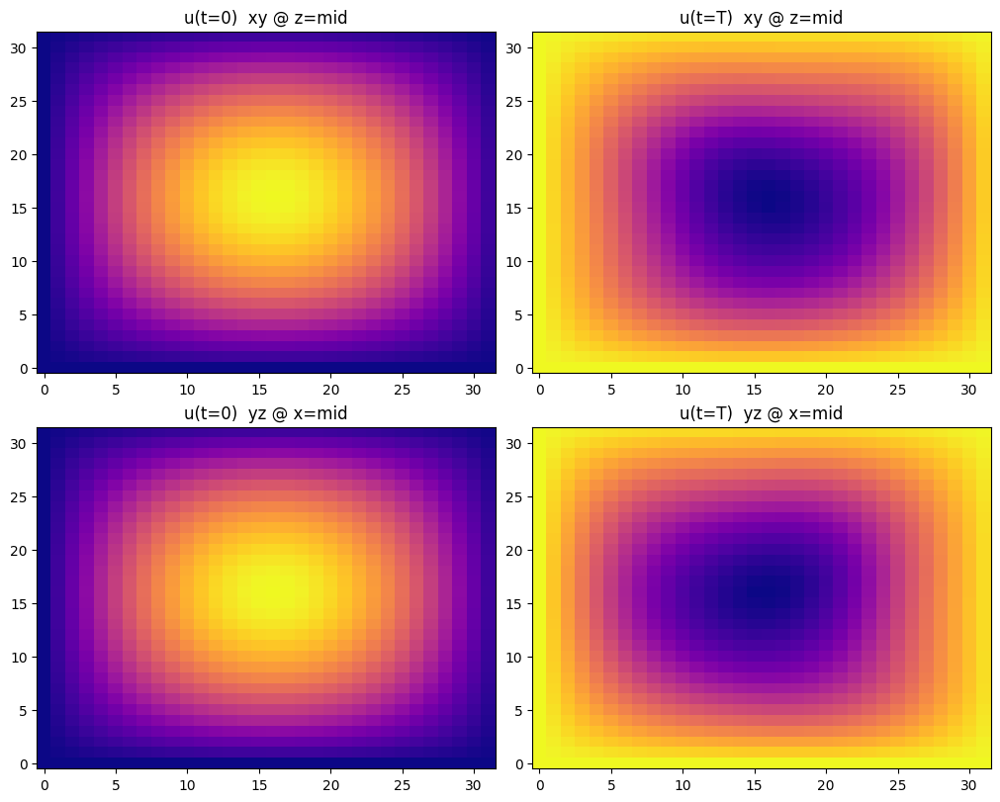

In [25]:
import numpy as np

# ============================================================
# 1) Grids
# ============================================================
def make_grid_2d(c1=1.0, c2=1.0, Nx=64, Ny=64):
    x = np.linspace(0.0, c1, Nx, endpoint=False)
    y = np.linspace(0.0, c2, Ny, endpoint=False)
    dx, dy = c1 / Nx, c2 / Ny
    X, Y = np.meshgrid(x, y, indexing="ij")
    return x, y, X, Y, dx, dy

def make_grid_3d(c1=1.0, c2=1.0, c3=1.0, Nx=32, Ny=32, Nz=32):
    x = np.linspace(0.0, c1, Nx, endpoint=False)
    y = np.linspace(0.0, c2, Ny, endpoint=False)
    z = np.linspace(0.0, c3, Nz, endpoint=False)
    dx, dy, dz = c1 / Nx, c2 / Ny, c3 / Nz
    X, Y, Z = np.meshgrid(x, y, z, indexing="ij")
    return x, y, z, X, Y, Z, dx, dy, dz

# ============================================================
# 2) Sine basis matrices and modal frequencies
#    phi_m(x)=sin(m*pi*x/c), m=1..M
# ============================================================
def sine_basis_1d(grid, c, Mmax):
    m = np.arange(1, Mmax + 1)[:, None]          # (M,1)
    return np.sin(m * np.pi * grid[None, :] / c) # (M,N)

def omega_2d(c, c1, c2, Mx, My):
    mx = np.arange(1, Mx + 1, dtype=float)
    my = np.arange(1, My + 1, dtype=float)
    k2 = (mx * np.pi / c1)[:, None]**2 + (my * np.pi / c2)[None, :]**2
    return c * np.sqrt(k2)  # (Mx,My)

def omega_3d(c, c1, c2, c3, Mx, My, Mz):
    mx = np.arange(1, Mx + 1, dtype=float)
    my = np.arange(1, My + 1, dtype=float)
    mz = np.arange(1, Mz + 1, dtype=float)
    k2 = (mx * np.pi / c1)[:, None, None]**2 + (my * np.pi / c2)[None, :, None]**2 + (mz * np.pi / c3)[None, None, :]**2
    return c * np.sqrt(k2)  # (Mx,My,Mz)

# ============================================================
# 3) Projections to sine modes
#    Using your normalization: (2^n / prod c_i) * ∫ F * Π sin(...)
#    With Riemann sums:
#      2D: B = (4/(c1*c2)) * dx*dy * (Sx @ F @ Sy^T)
#      3D: B = (8/(c1*c2*c3)) * dx*dy*dz * einsum('ai,bj,ck,ijk->abc', ...)
# ============================================================
def project_to_sines_2d(Fxy, Sx, Sy, dx, dy, c1, c2):
    norm = 4.0 / (c1 * c2)
    return norm * dx * dy * (Sx @ Fxy @ Sy.T)  # (Mx,My)

def project_to_sines_3d(Fxyz, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3):
    norm = 8.0 / (c1 * c2 * c3)
    return norm * dx * dy * dz * np.einsum("ai,bj,ck,ijk->abc", Sx, Sy, Sz, Fxyz, optimize=True)

# ============================================================
# 4) Reconstruction from sine coefficients
# ============================================================
def reconstruct_from_sines_2d(A, Sx, Sy):
    # v = sum_{m1,m2} A[m1,m2] sin_m1(x) sin_m2(y) = Sx^T A Sy
    return (Sx.T @ A @ Sy)  # (Nx,Ny)

def reconstruct_from_sines_3d(A, Sx, Sy, Sz):
    # v[i,j,k] = sum_{a,b,c} A[a,b,c] Sx[a,i] Sy[b,j] Sz[c,k]
    return np.einsum("abc,ai,bj,ck->ijk", A, Sx, Sy, Sz, optimize=True)  # (Nx,Ny,Nz)

# ============================================================
# 5) Time-stepping for A_m'' + omega^2 A_m = B_m(t)
#    State: A, V=dot(A)
#
#    Exact homogeneous propagation over dt:
#      A_{n+1} = A_n cos(w dt) + V_n sin(w dt)/w  + ∫ sin(w(dt-s))/w B(t_n+s) ds
#      V_{n+1} = -A_n w sin(w dt) + V_n cos(w dt) + ∫ cos(w(dt-s)) B(t_n+s) ds
#
#    We approximate the integrals on [t_n,t_{n+1}] by trapezoid using B_n, B_{n+1}:
#      I_sin ≈ (dt/2)[ sin(w dt)/w * B_n + 0 * B_{n+1} ]?  (not good)
#
#    Better: evaluate kernel at endpoints:
#      ∫_{t_n}^{t_{n+1}} K(t_{n+1}-s) B(s) ds
#      ≈ (dt/2)[ K(dt)*B_n + K(0)*B_{n+1} ]
#
#    where:
#      K_sin(τ)=sin(w τ)/w,   K_cos(τ)=cos(w τ)
# ============================================================
def step_forced_oscillator_trap(A, V, w, Bn, Bnp1, dt):
    wd = w * dt
    c = np.cos(wd)
    s = np.sin(wd)

    # handle w=0 safely (not present for Dirichlet sine modes, but keep robust)
    invw = np.where(w > 0, 1.0 / w, 0.0)

    # endpoint kernels
    Ksin_dt = s * invw       # sin(w dt)/w
    Ksin_0  = 0.0            # sin(0)/w = 0
    Kcos_dt = c              # cos(w dt)
    Kcos_0  = 1.0            # cos(0)

    # trapezoid for the Duhamel integrals
    I_A = 0.5 * dt * (Ksin_dt * Bn + Ksin_0 * Bnp1)
    I_V = 0.5 * dt * (Kcos_dt * Bn + Kcos_0 * Bnp1)

    A_next = A * c + V * (s * invw) + I_A
    V_next = -A * (w * s) + V * c + I_V
    return A_next, V_next

# ============================================================
# 6) Main solver: 2D / 3D
#    You provide:
#      - phi(x) = varphi(x)
#      - psi(x)
#      - w(t,x) and operators w_tt and Laplacian(w) (or set w=0)
#      - source f(t,x)
# ============================================================
def solve_wave_modal(
    dim,
    c_speed,
    # box sizes
    c1=1.0, c2=1.0, c3=1.0,
    # quadrature grids
    Nx=64, Ny=64, Nz=32,
    # modal truncation
    Mx=20, My=20, Mz=12,
    # time
    tgrid=None,
    # user fields
    varphi=None,   # function of (X,Y) or (X,Y,Z)
    psi=None,      # function of (X,Y) or (X,Y,Z)
    f_src=None,    # function f(t, X,...) same shape as grid
    w_fun=None,    # function w(t, X,...) or None => 0
    w_tt=None,     # function w_tt(t, X,...) or None => 0
    lap_w=None,    # function Δw(t, X,...) or None => 0
):
    if tgrid is None:
        tgrid = np.linspace(0.0, 2.0, 401)
    tgrid = np.asarray(tgrid, dtype=float)
    if np.any(np.diff(tgrid) <= 0):
        raise ValueError("tgrid must be strictly increasing")
    Nt = len(tgrid)

    if dim == 2:
        x, y, X, Y, dx, dy = make_grid_2d(c1, c2, Nx, Ny)
        Sx = sine_basis_1d(x, c1, Mx)  # (Mx,Nx)
        Sy = sine_basis_1d(y, c2, My)  # (My,Ny)
        w = omega_2d(c_speed, c1, c2, Mx, My)

        # init fields
        if varphi is None or psi is None or f_src is None:
            raise ValueError("Provide varphi(X,Y), psi(X,Y), and f_src(t,X,Y).")

        phi = varphi(X, Y)
        ps  = psi(X, Y)

        w0 = w_fun(0.0, X, Y) if w_fun is not None else 0.0
        b0 = 0.0  # w_t(0) is not needed explicitly if you supply v_t(0); we use psi - b(x)
        # if you want b(x) nonzero, bake it into psi by passing psi_eff=psi-b

        v0   = phi - w0
        v0_t = ps  - b0

        A0 = project_to_sines_2d(v0,   Sx, Sy, dx, dy, c1, c2)
        V0 = project_to_sines_2d(v0_t, Sx, Sy, dx, dy, c1, c2)

        A = np.zeros((Nt, Mx, My))
        V = np.zeros((Nt, Mx, My))
        A[0], V[0] = A0, V0

        # helper to compute B(t) from F=f - w_tt + c^2 Δw
        def B_of_t(t):
            f = f_src(t, X, Y)
            wtt = w_tt(t, X, Y) if w_tt is not None else 0.0
            lw  = lap_w(t, X, Y) if lap_w is not None else 0.0
            F = f - wtt + (c_speed**2) * lw
            return project_to_sines_2d(F, Sx, Sy, dx, dy, c1, c2)

        Bn = B_of_t(tgrid[0])
        for n in range(Nt - 1):
            dt = float(tgrid[n+1] - tgrid[n])
            Bnp1 = B_of_t(tgrid[n+1])
            A[n+1], V[n+1] = step_forced_oscillator_trap(A[n], V[n], w, Bn, Bnp1, dt)
            Bn = Bnp1

        def reconstruct_u(idx):
            t = float(tgrid[idx])
            wv = w_fun(t, X, Y) if w_fun is not None else 0.0
            v = reconstruct_from_sines_2d(A[idx], Sx, Sy)
            return wv + v

        return dict(
            t=tgrid, A=A, V=V, omega=w,
            x=x, y=y, X=X, Y=Y, dx=dx, dy=dy,
            Sx=Sx, Sy=Sy, reconstruct_u=reconstruct_u
        )

    elif dim == 3:
        x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)
        Sx = sine_basis_1d(x, c1, Mx)
        Sy = sine_basis_1d(y, c2, My)
        Sz = sine_basis_1d(z, c3, Mz)
        w = omega_3d(c_speed, c1, c2, c3, Mx, My, Mz)

        if varphi is None or psi is None or f_src is None:
            raise ValueError("Provide varphi(X,Y,Z), psi(X,Y,Z), and f_src(t,X,Y,Z).")

        phi = varphi(X, Y, Z)
        ps  = psi(X, Y, Z)

        w0 = w_fun(0.0, X, Y, Z) if w_fun is not None else 0.0
        b0 = 0.0
        v0   = phi - w0
        v0_t = ps  - b0

        A0 = project_to_sines_3d(v0,   Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)
        V0 = project_to_sines_3d(v0_t, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

        A = np.zeros((Nt, Mx, My, Mz))
        V = np.zeros((Nt, Mx, My, Mz))
        A[0], V[0] = A0, V0

        def B_of_t(t):
            f = f_src(t, X, Y, Z)
            wtt = w_tt(t, X, Y, Z) if w_tt is not None else 0.0
            lw  = lap_w(t, X, Y, Z) if lap_w is not None else 0.0
            F = f - wtt + (c_speed**2) * lw
            return project_to_sines_3d(F, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

        Bn = B_of_t(tgrid[0])
        for n in range(Nt - 1):
            dt = float(tgrid[n+1] - tgrid[n])
            Bnp1 = B_of_t(tgrid[n+1])
            A[n+1], V[n+1] = step_forced_oscillator_trap(A[n], V[n], w, Bn, Bnp1, dt)
            Bn = Bnp1

        def reconstruct_u(idx):
            t = float(tgrid[idx])
            wv = w_fun(t, X, Y, Z) if w_fun is not None else 0.0
            v = reconstruct_from_sines_3d(A[idx], Sx, Sy, Sz)
            return wv + v

        return dict(
            t=tgrid, A=A, V=V, omega=w,
            x=x, y=y, z=z, X=X, Y=Y, Z=Z, dx=dx, dy=dy, dz=dz,
            Sx=Sx, Sy=Sy, Sz=Sz, reconstruct_u=reconstruct_u
        )

    else:
        raise ValueError("dim must be 2 or 3")

# ============================================================
# 7) Example main(): 3D forced wave with Gaussian source, w=0
# ============================================================
import numpy as np
import matplotlib.pyplot as plt

def as_array(U):
    # Defensive: if U is list/tuple, convert; if it's already ndarray, keep.
    if isinstance(U, np.ndarray):
        return U
    return np.asarray(U)

def plot_slices_plasma(u0, uT, Nx, Ny, Nz, title_prefix="u", cmap="plasma"):
    u0 = as_array(u0)
    uT = as_array(uT)

    if u0.ndim == 2:
        # 2D: just plot u(x,y) at t=0 and t=T
        fig, ax = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)
        ax[0].imshow(u0.T, origin="lower", aspect="auto", cmap="plasma")
        ax[0].set_title(f"{title_prefix}(t=0)")
        ax[1].imshow(uT.T, origin="lower", aspect="auto", cmap="plasma")
        ax[1].set_title(f"{title_prefix}(t=T)")
        plt.show()
        return

    if u0.ndim != 3:
        raise ValueError(f"Expected u to be 2D or 3D array, got shape={u0.shape}, ndim={u0.ndim}")

    iz = u0.shape[2] // 2
    ix = u0.shape[0] // 2

    fig, ax = plt.subplots(2, 2, figsize=(10, 8), constrained_layout=True)

    # xy @ mid-z
    ax[0, 0].imshow(u0[:, :, iz].T, origin="lower", aspect="auto", cmap=cmap)
    ax[0, 0].set_title(f"{title_prefix}(t=0)  xy @ z=mid")
    ax[0, 1].imshow(uT[:, :, iz].T, origin="lower", aspect="auto", cmap=cmap)
    ax[0, 1].set_title(f"{title_prefix}(t=T)  xy @ z=mid")

    # yz @ mid-x
    ax[1, 0].imshow(u0[ix, :, :].T, origin="lower", aspect="auto", cmap=cmap)
    ax[1, 0].set_title(f"{title_prefix}(t=0)  yz @ x=mid")
    ax[1, 1].imshow(uT[ix, :, :].T, origin="lower", aspect="auto", cmap=cmap)
    ax[1, 1].set_title(f"{title_prefix}(t=T)  yz @ x=mid")

    plt.show()

def reconstruct_u_from_modal(sol, t_index):
    # force integer index
    if t_index < 0:
        t_index = len(sol["t"]) + t_index

    A = np.asarray(sol["A"][t_index])     # (Mx,My,Mz)
    Sx = np.asarray(sol["Sx"])            # (Mx,Nx)
    Sy = np.asarray(sol["Sy"])            # (My,Ny)
    Sz = np.asarray(sol["Sz"])            # (Mz,Nz)

    # modal -> physical
    v = np.einsum("abc,ai,bj,ck->ijk", A, Sx, Sy, Sz, optimize=True)

    # add boundary lift w(t,x)
    t = float(sol["t"][t_index])
    c1, c2, c3 = sol["c"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    p = sol["boundary_params"]

    if sol["boundary_mode"] == "ramp":
        w, _, _ = w_and_derivs_3d_ramp(
            t, X, Y, Z, c1, c2, c3,
            T_room=p["T_room"], gamma=p["gamma"], T_cold=p["T_cold"]
        )
    else:
        w, _, _ = w_and_derivs_3d_const_linear(
            t, X, Y, Z, c1, c2, c3,
            a=p["a_const"], e=p["e_const"], f=p["f_const"]
        )

    U = w + v
    # hard assert: must be 3D
    if U.ndim != 3:
        raise RuntimeError(f"reconstruct produced ndim={U.ndim}, shape={U.shape}")
    return U

def main():
    dim = 3
    c_speed = 1.0

    c1 = c2 = c3 = 1.0
    Nx = Ny = Nz = 32
    Mx = My = Mz = 10
    tgrid = np.linspace(0.0, 2.0, 301)

    def varphi(X, Y, Z):
        return 0.25 * np.sin(np.pi * X / c1) * np.sin(np.pi * Y / c2) * np.sin(np.pi * Z / c3)

    def psi(X, Y, Z):
        return 0.0 * X

    x0 = (0.45, 0.60, 0.55)
    omega = 2.0 * np.pi
    def f_src(t, X, Y, Z):
        dx = X - x0[0]
        dy = Y - x0[1]
        dz = Z - x0[2]
        return (np.sin(omega * t) ** 2) * np.exp(-(dx*dx + dy*dy + dz*dz) / (2 * 0.08**2))

    sol = solve_wave_modal(
        dim=dim, c_speed=c_speed,
        c1=c1, c2=c2, c3=c3,
        Nx=Nx, Ny=Ny, Nz=Nz,
        Mx=Mx, My=My, Mz=Mz,
        tgrid=tgrid,
        varphi=varphi, psi=psi, f_src=f_src,
        w_fun=None, w_tt=None, lap_w=None
    )
    
    recon = sol["reconstruct_u"]
    u0 = recon(0)
    uT = recon(-1)

    print("u0 type:", type(u0), "shape:", getattr(u0, "shape", None))
    print("uT type:", type(uT), "shape:", getattr(uT, "shape", None))

    plot_slices_plasma(u0, uT, Nx, Ny, Nz, title_prefix="u")

    return sol


if __name__ == "__main__":
    sol = main()

#### Duhamel's Principle on Solving Second Order VOP Wave Functions
Duhamel's Principle provides a method to solve non-homogeneous linear partial differential equations (PDEs) by relating them to their corresponding homogeneous equations. For second-order wave equations with a source term, Duhamel's Principle can be applied as follows:
Consider the second-order wave equation with a source term $F(t,x,y)$ in a bounded domain
$\mathcal{\Omega} \subset \mathbb{R}^2$ with homogeneous Dirichlet boundary conditions:
$$
\begin{cases}
\frac{\partial^2 u}{\partial t^2} = c^2(\frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2}) + F(t,x,y), \qquad (x,y) \in \mathcal{\Omega}, \qquad t>0\\
F(t,x,y) = A \cdot \exp{\big(-\frac{(x-x_0)^2+(y-y_0)^2}{2\sigma^2}\big)} \exp{\big(-\frac{(t-t_0)^2}{2\tau^2}\big)}, \qquad A = \frac{\pi^{-3/2}}{8}\\
u(t,x,y) = 0, \qquad (x,y) \in \partial \mathcal{\Omega}, \qquad t>0, \qquad \text{Dirichlet Boundary Conditions}\\
\frac{\partial u}{\partial n}(t,x,y) = 0, \qquad (x,y) \in \partial \mathcal{\Omega}, \qquad t>0, \qquad \text{Neumann Boundary Conditions}\\
\end{cases}
$$
First solve the homogeneous boundary conditions
$$
\frac{\partial^2 u_h}{\partial t^2} = c^2 \nabla^2 u_h, \qquad u_h(0,x,y)=f(x,y), \qquad \partial_{t}u_h(0,x,y)=g(x,y)
$$
We consider the source term as the motion driven by the time convolution:
$$
u(t,x,y) = u_h(t,x,y) + \int_{0}^{t} \int_{\mathcal{\Omega}} G(t-s,x,y;\xi,\eta) F(s,\xi,\eta) \text{d}\xi \text{d}\eta \text{d}s
$$
where $G(t,x,y;\xi,\eta)$ is the Green's function for the homogeneous wave equation satisfying the boundary conditions. The Green's function represents the response of the system at point $(x,y)$ and time $t$ due to an impulse applied at point $(\xi,\eta)$ and time $s$.
The Green's function for the 2D wave equation with Dirichlet boundary conditions on a
rectangular domain $\mathcal{\Omega} = [0,L_x] \times [0,L_y]$ is given by:
$$
G(t,x,y;\xi,\eta) = \frac{4}{L_x L_y
} \sum_{m=1}^{\infty} \sum_{n=1}^{\infty} \sin{\Big(\frac{m \pi x}{L_x}\Big)} \sin{\Big(\frac{n \pi y}{L_y}\Big)} \sin{\Big(\frac{m \pi \xi}{L_x}\Big)} \sin{\Big(\frac{n \pi \eta}{L_y}\Big)} \frac{\sin{(c \pi \sqrt{(m/L_x)^2 + (n/L_y)^2} t)}}{c \pi \sqrt{(m/L_x)^2 + (n/L_y)^2}}
$$
Denote the Green's Function solution to the homogeneous wave equation $w(t,x,y)$
$$
w(t,x,y) = \int_{0}^{t} \int_{\mathcal{\
Omega}} G(t-s,x,y;\xi,\eta) F(s,\xi,\eta) \text{d}\xi \text{d}\eta \text{d}s
$$
The full solution to the non-homogeneous wave equation is then given by
$$
u(t,x,y) = u_h(t,x,y) + \int_{0}^{t} w(t-\tau,x,y)F(\tau,x,y)\text{d}\tau
$$
We consider the numerical solutions by splitting the grid to discrete, mutually disjoint sections
$$
x_i = i\Delta x, \qquad y_i = i\Delta y, \qquad t^n = n\Delta t
$$
where $\Delta x$, $\Delta y$, and $\Delta t$ are the spatial and temporal step sizes, respectively. The discrete approximation of the solution at grid points $(x_i, y_j)$ and time $t^n$ is denoted by $u_{i,j}^n \approx u(t^n, x_i, y_j)$.
By forward difference via the central form
$$
\frac{u_{i,j}^{n+1} - 2u_{i,j}^{n} + u_{i,j}^{n-1}}{(\Delta t)^2} = c^2 \Bigg(\frac{u_{i+1,j}^{n} - 2u_{i,j}^{n} + u_{i-1,j}^{n}}{(\Delta x)^2} + \frac{u_{i,j+1}^{n} - 2u_{i,j}^{n} + u_{i,j-1}^{n}}{(\Delta y)^2}\Bigg) + F(t^n, x_i, y_j)
$$
Rearranging the terms, we obtain the update formula for the numerical solution:
$$
u_{i,j}^{n+1} = 2u_{i,j}^{n} - u_{i,j}^{n-1} + r_x^2 (u_{i+1,j}^{n} - 2u_{i,j}^{n} + u_{i-1,j}^{n}) + r_y^2 (u_{i,j+1}^{n} - 2u_{i,j}^{n} + u_{i,j-1}^{n}) + (\Delta t)^2 F^{n}_{i,j}
$$
where $r_x = \frac{c \Delta t}{\Delta x}$ and $r_y = \frac{c \Delta t}{\Delta y}$ are the Courant numbers in the $x$ and $y$ directions, respectively, and $F^{n}_{i,j} = F(t^n, x_i, y_j)$.
The initial conditions are incorporated as follows:
$$\Delta u^0_{i,j} = \nabla^2 u^0_{i,j} = c^2 \Bigg(\frac{u_{i+1,j}^{0} - 2u_{i,j}^{0} + u_{i-1,j}^{0}}{(\Delta x)^2} + \frac{u_{i,j+1}^{0} - 2u_{i,j}^{0} + u_{i,j-1}^{0}}{(\Delta y)^2}\Bigg)$$
$$
u_{i,j}^{0} = f(x_i, y_j), \qquad u_{i,j}^{1} = u_{i,j}^{0} + \Delta t g(x_i, y_j) + \frac{(\Delta t)^2}{2} \Bigg(c^2 \Delta u^0_{i,j} + F^{0}_{i,j}\Bigg)
$$

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.colors import TwoSlopeNorm
from IPython.display import HTML

def wave2d_gaussian_source_demo(
    Lx=2.0, Ly=2.0,
    Nx=100, Ny=100,
    c=1.0, T=5.0, dt=1e-4,
    frames=200,
    sigma=0.02, tau=0.05, t0=0.5, A=1000.0,
):
    # ----------------------------
    # Grid
    # ----------------------------
    dx, dy = Lx / (Nx - 1), Ly / (Ny - 1)
    x = np.linspace(0.0, Lx, Nx)
    y = np.linspace(0.0, Ly, Ny)
    X, Y = np.meshgrid(x, y, indexing="ij")

    # ----------------------------
    # Time + stability
    # ----------------------------
    Nt = int(T / dt)

    CFL = c * dt * np.sqrt(1.0 / dx**2 + 1.0 / dy**2)
    if CFL >= 1.0:
        raise ValueError(f"CFL condition violated: CFL={CFL} >= 1.0")

    # ----------------------------
    # Gaussian source (precompute spatial part)
    # ----------------------------
    x0, y0 = Lx / 2, Ly / 2
    spatial = np.exp(-((X - x0) ** 2 + (Y - y0) ** 2) / (2.0 * sigma**2))

    def gaussian_source(t):
        temporal = A * np.exp(-((t - t0) ** 2) / (2.0 * tau**2))
        return spatial * temporal

    # ----------------------------
    # State buffers
    # ----------------------------
    u_prev = np.zeros((Nx, Ny), dtype=float)
    u_curr = np.zeros((Nx, Ny), dtype=float)
    u_next = np.zeros((Nx, Ny), dtype=float)

    # Frame sampling (ensure unique + sorted indices)
    frame_indices = np.unique(np.linspace(0, Nt - 1, frames, dtype=int))
    frame_set = set(frame_indices.tolist())
    u_frames = []
    t_frames = []

    c2dt2 = (c * dt) ** 2
    invdx2 = 1.0 / dx**2
    invdy2 = 1.0 / dy**2

    # ----------------------------
    # Time stepping
    # ----------------------------
    for n in range(1, Nt):
        t = n * dt
        f = gaussian_source(t)

        lap = (
            (u_curr[2:, 1:-1] - 2 * u_curr[1:-1, 1:-1] + u_curr[0:-2, 1:-1]) * invdx2
            + (u_curr[1:-1, 2:] - 2 * u_curr[1:-1, 1:-1] + u_curr[1:-1, 0:-2]) * invdy2
        )

        u_next[1:-1, 1:-1] = (
            2 * u_curr[1:-1, 1:-1] - u_prev[1:-1, 1:-1]
            + c2dt2 * lap
            + (dt**2) * f[1:-1, 1:-1]
        )

        # Dirichlet boundary
        u_next[0, :] = 0.0
        u_next[-1, :] = 0.0
        u_next[:, 0] = 0.0
        u_next[:, -1] = 0.0

        if n in frame_set:
            u_frames.append(u_next.copy())
            t_frames.append(t)

        # rotate buffers
        u_prev, u_curr, u_next = u_curr, u_next, u_prev
        u_next.fill(0.0)

    if not u_frames:
        raise RuntimeError("No frames captured. Increase `frames` or check sampling logic.")

    # ----------------------------
    # Stable color scaling
    # ----------------------------
    max_abs = max(np.max(np.abs(u)) for u in u_frames) or 1.0
    norm = TwoSlopeNorm(vmin=-max_abs, vcenter=0.0, vmax=max_abs)

    # ----------------------------
    # Animate
    # ----------------------------
    fig, ax = plt.subplots(figsize=(6.4, 5.4))
    im = ax.imshow(
        u_frames[0].T,
        origin="lower",
        extent=(0, Lx, 0, Ly),
        cmap="viridis",
        norm=norm,
        interpolation="nearest",
        animated=True,
    )
    fig.colorbar(im, ax=ax, pad=0.02).set_label("u(x, y, t)")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    title = ax.set_title("2D Wave Equation with Gaussian Source")
    time_text = ax.text(0.02, 0.98, "", transform=ax.transAxes, ha="left", va="top")

    def init():
        im.set_data(u_frames[0].T)
        time_text.set_text(f"t = {t_frames[0]:.4f}")
        return (im, time_text, title)

    def update(i):
        im.set_data(u_frames[i].T)
        time_text.set_text(f"t = {t_frames[i]:.4f}")
        return (im, time_text, title)

    ani = animation.FuncAnimation(
        fig,
        update,
        frames=len(u_frames),
        init_func=init,
        interval=50,
        blit=True,   # if you see issues, switch to False
        repeat=True,
    )

    plt.close(fig)  # prevents a duplicate static figure in notebooks
    return ani

# ---- Jupyter display ----
ani = wave2d_gaussian_source_demo()
HTML(ani.to_jshtml())
    

In [41]:
def gaussian_internal_3d(X, Y, Z, x0=(0.5,0.5,0.5), sigma=0.1):
    dx = X - x0[0]
    dy = Y - x0[1]
    dz = Z - x0[2]
    r2 = dx*dx + dy*dy + dz*dz
    return np.exp(-r2 / (2.0 * sigma * sigma))

def gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=0.1):
    # "distance-to-boundary" version of your mask idea:
    dx = np.minimum(X, c1 - X)
    dy = np.minimum(Y, c2 - Y)
    dz = np.minimum(Z, c3 - Z)

    gx = np.exp(-(dx*dx) / (2.0 * delta*delta))
    gy = np.exp(-(dy*dy) / (2.0 * delta*delta))
    gz = np.exp(-(dz*dz) / (2.0 * delta*delta))

    # combine faces: large near any face
    return gx + gy + gz

def w_and_derivs_3d_gaussian_bc(
    t, X, Y, Z, c1, c2, c3, dx, dy, dz,
    amp0=1.0, omega=2*np.pi,
    x0=(0.5,0.5,0.5), sigma_in=0.1, A_in=1.0,
    delta=0.1, A_ext=1.0,
):
    """
    w(t,x)=a(t)*(A_ext*gext(x)+A_in*gin(x))
    returns: w, w_t, gradw_vec (Nx,Ny,Nz,3), lap_w (Nx,Ny,Nz)
    """
    gext = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=delta)
    gin  = gaussian_internal_3d(X, Y, Z, x0=x0, sigma=sigma_in)

    G = A_ext * gext + A_in * gin

    a   = amp0 * np.sin(omega * t)
    a_t = amp0 * omega * np.cos(omega * t)

    w   = a   * G
    w_t = a_t * G

    # ∇w = a(t) ∇G
    Gx, Gy, Gz = np.gradient(G, dx, dy, dz, edge_order=2)
    gradw = np.stack([a*Gx, a*Gy, a*Gz], axis=-1)

    # Δw = a(t) ΔG (since a(t) purely time)
    # Compute Laplacian of G by second derivatives
    Gxx = np.gradient(Gx, dx, axis=0, edge_order=2)
    Gyy = np.gradient(Gy, dy, axis=1, edge_order=2)
    Gzz = np.gradient(Gz, dz, axis=2, edge_order=2)
    lap_w = a * (Gxx + Gyy + Gzz)

    return w, w_t, gradw, lap_w

In [38]:
def plot_u_initial_final_with_gaussian_bc(sol, title="u with Gaussian BC", cmap="plasma"):
    # you said reconstruct_u_from_modal exists in your codebase
    u0 = reconstruct_u_from_modal(sol, 0)
    uT = reconstruct_u_from_modal(sol, -1)

    if u0.ndim != 3:
        raise ValueError(f"Expected u0 3D, got shape={u0.shape}")

    Nx, Ny, Nz = u0.shape
    iz = Nz // 2
    ix = Nx // 2

    c1, c2, c3 = sol["c"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    p = sol["boundary_params"]

    t0 = float(sol["t"][0])
    tT = float(sol["t"][-1])

    gext0 = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=p["delta"])
    gin0  = gaussian_internal_3d(X, Y, Z, x0=p["x0"], sigma=p["sigma_in"])
    a0 = p["amp0"] * np.sin(p["omega"] * t0)
    wext0 = a0 * (p["A_ext"] * gext0)
    win0  = a0 * (p["A_in"]  * gin0)

    gextT = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=p["delta"])
    ginT  = gaussian_internal_3d(X, Y, Z, x0=p["x0"], sigma=p["sigma_in"])
    aT = p["amp0"] * np.sin(p["omega"] * tT)
    wextT = aT * (p["A_ext"] * gextT)
    winT  = aT * (p["A_in"]  * ginT)

    vmin_u = min(u0.min(), uT.min())
    vmax_u = max(u0.max(), uT.max())

    vmin_w = min(wext0.min(), wextT.min(), win0.min(), winT.min())
    vmax_w = max(wext0.max(), wextT.max(), win0.max(), winT.max())

    fig, ax = plt.subplots(2, 4, figsize=(16, 8), constrained_layout=True)

    # Row 1: u
    im = ax[0,0].imshow(u0[:, :, iz].T, origin="lower", aspect="auto",
                        cmap=cmap, vmin=vmin_u, vmax=vmax_u)
    ax[0,0].set_title("u(t=0)  xy"); ax[0,0].set_xlabel("x"); ax[0,0].set_ylabel("y")
    fig.colorbar(im, ax=ax[0,0], fraction=0.046, pad=0.02)

    im = ax[0,1].imshow(uT[:, :, iz].T, origin="lower", aspect="auto",
                        cmap=cmap, vmin=vmin_u, vmax=vmax_u)
    ax[0,1].set_title("u(t=T)  xy"); ax[0,1].set_xlabel("x"); ax[0,1].set_ylabel("y")
    fig.colorbar(im, ax=ax[0,1], fraction=0.046, pad=0.02)

    im = ax[0,2].imshow(u0[ix, :, :].T, origin="lower", aspect="auto",
                        cmap=cmap, vmin=vmin_u, vmax=vmax_u)
    ax[0,2].set_title("u(t=0)  yz"); ax[0,2].set_xlabel("y"); ax[0,2].set_ylabel("z")
    fig.colorbar(im, ax=ax[0,2], fraction=0.046, pad=0.02)

    im = ax[0,3].imshow(uT[ix, :, :].T, origin="lower", aspect="auto",
                        cmap=cmap, vmin=vmin_u, vmax=vmax_u)
    ax[0,3].set_title("u(t=T)  yz"); ax[0,3].set_xlabel("y"); ax[0,3].set_ylabel("z")
    fig.colorbar(im, ax=ax[0,3], fraction=0.046, pad=0.02)

    # Row 2: boundary components (xy views to match your code)
    im = ax[1,0].imshow(wext0[:, :, iz].T, origin="lower", aspect="auto",
                        cmap=cmap, vmin=vmin_w, vmax=vmax_w)
    ax[1,0].set_title("w_ext(t=0)  xy"); ax[1,0].set_xlabel("x"); ax[1,0].set_ylabel("y")
    fig.colorbar(im, ax=ax[1,0], fraction=0.046, pad=0.02)

    im = ax[1,1].imshow(wextT[:, :, iz].T, origin="lower", aspect="auto",
                        cmap=cmap, vmin=vmin_w, vmax=vmax_w)
    ax[1,1].set_title("w_ext(t=T)  xy"); ax[1,1].set_xlabel("x"); ax[1,1].set_ylabel("y")
    fig.colorbar(im, ax=ax[1,1], fraction=0.046, pad=0.02)

    im = ax[1,2].imshow(win0[:, :, iz].T, origin="lower", aspect="auto",
                        cmap=cmap, vmin=vmin_w, vmax=vmax_w)
    ax[1,2].set_title("w_in(t=0)  xy"); ax[1,2].set_xlabel("x"); ax[1,2].set_ylabel("y")
    fig.colorbar(im, ax=ax[1,2], fraction=0.046, pad=0.02)

    im = ax[1,3].imshow(winT[:, :, iz].T, origin="lower", aspect="auto",
                        cmap=cmap, vmin=vmin_w, vmax=vmax_w)
    ax[1,3].set_title("w_in(t=T)  xy"); ax[1,3].set_xlabel("x"); ax[1,3].set_ylabel("y")
    fig.colorbar(im, ax=ax[1,3], fraction=0.046, pad=0.02)

    fig.suptitle(title, fontsize=14)
    plt.show()

In [39]:
def main_with_gaussian_bc():
    # domain / grid
    c1 = c2 = c3 = 2.0
    Nx = Ny = Nz = 48
    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

    # Gaussian BC params (your style)
    p = dict(
        delta=0.12,
        sigma_in=0.18,
        amp0=1.0,
        omega=2.0*np.pi,
        x0=(0.8, 1.2, 1.0),
        A_in=1.0,
        A_ext=1.0,
    )

    # boundary lift functions w, w_tt, Δw for the wave forcing split
    def w_fun(t):
        w, _, _, _ = w_and_derivs_3d_gaussian_bc(
            t, X, Y, Z, c1, c2, c3, dx, dy, dz,
            amp0=p["amp0"], omega=p["omega"],
            x0=p["x0"], sigma_in=p["sigma_in"], A_in=p["A_in"],
            delta=p["delta"], A_ext=p["A_ext"],
        )
        return w

    def w_tt_fun(t):
        # w_tt = a_tt * G ; a(t)=amp0 sin(ωt) => a_tt = -amp0 ω^2 sin(ωt)
        gext = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=p["delta"])
        gin  = gaussian_internal_3d(X, Y, Z, x0=p["x0"], sigma=p["sigma_in"])
        G = p["A_ext"]*gext + p["A_in"]*gin
        a_tt = -p["amp0"] * (p["omega"]**2) * np.sin(p["omega"] * t)
        return a_tt * G

    def lap_w_fun(t):
        _, _, _, lap_w = w_and_derivs_3d_gaussian_bc(
            t, X, Y, Z, c1, c2, c3, dx, dy, dz,
            amp0=p["amp0"], omega=p["omega"],
            x0=p["x0"], sigma_in=p["sigma_in"], A_in=p["A_in"],
            delta=p["delta"], A_ext=p["A_ext"],
        )
        return lap_w

    # initial data: u(0)=varphi, u_t(0)=psi
    def varphi(X, Y, Z):
        return w_fun(0.0) + 0.15*np.sin(np.pi*X/c1)*np.sin(2*np.pi*Y/c2)*np.sin(np.pi*Z/c3)

    def psi(X, Y, Z):
        return 0.0*X

    # source f(t,x): (your gaussian pulse style)
    src_sigma = 0.15
    src_tau = 0.12
    src_t0 = 0.6
    src_A = 10.0
    src_x0 = (1.0, 1.0, 1.0)

    def f_src(t, X, Y, Z):
        dx0 = X - src_x0[0]
        dy0 = Y - src_x0[1]
        dz0 = Z - src_x0[2]
        spatial = np.exp(-(dx0*dx0 + dy0*dy0 + dz0*dz0) / (2.0*src_sigma*src_sigma))
        temporal = src_A * np.exp(-((t - src_t0)**2) / (2.0*src_tau*src_tau))
        return spatial * temporal

    # time grid
    tgrid = np.linspace(0.0, 2.0, 301)
    c_speed = 1.0

    # ---- IMPORTANT:
    # This assumes you have solve_wave_modal(...) that returns dict with:
    #   sol["t"], sol["X"], sol["Y"], sol["Z"], sol["c"], sol["boundary_params"]
    #   and sol contains your modal coefficients + reconstruct_u_from_modal(sol, idx)
    sol = solve_wave_modal(
        dim=3, c_speed=c_speed,
        c1=c1, c2=c2, c3=c3,
        Nx=Nx, Ny=Ny, Nz=Nz,
        Mx=10, My=10, Mz=10,
        tgrid=tgrid,
        varphi=varphi, psi=psi, f_src=f_src,
        w_fun=w_fun, w_tt=w_tt_fun, lap_w=lap_w_fun
    )

    # store for plotter
    sol["boundary_params"] = dict(**p)
    sol["c"] = (c1, c2, c3)

    plot_u_initial_final_with_gaussian_bc(
        sol,
        title="3D forced wave: u(t) with external+internal Gaussian BC lift",
        cmap="plasma"
    )
    return sol

In [57]:
# import numpy as np

# # ---- reconstruct v from modal coefficients A (Mx,My,Mz) to grid (Nx,Ny,Nz)
# def reconstruct_v_3d_from_A(A, Sx, Sy, Sz):
#     # v[i,j,k] = sum_{a,b,c} A[a,b,c] Sx[a,i] Sy[b,j] Sz[c,k]
#     return np.einsum("abc,ai,bj,ck->ijk", A, Sx, Sy, Sz, optimize=True)

# # ---- centered FD for gradient (Dirichlet: treat boundary as fixed 0 for v)
# def grad_centered_dirichlet(v, dx, dy, dz):
#     gx = np.zeros_like(v)
#     gy = np.zeros_like(v)
#     gz = np.zeros_like(v)

#     gx[1:-1,:,:] = (v[2:,:,:] - v[0:-2,:,:])/(2*dx)
#     gy[:,1:-1,:] = (v[:,2:,:] - v[:,0:-2,:])/(2*dy)
#     gz[:,:,1:-1] = (v[:,:,2:] - v[:,:,0:-2])/(2*dz)

#     # boundaries remain 0 (consistent with Dirichlet extension)
#     return gx, gy, gz

# # ---- compute Cadv(A) = projection of (-kappa·∇v) onto sine basis
# def advect_coeffs_centered_from_A(A, Sx, Sy, Sz, dx, dy, dz, kappa_vec,
#                                   project_to_sines_3d, c1, c2, c3):
#     v = reconstruct_v_3d_from_A(A, Sx, Sy, Sz)
#     gx, gy, gz = grad_centered_dirichlet(v, dx, dy, dz)
#     adv = -(kappa_vec[0]*gx + kappa_vec[1]*gy + kappa_vec[2]*gz)
#     return project_to_sines_3d(adv, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

# # ---- your Gaussian BC pieces (the "external mask" + internal Gaussian)
# def gaussian_internal_3d(X, Y, Z, x0=(0.5,0.5,0.5), sigma=0.1):
#     dx0 = X - x0[0]
#     dy0 = Y - x0[1]
#     dz0 = Z - x0[2]
#     r2 = dx0*dx0 + dy0*dy0 + dz0*dz0
#     return np.exp(-r2/(2.0*sigma*sigma))

# def gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=0.1):
#     # smooth "distance to boundary" bump (large near any face)
#     dx = np.minimum(X, c1 - X)
#     dy = np.minimum(Y, c2 - Y)
#     dz = np.minimum(Z, c3 - Z)
#     gx = np.exp(-(dx*dx)/(2.0*delta*delta))
#     gy = np.exp(-(dy*dy)/(2.0*delta*delta))
#     gz = np.exp(-(dz*dz)/(2.0*delta*delta))
#     return gx + gy + gz

# # ---- Gaussian lift: returns w, w_t, gradw_vec, lap_w (all consistent)
# def w_and_derivs_3d_gaussian_bc(t, X, Y, Z, c1, c2, c3, dx, dy, dz,
#                                amp0=1.0, omega=2*np.pi,
#                                x0=(0.5,0.5,0.5), sigma_in=0.1, A_in=1.0,
#                                delta=0.1, A_ext=1.0):
#     gext = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=delta)
#     gin  = gaussian_internal_3d(X, Y, Z, x0=x0, sigma=sigma_in)
#     G = A_ext*gext + A_in*gin

#     a   = amp0*np.sin(omega*t)
#     a_t = amp0*omega*np.cos(omega*t)

#     w   = a*G
#     w_t = a_t*G

#     # gradG
#     Gx, Gy, Gz = np.gradient(G, dx, dy, dz, edge_order=2)
#     gradw = np.stack([a*Gx, a*Gy, a*Gz], axis=-1)

#     # lapG (second derivatives)
#     Gxx = np.gradient(Gx, dx, axis=0, edge_order=2)
#     Gyy = np.gradient(Gy, dy, axis=1, edge_order=2)
#     Gzz = np.gradient(Gz, dz, axis=2, edge_order=2)
#     lap_w = a*(Gxx + Gyy + Gzz)

#     return w, w_t, gradw, lap_w

# def solve_coeffs_3d(
#     u0_xyz,
#     c1=1.0, c2=1.0, c3=1.0,
#     Nx=32, Ny=32, Nz=32,
#     Mx=10, My=10, Mz=10,
#     tgrid=None,

#     # polyharmonic order: (-Δ)^m
#     m_order=1,

#     # boundary lift model
#     boundary_mode="ramp",  # "ramp" | "const_linear" | "gaussian"
#     T_room=1.0, gamma=0.0, T_cold=0.0,
#     a_const=1.0, e_const=0.0, f_const=0.0,

#     # gaussian lift params (NEW)
#     gauss_params=None,  # dict with keys: amp0, omega, x0, sigma_in, A_in, delta, A_ext

#     # source
#     x0=(0.5, 0.5, 0.5), omega=2*np.pi, sigma=None,

#     # include -kappa·∇v via centered FD + projection
#     use_centered_advection=False,
# ):
#     if m_order < 1 or int(m_order) != m_order:
#         raise ValueError("m_order must be a positive integer (1,2,3,...)")
#     m_order = int(m_order)

#     x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

#     # basis
#     Sx = sine_basis_1d(x, c1, Mx)   # (Mx,Nx)
#     Sy = sine_basis_1d(y, c2, My)   # (My,Ny)
#     Sz = sine_basis_1d(z, c3, Mz)   # (Mz,Nz)

#     # polyharmonic eigenvalues
#     mx = np.arange(1, Mx + 1, dtype=float)
#     my = np.arange(1, My + 1, dtype=float)
#     mz = np.arange(1, Mz + 1, dtype=float)

#     kx2 = (mx * np.pi / c1) ** 2
#     ky2 = (my * np.pi / c2) ** 2
#     kz2 = (mz * np.pi / c3) ** 2

#     mu  = kx2[:, None, None] + ky2[None, :, None] + kz2[None, None, :]
#     lam = alpha * (mu ** m_order)

#     # time grid
#     if tgrid is None:
#         tgrid = np.linspace(0.0, 1.0, 101)
#     tgrid = np.asarray(tgrid, dtype=float)
#     if np.any(np.diff(tgrid) <= 0):
#         raise ValueError("tgrid must be strictly increasing")
#     Nt = len(tgrid)

#     A = np.zeros((Nt, Mx, My, Mz), dtype=float)  # v coeffs
#     B = np.zeros((Nt, Mx, My, Mz), dtype=float)  # forcing coeffs from Fxyz
#     Cadv_hist = np.zeros((Nt, Mx, My, Mz), dtype=float) if use_centered_advection else None

#     # ---- boundary lift at t=0
#     if boundary_mode == "ramp":
#         w0, _, _ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3,
#                                         T_room=T_room, gamma=gamma, T_cold=T_cold)
#     elif boundary_mode == "const_linear":
#         w0, _, _ = w_and_derivs_3d_const_linear(0.0, X, Y, Z, c1, c2, c3,
#                                                 a=a_const, e=e_const, f=f_const)
#     elif boundary_mode == "gaussian":
#         if gauss_params is None:
#             raise ValueError("boundary_mode='gaussian' requires gauss_params dict")
#         w0, _, _, _ = w_and_derivs_3d_gaussian_bc(
#             0.0, X, Y, Z, c1, c2, c3, dx, dy, dz, **gauss_params
#         )
#     else:
#         raise ValueError("boundary_mode must be 'ramp', 'const_linear', or 'gaussian'")

#     # ---- initial modal for v = u - w
#     phi0 = u0_xyz - w0
#     A[0] = project_to_sines_3d(phi0, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

#     # ---- build B(t): projection of F = f - w_t + (kappa·∇w)
#     for n, t in enumerate(tgrid):
#         fsrc = source_f_3d(t, X, Y, Z, x0=x0, omega=omega, sigma=sigma)

#         if boundary_mode == "ramp":
#             w, w_t, gradw = w_and_derivs_3d_ramp(
#                 t, X, Y, Z, c1, c2, c3, T_room=T_room, gamma=gamma, T_cold=T_cold
#             )
#             adv_shift_w = float(np.dot(kappa_vec, gradw))   # scalar
#             Fxyz = fsrc - w_t + adv_shift_w

#         elif boundary_mode == "const_linear":
#             w, w_t, gradw_vec = w_and_derivs_3d_const_linear(
#                 t, X, Y, Z, c1, c2, c3, a=a_const, e=e_const, f=f_const
#             )
#             adv_shift_w = (kappa_vec[0]*gradw_vec[...,0] +
#                            kappa_vec[1]*gradw_vec[...,1] +
#                            kappa_vec[2]*gradw_vec[...,2])
#             Fxyz = fsrc - w_t + adv_shift_w

#         else:  # gaussian
#             w, w_t, gradw_vec, _ = w_and_derivs_3d_gaussian_bc(
#                 t, X, Y, Z, c1, c2, c3, dx, dy, dz, **gauss_params
#             )
#             adv_shift_w = (kappa_vec[0]*gradw_vec[...,0] +
#                            kappa_vec[1]*gradw_vec[...,1] +
#                            kappa_vec[2]*gradw_vec[...,2])
#             Fxyz = fsrc - w_t + adv_shift_w

#         B[n] = project_to_sines_3d(Fxyz, Sx, Sy, Sz, dx, dy, dz, c1, c2, c3)

#     # ---- time stepping (integrating factor + Heun on RHS)
#     # v_t = -lam v + B(t) + Cadv(A)   where Cadv(A) = projection(-kappa·∇v)
#     for n in range(Nt - 1):
#         h = float(tgrid[n+1] - tgrid[n])
#         r = np.exp(-lam * h)

#         if use_centered_advection:
#             Cn = advect_coeffs_centered_from_A(
#                 A[n], Sx, Sy, Sz, dx, dy, dz, kappa_vec,
#                 project_to_sines_3d=project_to_sines_3d, c1=c1, c2=c2, c3=c3
#             )
#             Cadv_hist[n] = Cn
#             Rn = B[n] + Cn
#         else:
#             Rn = B[n]

#         # predictor
#         A_star = r * A[n] + (h * r) * Rn

#         if use_centered_advection:
#             Cstar = advect_coeffs_centered_from_A(
#                 A_star, Sx, Sy, Sz, dx, dy, dz, kappa_vec,
#                 project_to_sines_3d=project_to_sines_3d, c1=c1, c2=c2, c3=c3
#             )
#             Rstar = B[n+1] + Cstar
#         else:
#             Rstar = B[n+1]

#         # corrector
#         A[n+1] = r * A[n] + 0.5 * h * (r * Rn + Rstar)

#     if use_centered_advection:
#         Cadv_hist[-1] = advect_coeffs_centered_from_A(
#             A[-1], Sx, Sy, Sz, dx, dy, dz, kappa_vec,
#             project_to_sines_3d=project_to_sines_3d, c1=c1, c2=c2, c3=c3
#         )

#     boundary_params = dict(
#         T_room=T_room, gamma=gamma, T_cold=T_cold,
#         a_const=a_const, e_const=e_const, f_const=f_const
#     )
#     if boundary_mode == "gaussian":
#         boundary_params.update(dict(gauss_params=gauss_params))

#     out = {
#         "t": tgrid, "A": A, "B": B,
#         "lambda": lam, "mu": mu, "m_order": m_order,
#         "x": x, "y": y, "z": z, "X": X, "Y": Y, "Z": Z,
#         "Sx": Sx, "Sy": Sy, "Sz": Sz,
#         "dx": dx, "dy": dy, "dz": dz,
#         "c": (c1, c2, c3),
#         "boundary_mode": boundary_mode,
#         "boundary_params": boundary_params,
#         "use_centered_advection": use_centered_advection,
#     }
#     if use_centered_advection:
#         out["Cadv"] = Cadv_hist
#     return out

# def test_centered_advection_matches_when_kappa_zero():
#     global kappa_vec
#     kappa_old = kappa_vec.copy()
#     kappa_vec = np.array([0.0, 0.0, 0.0], dtype=float)

#     c1=c2=c3=1.0
#     Nx=Ny=Nz=24
#     Mx=My=Mz=8
#     tgrid=np.linspace(0.0, 0.6, 121)

#     x,y,z,X,Y,Z,dx,dy,dz = make_grid_3d(c1,c2,c3,Nx,Ny,Nz)

#     # use ramp lift for baseline
#     w0,_,_ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3, T_room=1.0, gamma=0.01, T_cold=0.0)
#     v0 = 0.1*np.sin(np.pi*X)*np.sin(np.pi*Y)*np.sin(np.pi*Z)
#     u0 = w0 + v0

#     sol0 = solve_coeffs_3d(u0, c1,c2,c3, Nx,Ny,Nz, Mx,My,Mz, tgrid=tgrid,
#                            m_order=1, boundary_mode="ramp", T_room=1.0, gamma=0.01, T_cold=0.0,
#                            use_centered_advection=False)

#     sol1 = solve_coeffs_3d(u0, c1,c2,c3, Nx,Ny,Nz, Mx,My,Mz, tgrid=tgrid,
#                            m_order=1, boundary_mode="ramp", T_room=1.0, gamma=0.01, T_cold=0.0,
#                            use_centered_advection=True)

#     A0 = sol0["A"][-1]
#     A1 = sol1["A"][-1]
#     rel = np.linalg.norm(A1 - A0) / (np.linalg.norm(A0) + 1e-14)
#     print("Test A (kappa=0) rel error in A(T):", rel)

#     kappa_vec = kappa_old
#     assert rel < 5e-3


# def test_centered_advection_dt_refinement():
#     c1=c2=c3=1.0
#     Nx=Ny=Nz=24
#     Mx=My=Mz=8
#     T=0.6

#     x,y,z,X,Y,Z,dx,dy,dz = make_grid_3d(c1,c2,c3,Nx,Ny,Nz)

#     w0,_,_ = w_and_derivs_3d_ramp(0.0, X, Y, Z, c1, c2, c3, T_room=1.0, gamma=0.00, T_cold=0.0)
#     v0 = 0.15*np.sin(np.pi*X)*np.sin(2*np.pi*Y)*np.sin(np.pi*Z)
#     u0 = w0 + v0

#     t_coarse = np.linspace(0.0, T, 121)
#     t_fine   = np.linspace(0.0, T, 241)

#     solC = solve_coeffs_3d(u0, c1,c2,c3, Nx,Ny,Nz, Mx,My,Mz, tgrid=t_coarse,
#                            m_order=1, boundary_mode="ramp", T_room=1.0, gamma=0.00, T_cold=0.0,
#                            use_centered_advection=True)

#     solF = solve_coeffs_3d(u0, c1,c2,c3, Nx,Ny,Nz, Mx,My,Mz, tgrid=t_fine,
#                            m_order=1, boundary_mode="ramp", T_room=1.0, gamma=0.00, T_cold=0.0,
#                            use_centered_advection=True)

#     A_C = solC["A"][-1]
#     A_F = solF["A"][-1]
#     rel = np.linalg.norm(A_F - A_C) / (np.linalg.norm(A_F) + 1e-14)
#     print("Test B (dt refine) rel error in A(T):", rel)

#     # Heun+IF should converge; this is a mild threshold
#     assert rel < 0.15
    
# import numpy as np
# import matplotlib.pyplot as plt

# def plot_u_initial_final_with_gaussian_bc(sol, title="u with Gaussian BC (combined w)", cmap="plasma"):
#     """
#     Row 1: u(t=0), u(t=T)   (xy@mid-z, yz@mid-x)
#     Row 2: w(t=0), w(t=T)   (xy@mid-z, yz@mid-x)   where w = w_ext + w_in (combined)
#     """
#     if sol.get("boundary_mode", None) != "gaussian":
#         raise ValueError("This plotter expects sol['boundary_mode'] == 'gaussian'")

#     # reconstruct u from modal + lift (must exist in your codebase)
#     u0 = reconstruct_u_from_modal(sol, 0)
#     uT = reconstruct_u_from_modal(sol, -1)

#     Nx, Ny, Nz = u0.shape
#     iz = Nz // 2
#     ix = Nx // 2

#     # build combined w(t,x) via your gaussian lift function
#     c1, c2, c3 = sol["c"]
#     X, Y, Z = sol["X"], sol["Y"], sol["Z"]
#     dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
#     gp = sol["boundary_params"]["gauss_params"]

#     t0 = float(sol["t"][0])
#     tT = float(sol["t"][-1])

#     w0, _, _, _ = w_and_derivs_3d_gaussian_bc(t0, X, Y, Z, c1, c2, c3, dx, dy, dz, **gp)
#     wT, _, _, _ = w_and_derivs_3d_gaussian_bc(tT, X, Y, Z, c1, c2, c3, dx, dy, dz, **gp)

#     # consistent color scales within each row
#     vmin_u, vmax_u = min(u0.min(), uT.min()), max(u0.max(), uT.max())
#     vmin_w, vmax_w = min(w0.min(), wT.min()), max(w0.max(), wT.max())

#     fig, ax = plt.subplots(2, 4, figsize=(16, 8), constrained_layout=True)

#     def _imshow(ax_, A, vmin, vmax, ttl, xl, yl):
#         im = ax_.imshow(A, origin="lower", aspect="auto", cmap=cmap, vmin=vmin, vmax=vmax)
#         ax_.set_title(ttl)
#         ax_.set_xlabel(xl)
#         ax_.set_ylabel(yl)
#         fig.colorbar(im, ax=ax_, fraction=0.046, pad=0.02)

#     # ---- Row 1: u
#     _imshow(ax[0,0], u0[:, :, iz].T, vmin_u, vmax_u, "u(t=0)  xy @ z=mid", "x", "y")
#     _imshow(ax[0,1], uT[:, :, iz].T, vmin_u, vmax_u, "u(t=T)  xy @ z=mid", "x", "y")
#     _imshow(ax[0,2], u0[ix, :, :].T, vmin_u, vmax_u, "u(t=0)  yz @ x=mid", "y", "z")
#     _imshow(ax[0,3], uT[ix, :, :].T, vmin_u, vmax_u, "u(t=T)  yz @ x=mid", "y", "z")

#     # ---- Row 2: combined w = w_ext + w_in
#     _imshow(ax[1,0], w0[:, :, iz].T, vmin_w, vmax_w, "w(t=0)  xy @ z=mid (combined)", "x", "y")
#     _imshow(ax[1,1], wT[:, :, iz].T, vmin_w, vmax_w, "w(t=T)  xy @ z=mid (combined)", "x", "y")
#     _imshow(ax[1,2], w0[ix, :, :].T, vmin_w, vmax_w, "w(t=0)  yz @ x=mid (combined)", "y", "z")
#     _imshow(ax[1,3], wT[ix, :, :].T, vmin_w, vmax_w, "w(t=T)  yz @ x=mid (combined)", "y", "z")

#     fig.suptitle(title, fontsize=14)
#     plt.show()
#     return fig, ax

# if __name__ == "__main__":
#     main_with_gaussian_bc()
#     test_centered_advection_matches_when_kappa_zero()
#     test_centered_advection_dt_refinement()
#     fig, ax = plot_u_initial_final_with_gaussian_bc(sol, title="Polyharmonic heat with Gaussian lift", cmap="plasma")

In [56]:
# def make_gaussian_bc_hooks(c1, c2, c3, dx, dy, dz, gauss_params):
#     """
#     Returns callables compatible with solve_wave_modal:
#       w_fun(t,X,Y,Z)     -> w(t,x)
#       w_tt_fun(t,X,Y,Z)  -> w_tt(t,x)  (from a_tt * G)
#       lap_w_fun(t,X,Y,Z) -> Δw(t,x)    (from a * ΔG)
#     """
#     omega = float(gauss_params.get("omega", 2*np.pi))
#     amp0  = float(gauss_params.get("amp0", 1.0))

#     # Precompute spatial G and lapG on the grid shape (depends only on X,Y,Z)
#     # We'll compute them lazily inside the hooks (first call) to keep interface simple.
#     cache = {"G": None, "lapG": None}

#     def _ensure_cache(X, Y, Z):
#         if cache["G"] is None or cache["lapG"] is None:
#             # build G = A_ext*gext + A_in*gin (purely spatial)
#             gext = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=gauss_params["delta"])
#             gin  = gaussian_internal_3d(X, Y, Z, x0=gauss_params["x0"], sigma=gauss_params["sigma_in"])
#             G = gauss_params["A_ext"] * gext + gauss_params["A_in"] * gin

#             Gx, Gy, Gz = np.gradient(G, dx, dy, dz, edge_order=2)
#             Gxx = np.gradient(Gx, dx, axis=0, edge_order=2)
#             Gyy = np.gradient(Gy, dy, axis=1, edge_order=2)
#             Gzz = np.gradient(Gz, dz, axis=2, edge_order=2)
#             lapG = (Gxx + Gyy + Gzz)

#             cache["G"] = G
#             cache["lapG"] = lapG

#     def w_fun(t, X, Y, Z):
#         _ensure_cache(X, Y, Z)
#         a = amp0 * np.sin(omega * t)
#         return a * cache["G"]

#     def w_tt_fun(t, X, Y, Z):
#         _ensure_cache(X, Y, Z)
#         a_tt = -amp0 * (omega**2) * np.sin(omega * t)
#         return a_tt * cache["G"]

#     def lap_w_fun(t, X, Y, Z):
#         _ensure_cache(X, Y, Z)
#         a = amp0 * np.sin(omega * t)
#         return a * cache["lapG"]

#     return w_fun, w_tt_fun, lap_w_fun

# def main_with_gaussian_bc():
#     c1 = c2 = c3 = 2.0
#     Nx = Ny = Nz = 32
#     Mx = My = Mz = 10
#     tgrid = np.linspace(0.0, 2.0, 201)

#     # grid (needed for dx,dy,dz AND for the hooks)
#     x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

#     # Gaussian boundary params (YOUR knobs)
#     gauss_params = dict(
#         amp0=1.0,
#         omega=2.0*np.pi,
#         x0=(0.5, 0.5, 0.5),
#         sigma_in=0.15,
#         A_in=1000.0,
#         delta=0.12,
#         A_ext=1000.0,
#     )

#     # Build solve_wave_modal-compatible hooks
#     w_fun, w_tt_fun, lap_w_fun = make_gaussian_bc_hooks(c1, c2, c3, dx, dy, dz, gauss_params)

#     # Initial condition: make it consistent: u0 = w(0) + v0
#     w0 = w_fun(0.0, X, Y, Z)
#     v0 = 0.15 * np.sin(np.pi * X / c1) * np.sin(2*np.pi * Y / c2) * np.sin(np.pi * Z / c3)
#     u0 = w0 + v0

#     # Source (your choice)
#     x_src = (0.9, 1.2, 0.8)
#     omega_src = 2*np.pi
#     def f_src(t, X, Y, Z):
#         dx0 = X - x_src[0]
#         dy0 = Y - x_src[1]
#         dz0 = Z - x_src[2]
#         return (np.sin(omega_src * t)**2) * np.exp(-(dx0*dx0 + dy0*dy0 + dz0*dz0)/(2*(0.2**2)))

#     # You said solve_wave_modal exists already.
#     sol = solve_wave_modal(
#         dim=3, c_speed=1.0,
#         c1=c1, c2=c2, c3=c3,
#         Nx=Nx, Ny=Ny, Nz=Nz,
#         Mx=Mx, My=My, Mz=Mz,
#         tgrid=tgrid,
#         varphi=lambda X,Y,Z: u0,     # or pass varphi separately if your solve_wave_modal expects it
#         psi=lambda X,Y,Z: 0.0*X,
#         f_src=f_src,
#         w_fun=w_fun,
#         w_tt=w_tt_fun,
#         lap_w=lap_w_fun
#     )
#     sol["c"] = (c1, c2, c3)                  # <-- add this
#     sol["boundary_mode"] = "gaussian"        # <-- add this
#     sol["boundary_params"] = {"gauss_params": gauss_params}  # <-- add this

#     # show the plot
#     plot_u_initial_final_with_gaussian_bc(sol, title="u with Gaussian BC (combined w)", cmap="plasma")
#     return sol

# if __name__ == "__main__":
#     sol = main_with_gaussian_bc()
#     test_centered_advection_matches_when_kappa_zero()
#     test_centered_advection_dt_refinement()
#     plot_u_initial_final_with_gaussian_bc(sol, title="Polyharmonic heat with Gaussian lift", cmap="plasma")

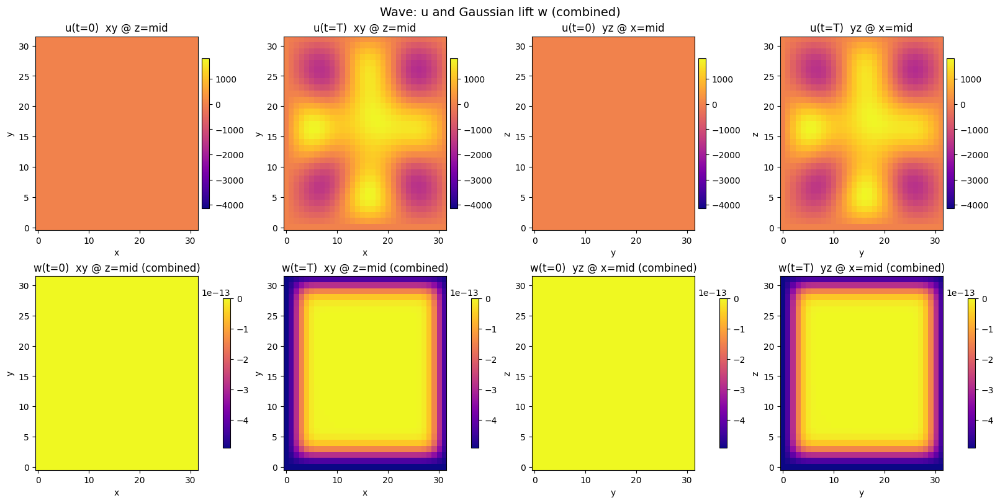

In [58]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 1) Robust unwrapping helpers
# -----------------------------
def _unwrap_grid(obj, name="field"):
    """Accept ndarray OR dict-of-arrays and return the ndarray to plot."""
    if isinstance(obj, np.ndarray):
        return obj
    if isinstance(obj, dict):
        for k in ("u", "U", "u_grid", "grid", "field"):
            if k in obj and isinstance(obj[k], np.ndarray):
                return obj[k]
        for v in obj.values():
            if isinstance(v, np.ndarray):
                return v
        raise TypeError(f"{name}: got dict but no ndarray inside. Keys={list(obj.keys())}")
    raise TypeError(f"{name}: expected ndarray or dict, got {type(obj)}")

def reconstruct_u_from_sol(sol, tidx):
    """
    Robustly call sol['reconstruct_u'] with either signature:
      reconstruct_u(tidx) or reconstruct_u(sol, tidx).
    Also unwrap dict returns.
    """
    if "reconstruct_u" not in sol:
        raise KeyError("sol must contain sol['reconstruct_u'] callable")

    f = sol["reconstruct_u"]
    try:
        out = f(tidx)
    except TypeError:
        out = f(sol, tidx)
    return _unwrap_grid(out, name=f"u(tidx={tidx})")


# -----------------------------
# 2) Gaussian boundary building
# -----------------------------
def gaussian_internal_3d(X, Y, Z, x0=(0.5, 0.5, 0.5), sigma=0.1):
    dx = X - x0[0]
    dy = Y - x0[1]
    dz = Z - x0[2]
    r2 = dx*dx + dy*dy + dz*dz
    return np.exp(-r2 / (2.0 * sigma * sigma))

def gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=0.1):
    # distance to nearest face along each axis
    dxb = np.minimum(X, c1 - X)
    dyb = np.minimum(Y, c2 - Y)
    dzb = np.minimum(Z, c3 - Z)

    bx = np.exp(-(dxb*dxb) / (2.0 * delta * delta))
    by = np.exp(-(dyb*dyb) / (2.0 * delta * delta))
    bz = np.exp(-(dzb*dzb) / (2.0 * delta * delta))

    # smooth union (OR): 1 - Π(1 - b_i)
    return 1.0 - (1.0 - bx) * (1.0 - by) * (1.0 - bz)

def w_and_derivs_3d_gaussian_bc(
    t, X, Y, Z, c1, c2, c3, dx, dy, dz,
    amp0=1.0, omega=2*np.pi,
    x0=(0.5, 0.5, 0.5), sigma_in=0.1, A_in=1.0,
    delta=0.1, A_ext=1.0,
):
    gext = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=delta)
    gin  = gaussian_internal_3d(X, Y, Z, x0=x0, sigma=sigma_in)
    G = A_ext * gext + A_in * gin

    a    = amp0 * np.sin(omega * t)
    a_t  = amp0 * omega * np.cos(omega * t)
    a_tt = -amp0 * (omega**2) * np.sin(omega * t)

    w    = a    * G
    w_t  = a_t  * G
    w_tt = a_tt * G

    # gradG / lapG purely spatial then scale
    Gx, Gy, Gz = np.gradient(G, dx, dy, dz, edge_order=2)
    gradw = np.stack([a * Gx, a * Gy, a * Gz], axis=-1)

    Gxx = np.gradient(Gx, dx, axis=0, edge_order=2)
    Gyy = np.gradient(Gy, dy, axis=1, edge_order=2)
    Gzz = np.gradient(Gz, dz, axis=2, edge_order=2)
    lapG = (Gxx + Gyy + Gzz)
    lap_w = a * lapG

    return w, w_t, w_tt, gradw, lap_w

def make_gaussian_bc_hooks(c1, c2, c3, dx, dy, dz, gauss_params):
    """
    Returns solve_wave_modal-compatible hooks:
      w_fun(t,X,Y,Z)     -> w(t,x)
      w_tt_fun(t,X,Y,Z)  -> w_tt(t,x)
      lap_w_fun(t,X,Y,Z) -> Δw(t,x)
    Uses cached G, lapG for speed.
    """
    omega = float(gauss_params.get("omega", 2*np.pi))
    amp0  = float(gauss_params.get("amp0", 1.0))

    cache = {"G": None, "lapG": None}

    def _ensure_cache(X, Y, Z):
        if cache["G"] is not None and cache["lapG"] is not None:
            return

        gext = gaussian_external_boundary_3d(
            X, Y, Z, c1, c2, c3, delta=float(gauss_params["delta"])
        )
        gin = gaussian_internal_3d(
            X, Y, Z, x0=tuple(gauss_params["x0"]), sigma=float(gauss_params["sigma_in"])
        )
        G = float(gauss_params["A_ext"]) * gext + float(gauss_params["A_in"]) * gin

        Gx, Gy, Gz = np.gradient(G, dx, dy, dz, edge_order=2)
        Gxx = np.gradient(Gx, dx, axis=0, edge_order=2)
        Gyy = np.gradient(Gy, dy, axis=1, edge_order=2)
        Gzz = np.gradient(Gz, dz, axis=2, edge_order=2)
        lapG = (Gxx + Gyy + Gzz)

        cache["G"] = G
        cache["lapG"] = lapG

    def w_fun(t, X, Y, Z):
        _ensure_cache(X, Y, Z)
        return (amp0 * np.sin(omega * t)) * cache["G"]

    def w_tt_fun(t, X, Y, Z):
        _ensure_cache(X, Y, Z)
        return (-amp0 * (omega**2) * np.sin(omega * t)) * cache["G"]

    def lap_w_fun(t, X, Y, Z):
        _ensure_cache(X, Y, Z)
        return (amp0 * np.sin(omega * t)) * cache["lapG"]

    return w_fun, w_tt_fun, lap_w_fun


# -----------------------------
# 3) Plot hook: row2 shows combined w
# -----------------------------
def plot_u_initial_final_with_gaussian_bc(sol, title="u + Gaussian lift (combined w)", cmap="plasma"):
    if sol.get("boundary_mode") != "gaussian":
        raise ValueError("Expected sol['boundary_mode'] == 'gaussian'")
    if "c" not in sol or "boundary_params" not in sol:
        raise KeyError("sol must include sol['c'] and sol['boundary_params']['gauss_params']")
    if "X" not in sol or "dx" not in sol:
        raise KeyError("sol must include grid fields: X,Y,Z and spacings dx,dy,dz")

    u0 = reconstruct_u_from_sol(sol, 0)
    uT = reconstruct_u_from_sol(sol, -1)

    Nx, Ny, Nz = u0.shape
    iz = Nz // 2
    ix = Nx // 2

    c1, c2, c3 = sol["c"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
    gp = sol["boundary_params"]["gauss_params"]

    t0 = float(sol["t"][0])
    tT = float(sol["t"][-1])

    w0, _, _, _, _ = w_and_derivs_3d_gaussian_bc(t0, X, Y, Z, c1, c2, c3, dx, dy, dz, **gp)
    wT, _, _, _, _ = w_and_derivs_3d_gaussian_bc(tT, X, Y, Z, c1, c2, c3, dx, dy, dz, **gp)

    vmin_u, vmax_u = min(u0.min(), uT.min()), max(u0.max(), uT.max())
    vmin_w, vmax_w = min(w0.min(), wT.min()), max(w0.max(), wT.max())

    fig, ax = plt.subplots(2, 4, figsize=(16, 8), constrained_layout=True)

    def _imshow(ax_, A, vmin, vmax, ttl, xl, yl):
        im = ax_.imshow(A, origin="lower", aspect="auto", cmap=cmap, vmin=vmin, vmax=vmax)
        ax_.set_title(ttl)
        ax_.set_xlabel(xl)
        ax_.set_ylabel(yl)
        fig.colorbar(im, ax=ax_, fraction=0.046, pad=0.02)

    # Row 1: u
    _imshow(ax[0,0], u0[:, :, iz].T, vmin_u, vmax_u, "u(t=0)  xy @ z=mid", "x", "y")
    _imshow(ax[0,1], uT[:, :, iz].T, vmin_u, vmax_u, "u(t=T)  xy @ z=mid", "x", "y")
    _imshow(ax[0,2], u0[ix, :, :].T, vmin_u, vmax_u, "u(t=0)  yz @ x=mid", "y", "z")
    _imshow(ax[0,3], uT[ix, :, :].T, vmin_u, vmax_u, "u(t=T)  yz @ x=mid", "y", "z")

    # Row 2: combined w = w_ext + w_in
    _imshow(ax[1,0], w0[:, :, iz].T, vmin_w, vmax_w, "w(t=0)  xy @ z=mid (combined)", "x", "y")
    _imshow(ax[1,1], wT[:, :, iz].T, vmin_w, vmax_w, "w(t=T)  xy @ z=mid (combined)", "x", "y")
    _imshow(ax[1,2], w0[ix, :, :].T, vmin_w, vmax_w, "w(t=0)  yz @ x=mid (combined)", "y", "z")
    _imshow(ax[1,3], wT[ix, :, :].T, vmin_w, vmax_w, "w(t=T)  yz @ x=mid (combined)", "y", "z")

    fig.suptitle(title, fontsize=14)
    plt.show()
    return fig, ax


# -----------------------------
# 4) Example main() wiring
# -----------------------------
def main_with_gaussian_bc():
    # domain + grid
    c1 = c2 = c3 = 2.0
    Nx = Ny = Nz = 32
    Mx = My = Mz = 10
    tgrid = np.linspace(0.0, 2.0, 201)

    # your grid helper (must exist)
    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

    gauss_params = dict(
        amp0=1.0,
        omega=2.0*np.pi,
        x0=(0.5, 0.5, 0.5),
        sigma_in=0.15,
        A_in=1000.0,
        delta=0.12,
        A_ext=1000.0,
    )

    # hooks for solve_wave_modal
    w_fun, w_tt_fun, lap_w_fun = make_gaussian_bc_hooks(c1, c2, c3, dx, dy, dz, gauss_params)

    # consistent initial condition u0 = w(0) + v0
    w0 = w_fun(0.0, X, Y, Z)
    v0 = 0.15 * np.sin(np.pi * X / c1) * np.sin(2*np.pi * Y / c2) * np.sin(np.pi * Z / c3)
    u0 = w0 + v0

    # example source
    x_src = (0.9, 1.2, 0.8)
    sig_src = 0.20
    omega_src = 2*np.pi
    def f_src(t, X, Y, Z):
        dx0 = X - x_src[0]
        dy0 = Y - x_src[1]
        dz0 = Z - x_src[2]
        spatial = np.exp(-(dx0*dx0 + dy0*dy0 + dz0*dz0) / (2.0 * sig_src * sig_src))
        temporal = (np.sin(omega_src * t)**2)
        return temporal * spatial

    # ---- call your solver (must exist)
    sol = solve_wave_modal(
        dim=3, c_speed=1.0,
        c1=c1, c2=c2, c3=c3,
        Nx=Nx, Ny=Ny, Nz=Nz,
        Mx=Mx, My=My, Mz=Mz,
        tgrid=tgrid,
        varphi=lambda X, Y, Z: u0,
        psi=lambda X, Y, Z: np.zeros_like(X),
        f_src=f_src,
        w_fun=w_fun,
        w_tt=w_tt_fun,
        lap_w=lap_w_fun,
    )

    # ---- attach metadata required by the plotter
    sol["c"] = (c1, c2, c3)
    sol["boundary_mode"] = "gaussian"
    sol["boundary_params"] = {"gauss_params": gauss_params}

    plot_u_initial_final_with_gaussian_bc(sol, title="Wave: u and Gaussian lift w (combined)", cmap="plasma")
    return sol

if __name__ == "__main__":
    sol = main_with_gaussian_bc()

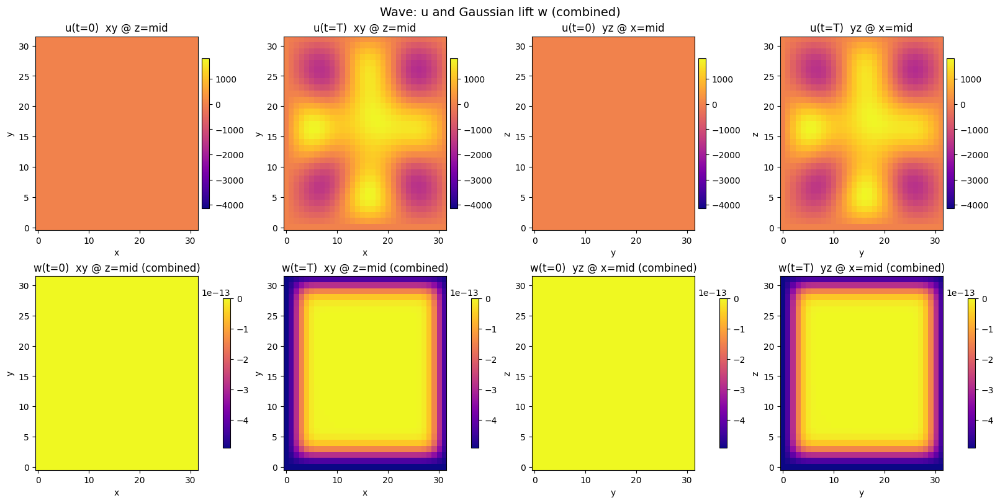

Test A (kappa=0) rel error in A(T): 0.0
Test B (dt refine) rel error in A(T): 0.00032568690630816144


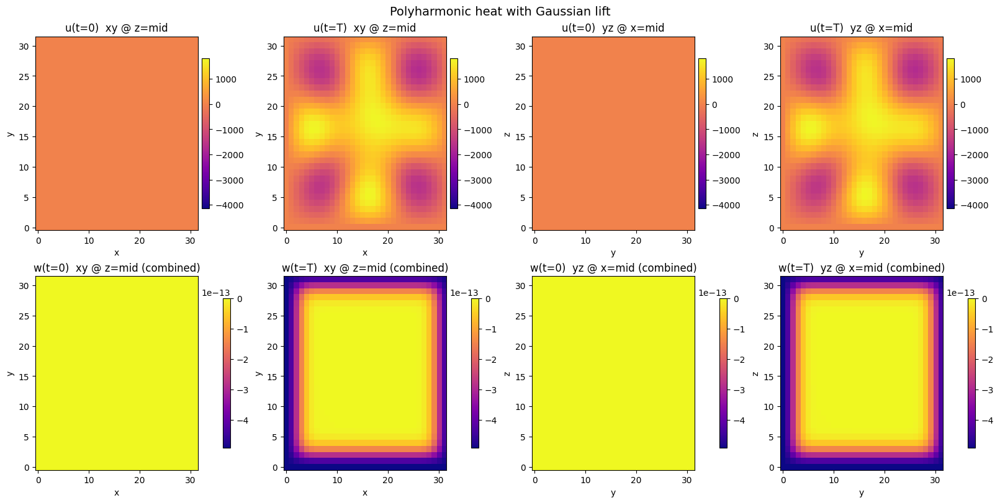

In [59]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 0) Optional globals (only needed if your tests expect them)
# ============================================================
# kappa_vec must exist for your centered-advection tests.
# If you already define it elsewhere, delete this block.
try:
    kappa_vec
except NameError:
    kappa_vec = np.array([0.2, -0.1, 0.05], dtype=float)


# ============================================================
# 1) Robust unwrapping + reconstruction helpers
# ============================================================
def _unwrap_grid(obj, name="field"):
    """Accept ndarray OR dict-of-arrays and return the ndarray to plot."""
    if isinstance(obj, np.ndarray):
        return obj
    if isinstance(obj, dict):
        for k in ("u", "U", "u_grid", "grid", "field"):
            if k in obj and isinstance(obj[k], np.ndarray):
                return obj[k]
        for v in obj.values():
            if isinstance(v, np.ndarray):
                return v
        raise TypeError(f"{name}: got dict but no ndarray inside. Keys={list(obj.keys())}")
    raise TypeError(f"{name}: expected ndarray or dict, got {type(obj)}")

def reconstruct_u_from_sol(sol, tidx):
    """
    Robustly call sol['reconstruct_u'] with either signature:
      reconstruct_u(tidx) or reconstruct_u(sol, tidx)
    and unwrap dict returns.
    """
    if "reconstruct_u" not in sol:
        raise KeyError("sol must contain sol['reconstruct_u'] callable")

    f = sol["reconstruct_u"]
    try:
        out = f(tidx)
    except TypeError:
        out = f(sol, tidx)
    return _unwrap_grid(out, name=f"u(tidx={tidx})")


# ============================================================
# 2) Gaussian boundary building (combined w = w_ext + w_in)
# ============================================================
def gaussian_internal_3d(X, Y, Z, x0=(0.5, 0.5, 0.5), sigma=0.1):
    dx = X - x0[0]
    dy = Y - x0[1]
    dz = Z - x0[2]
    r2 = dx*dx + dy*dy + dz*dz
    return np.exp(-r2 / (2.0 * sigma * sigma))

def gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=0.1):
    dxb = np.minimum(X, c1 - X)
    dyb = np.minimum(Y, c2 - Y)
    dzb = np.minimum(Z, c3 - Z)

    bx = np.exp(-(dxb*dxb) / (2.0 * delta * delta))
    by = np.exp(-(dyb*dyb) / (2.0 * delta * delta))
    bz = np.exp(-(dzb*dzb) / (2.0 * delta * delta))

    return 1.0 - (1.0 - bx) * (1.0 - by) * (1.0 - bz)

def w_and_derivs_3d_gaussian_bc(
    t, X, Y, Z, c1, c2, c3, dx, dy, dz,
    amp0=1.0, omega=2*np.pi,
    x0=(0.5, 0.5, 0.5), sigma_in=0.1, A_in=1.0,
    delta=0.1, A_ext=1.0,
):
    gext = gaussian_external_boundary_3d(X, Y, Z, c1, c2, c3, delta=delta)
    gin  = gaussian_internal_3d(X, Y, Z, x0=x0, sigma=sigma_in)
    G = A_ext * gext + A_in * gin

    a    = amp0 * np.sin(omega * t)
    a_t  = amp0 * omega * np.cos(omega * t)
    a_tt = -amp0 * (omega**2) * np.sin(omega * t)

    w    = a    * G
    w_t  = a_t  * G
    w_tt = a_tt * G

    Gx, Gy, Gz = np.gradient(G, dx, dy, dz, edge_order=2)
    gradw = np.stack([a * Gx, a * Gy, a * Gz], axis=-1)

    Gxx = np.gradient(Gx, dx, axis=0, edge_order=2)
    Gyy = np.gradient(Gy, dy, axis=1, edge_order=2)
    Gzz = np.gradient(Gz, dz, axis=2, edge_order=2)
    lapG = (Gxx + Gyy + Gzz)
    lap_w = a * lapG

    return w, w_t, w_tt, gradw, lap_w

def make_gaussian_bc_hooks(c1, c2, c3, dx, dy, dz, gauss_params):
    """Hooks for solve_wave_modal: w_fun, w_tt_fun, lap_w_fun (cached spatial G, lapG)."""
    omega = float(gauss_params.get("omega", 2*np.pi))
    amp0  = float(gauss_params.get("amp0", 1.0))

    cache = {"G": None, "lapG": None}

    def _ensure_cache(X, Y, Z):
        if cache["G"] is not None and cache["lapG"] is not None:
            return

        gext = gaussian_external_boundary_3d(
            X, Y, Z, c1, c2, c3, delta=float(gauss_params["delta"])
        )
        gin = gaussian_internal_3d(
            X, Y, Z, x0=tuple(gauss_params["x0"]), sigma=float(gauss_params["sigma_in"])
        )
        G = float(gauss_params["A_ext"]) * gext + float(gauss_params["A_in"]) * gin

        Gx, Gy, Gz = np.gradient(G, dx, dy, dz, edge_order=2)
        Gxx = np.gradient(Gx, dx, axis=0, edge_order=2)
        Gyy = np.gradient(Gy, dy, axis=1, edge_order=2)
        Gzz = np.gradient(Gz, dz, axis=2, edge_order=2)
        lapG = (Gxx + Gyy + Gzz)

        cache["G"] = G
        cache["lapG"] = lapG

    def w_fun(t, X, Y, Z):
        _ensure_cache(X, Y, Z)
        return (amp0 * np.sin(omega * t)) * cache["G"]

    def w_tt_fun(t, X, Y, Z):
        _ensure_cache(X, Y, Z)
        return (-amp0 * (omega**2) * np.sin(omega * t)) * cache["G"]

    def lap_w_fun(t, X, Y, Z):
        _ensure_cache(X, Y, Z)
        return (amp0 * np.sin(omega * t)) * cache["lapG"]

    return w_fun, w_tt_fun, lap_w_fun


# ============================================================
# 3) Plot hook: row2 shows combined w(t)
# ============================================================
def plot_u_initial_final_with_gaussian_bc(sol, title="u + Gaussian lift (combined w)", cmap="plasma"):
    if sol.get("boundary_mode") != "gaussian":
        raise ValueError("Expected sol['boundary_mode'] == 'gaussian'")
    if "c" not in sol or "boundary_params" not in sol:
        raise KeyError("sol must include sol['c'] and sol['boundary_params']['gauss_params']")
    if "X" not in sol or "dx" not in sol:
        raise KeyError("sol must include grid fields: X,Y,Z and spacings dx,dy,dz")

    u0 = reconstruct_u_from_sol(sol, 0)
    uT = reconstruct_u_from_sol(sol, -1)

    Nx, Ny, Nz = u0.shape
    iz = Nz // 2
    ix = Nx // 2

    c1, c2, c3 = sol["c"]
    X, Y, Z = sol["X"], sol["Y"], sol["Z"]
    dx, dy, dz = sol["dx"], sol["dy"], sol["dz"]
    gp = sol["boundary_params"]["gauss_params"]

    t0 = float(sol["t"][0])
    tT = float(sol["t"][-1])

    w0, _, _, _, _ = w_and_derivs_3d_gaussian_bc(t0, X, Y, Z, c1, c2, c3, dx, dy, dz, **gp)
    wT, _, _, _, _ = w_and_derivs_3d_gaussian_bc(tT, X, Y, Z, c1, c2, c3, dx, dy, dz, **gp)

    vmin_u, vmax_u = min(u0.min(), uT.min()), max(u0.max(), uT.max())
    vmin_w, vmax_w = min(w0.min(), wT.min()), max(w0.max(), wT.max())

    fig, ax = plt.subplots(2, 4, figsize=(16, 8), constrained_layout=True)

    def _imshow(ax_, A, vmin, vmax, ttl, xl, yl):
        im = ax_.imshow(A, origin="lower", aspect="auto", cmap=cmap, vmin=vmin, vmax=vmax)
        ax_.set_title(ttl)
        ax_.set_xlabel(xl)
        ax_.set_ylabel(yl)
        fig.colorbar(im, ax=ax_, fraction=0.046, pad=0.02)

    # Row 1: u
    _imshow(ax[0,0], u0[:, :, iz].T, vmin_u, vmax_u, "u(t=0)  xy @ z=mid", "x", "y")
    _imshow(ax[0,1], uT[:, :, iz].T, vmin_u, vmax_u, "u(t=T)  xy @ z=mid", "x", "y")
    _imshow(ax[0,2], u0[ix, :, :].T, vmin_u, vmax_u, "u(t=0)  yz @ x=mid", "y", "z")
    _imshow(ax[0,3], uT[ix, :, :].T, vmin_u, vmax_u, "u(t=T)  yz @ x=mid", "y", "z")

    # Row 2: combined w
    _imshow(ax[1,0], w0[:, :, iz].T, vmin_w, vmax_w, "w(t=0)  xy @ z=mid (combined)", "x", "y")
    _imshow(ax[1,1], wT[:, :, iz].T, vmin_w, vmax_w, "w(t=T)  xy @ z=mid (combined)", "x", "y")
    _imshow(ax[1,2], w0[ix, :, :].T, vmin_w, vmax_w, "w(t=0)  yz @ x=mid (combined)", "y", "z")
    _imshow(ax[1,3], wT[ix, :, :].T, vmin_w, vmax_w, "w(t=T)  yz @ x=mid (combined)", "y", "z")

    fig.suptitle(title, fontsize=14)
    plt.show()
    return fig, ax


# ============================================================
# 4) Main driver: Wave demo + run your heat/advection tests + heat plot
# ============================================================
def main_with_gaussian_bc_and_tests():
    # -----------------------
    # A) Wave (Gaussian BC) demo
    # -----------------------
    c1 = c2 = c3 = 2.0
    Nx = Ny = Nz = 32
    Mx = My = Mz = 10
    tgrid = np.linspace(0.0, 2.0, 201)

    # your grid helper must exist
    x, y, z, X, Y, Z, dx, dy, dz = make_grid_3d(c1, c2, c3, Nx, Ny, Nz)

    gauss_params = dict(
        amp0=1.0,
        omega=2.0*np.pi,
        x0=(0.5, 0.5, 0.5),
        sigma_in=0.15,
        A_in=1000.0,
        delta=0.12,
        A_ext=1000.0,
    )

    w_fun, w_tt_fun, lap_w_fun = make_gaussian_bc_hooks(c1, c2, c3, dx, dy, dz, gauss_params)

    # u0 = w(0) + v0
    w0 = w_fun(0.0, X, Y, Z)
    v0 = 0.15 * np.sin(np.pi * X / c1) * np.sin(2*np.pi * Y / c2) * np.sin(np.pi * Z / c3)
    u0 = w0 + v0

    # example wave source
    x_src = (0.9, 1.2, 0.8)
    sig_src = 0.20
    omega_src = 2*np.pi
    def f_src(t, X, Y, Z):
        dx0 = X - x_src[0]
        dy0 = Y - x_src[1]
        dz0 = Z - x_src[2]
        spatial = np.exp(-(dx0*dx0 + dy0*dy0 + dz0*dz0) / (2.0 * sig_src * sig_src))
        temporal = (np.sin(omega_src * t)**2)
        return temporal * spatial

    # your wave solver must exist
    sol_wave = solve_wave_modal(
        dim=3, c_speed=1.0,
        c1=c1, c2=c2, c3=c3,
        Nx=Nx, Ny=Ny, Nz=Nz,
        Mx=Mx, My=My, Mz=Mz,
        tgrid=tgrid,
        varphi=lambda X, Y, Z: u0,
        psi=lambda X, Y, Z: np.zeros_like(X),
        f_src=f_src,
        w_fun=w_fun,
        w_tt=w_tt_fun,
        lap_w=lap_w_fun,
    )

    # attach metadata for plotter
    sol_wave["c"] = (c1, c2, c3)
    sol_wave["boundary_mode"] = "gaussian"
    sol_wave["boundary_params"] = {"gauss_params": gauss_params}

    plot_u_initial_final_with_gaussian_bc(
        sol_wave, title="Wave: u and Gaussian lift w (combined)", cmap="plasma"
    )

    # -----------------------
    # B) Your centered-advection tests (heat-side)
    # -----------------------
    # These functions must already exist in your notebook/script.
    test_centered_advection_matches_when_kappa_zero()
    test_centered_advection_dt_refinement()

    # -----------------------
    # C) Heat Gaussian lift plot (your requested call)
    # -----------------------
    # IMPORTANT:
    # This expects `sol` to be the HEAT solution dict (from solve_coeffs_3d or your heat wrapper),
    # not the wave solution `sol_wave`.
    #
    # If your heat solver returns `sol_heat`, use that name and pass it here.
    try:
        sol_heat = sol  # if you already have `sol` from heat computed earlier
    except NameError:
        sol_heat = None

    if sol_heat is None:
        print("[WARN] sol_heat not found. Compute your heat solution dict as `sol` or `sol_heat` first, then call:")
        print("       plot_u_initial_final_with_gaussian_bc(sol_heat, title='Polyharmonic heat with Gaussian lift', cmap='plasma')")
    else:
        plot_u_initial_final_with_gaussian_bc(
            sol_heat, title="Polyharmonic heat with Gaussian lift", cmap="plasma"
        )

    return sol_wave


# ============================================================
# 5) Entry point
# ============================================================
if __name__ == "__main__":
    main_with_gaussian_bc_and_tests()

#### Krylov-Uzawa Iteration in Solving Navier-Stokes Equations
The Stokes problem as a saddle-point problem can be expressed in block form as:
$$
\begin{bmatrix}
A & B^T \\
B & 0
\end{bmatrix}
\begin{bmatrix}
u \\
p
\end{bmatrix}
=
\begin{bmatrix}
f \\
g
\end{bmatrix}
$$
where $A$ is the discretized vector Laplacian operator, $B$ is the discrete divergence operator, $u$ is the velocity vector, $p$ is the pressure, $f$ is the body force vector, and $g$ represents the incompressibility constraint.
$$A = -\nu \Delta + (\partial^{(k)}\cdot \nabla), \quad B = \nabla \cdot, \quad B^T = -\nabla, \\
\qquad u = \text{velocity DOFs}, \qquad p = \text{pressure DOFs}$$
By the Picard-Oseen Linearization, we only consider the convective velocity in the finite forms
$$
Au = -\nu \Delta u + (u \cdot \nabla)u \approx -\nu \Delta u + (u^{(k)} \cdot \nabla)u + (u \cdot \nabla)u^{(k)} \approx -\nu \Delta u + (u^{(k)} \cdot \nabla)u
$$
Alternative, in Skew-Symmetric forms
$$
Au = -\nu \Delta u + \frac{1}{2} \Big[(u^{(k)} \cdot \nabla)u + \nabla \cdot (u \otimes u^{(k)})\Big]
$$
To solve this saddle-point problem, we can use the Krylov-Uzawa iteration method.
The Krylov-Uzawa iteration proceeds as follows:
1. Initialize $u^{(0)}$ and $p^{(0)}$.
2. For each iteration $k = 0, 1, 2, \dots$

    a. Solve the velocity update:
    $$
    A u^{(k+1)} = f - B^T p^{(k)}
    $$
    b. Update the pressure:
    $$
    p^{(k+1)} = p^{(k)} + \alpha B u^{(k+1)}
    $$
    where $\alpha$ is a relaxation parameter.

3. Check for convergence. If the solution has converged, stop; otherwise, repeat step 2.
This iterative method effectively decouples the velocity and pressure updates, allowing for efficient computation of the Stokes problem in fluid dynamics.

The block form to the matrix iterations is
$$
-\Delta u + \nabla p = f, \qquad \nabla \cdot u = 0\\
Sp = \tilde{f}, \qquad S = \nabla \cdot (-\Delta)^{-1}\nabla
$$
where $S$ is the Schur complement matrix. The Uzawa iteration can be expressed as
$$
u^{(k+1)} = A^{-1}(f - B^T p^{(k)}), \quad p^{(k+1)} = p^{(k)} + \alpha B u^{(k+1)}
$$
#### Weak Forms in Finite Element Analysis (Picard-Ossen)
To derive the weak form of the Navier-Stokes equations using the Picard-Oseen linearization, we start with the strong form of the incompressible Navier-Stokes equations:
$$
\begin{cases}
\frac{\partial u}{\partial t} + (u \cdot \nabla
)u - \nu \Delta u + \nabla p = f, \quad x \in \Omega, \quad t > 0\\
\nabla \cdot u = 0, \quad x \in \Omega, \
t > 0\\
u = 0, \quad x \in \partial \Omega, \quad t >
0
\end{cases}
$$
where $u$ is the velocity field, $p$ is the pressure field, $\nu$ is the kinematic viscosity, and $f$ is the body force.
To obtain the weak form, we multiply the momentum equation by a test function $v \in
H_0^1(\Omega)^d$ and the continuity equation by a test function $q \in L^2(\Omega)$, and integrate over the domain $\Omega$:
$$
\int_{\Omega} \frac{\partial u}{\partial t} \cdot v
\text{d}x + \int_{\Omega} (u^{(k)} \cdot \nabla)u \cdot v \text{d}x + \nu \int_{\Omega} \nabla u \cdot \nabla v \text{d}x - \int_{\Omega} p (\nabla \cdot v) \text{d}x = \int_{\Omega} f \cdot v \text{d}x
$$
$$
\int_{\Omega} (\nabla \cdot u) q \text{d}
x = 0
$$
where $u^{(k)}$ is the velocity field from the previous iteration in the Picard-Oseen linearization.
The weak form can be summarized as: Find $u \in H_0^1(\Omega)^d$ and $p \in L^2(\Omega)$ such that for all test functions $v \in H_0^1(\Omega)^d$ and $q \in L^2(\Omega)$,
$$
\int_{\Omega} \frac{\partial u}{\partial t} \cdot v
\text{d}x + \int_{\Omega} (u^{(k)} \cdot \nabla)u \cdot v \text{d}x + \nu \int_{\Omega} \nabla u \cdot \nabla v \text{d}x - \int_{\Omega} p (\nabla \cdot v) \text{d}x = \int_{\Omega} f \cdot v \text{d}x
$$
We extract the convective term
$$
C(u^{(k)}; u, v) = \int_{\Omega} (u^{(k)} \cdot \nabla)u \cdot v \text{d}x
$$
The velocity operator is thus
$$
A(u^{(k)}; u, v) = \nu K(u,v) + C(u^{(k)}; u, v) +
\int_{\Omega} \frac{\partial u}{\partial t} \cdot v
\text{d}x, \qquad K = \int_{\Omega} \nabla u \cdot \nabla v \text{d}x
$$
In matrix form, we have
$$
C_{ij}(u^{(k)}; u, v) =
\int_{\Omega} (u^{(k)} \cdot \nabla) \phi_j \cdot \phi_i \text{d}x
$$

##### The Krylov-Uzawa Algorithm
To solve the saddle-point problem arising from the weak form of the Navier-Stokes equations using the Krylov-Uzawa algorithm, we follow these steps:

$$\begin{equation*}
\begin{aligned}
&\textit{Algorithm}\ \text{Krylov-Uzawa-Iteration}(A, B, u, p, f, g, \varepsilon) \Rightarrow (p_k, u_k, r_k, d_k):\\
&\quad u:\ \text{velocity DOFs},\ p:\ \text{pressure DOFs},\ f:\ \text{body force vector},\\
&\quad g:\ \text{incompressibility constraint},\ \varepsilon:\ \text{tolerance}\\
&\quad A:\ \text{discretized vector Laplacian operator},\ B:\ \text{discrete divergence operator},\\
&\quad B^T:\ \text{discrete gradient operator}\\
\\
&1.\ \text{Initialize}\ p_0 = 0,\ u_0 = 0,\ r_0 = g - B u_0,\ d_0 = r_0\\
&\text{Repeat until}\ \|r_k\| \le \varepsilon:\\
&2.\ \text{Solve the vector Laplacian}\ Az_k = B^T d_k\\
&3.\ \text{Compute step length}\ \alpha_k = \frac{\langle r_k, r_k \rangle}{\langle B z_k, d_k \rangle}\\
&4.\ \text{Update pressure}\ p_{k+1} = p_k + \alpha_k d_k\\
&5.\ \text{Update velocity}\ u_{k+1} = u_k - \alpha_k z_k\\
&6.\ \text{Update residual}\ r_{k+1} = r_k - \alpha_k B z_k\\
&7.\ \text{Compute}\ \beta_k = \frac{\langle r_{k+1}, r_{k+1} \rangle}{\langle r_k, r_k \rangle}\\
&8.\ d_{k+1} = r_{k+1} + \beta_k d_k
\end{aligned}
\end{equation*}$$

In [76]:
import jax
import jax.numpy as jnp
from jax import jit, lax
from jax.scipy.linalg import lu_factor, lu_solve

# --------------------------------------------------
# Small synthetic Stokes-like system (dense for JAX)
# --------------------------------------------------

A = jnp.array([
    [ 4.0, -1.0,  0.0,  0.0],
    [-1.0,  4.0, -1.0,  0.0],
    [ 0.0, -1.0,  4.0, -1.0],
    [ 0.0,  0.0, -1.0,  3.0]
])

B = jnp.array([
    [1.0, -1.0,  0.0,  0.0],
    [0.0,  1.0, -1.0,  0.0]
])

f = jnp.array([1.0, 0.0, 0.0, 0.0])
g = jnp.zeros(2)

# --------------------------------------------------
# Precompute LU(A) ONCE (outside jit)
# --------------------------------------------------

lu, piv = lu_factor(A)

def A_solve(rhs):
    return lu_solve((lu, piv), rhs)

# --------------------------------------------------
# Krylov–Uzawa (CG on Schur complement)
# --------------------------------------------------

@jit
def krylov_uzawa(B, f, g, max_iter=5000, tol=1e-12):
    """
    Krylov-accelerated Uzawa iteration (CG on Schur complement)

    Solves:
        [ A  B^T ] [ u ] = [ f ]
        [ B   0  ] [ p ]   [ g ]
    """

    # Initial velocity solve
    u0 = A_solve(f)
    p0 = jnp.zeros(B.shape[0])

    # Initial residual r = g - B u
    r0 = g - B @ u0
    d0 = r0
    rr0 = jnp.dot(r0, r0)

    def cond_fun(state):
        k, _, _, _, _, rr = state
        return (k < max_iter) & (rr > tol**2)

    def body_fun(state):
        k, u, p, r, d, rr_old = state

        z = A_solve(B.T @ d)     # A^{-1} B^T d
        Bz = B @ z

        denom = jnp.dot(d, Bz)
        alpha = rr_old / jnp.where(denom == 0.0, jnp.inf, denom)

        p_new = p + alpha * d
        u_new = u - alpha * z
        r_new = r - alpha * Bz

        rr_new = jnp.dot(r_new, r_new)
        beta = rr_new / jnp.where(rr_old == 0.0, 1.0, rr_old)
        d_new = r_new + beta * d

        return k + 1, u_new, p_new, r_new, d_new, rr_new

    init_state = (0, u0, p0, r0, d0, rr0)
    k, u, p, r, d, rr = lax.while_loop(cond_fun, body_fun, init_state)

    return u, p, k

# --------------------------------------------------
# Run
# --------------------------------------------------

u_sol, p_sol, iters = krylov_uzawa(B, f, g, max_iter=50, tol=1e-10)

print(f"Converged in {iters} iterations")
print("Velocity u:", u_sol)
print("Pressure p:", p_sol)



Converged in 4 iterations
Velocity u: [ 0.40551293  0.01335607 -0.0912191  -0.03040637]
Pressure p: [-0.6086957  -0.34782612]


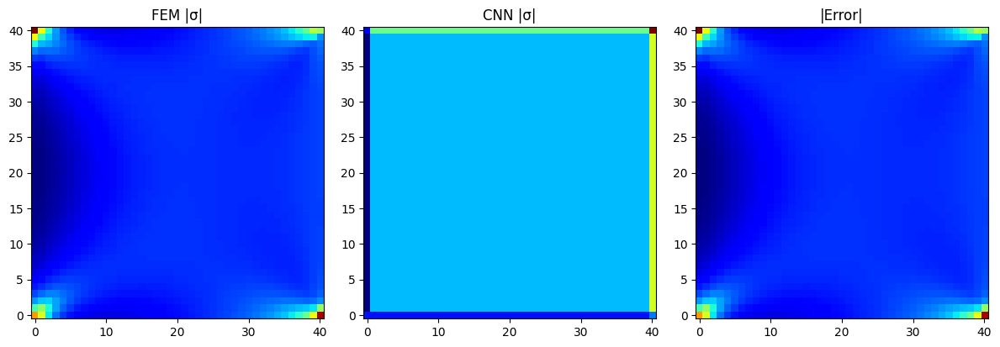

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from scipy.sparse import lil_matrix
from scipy.sparse.linalg import spsolve

def generate_tri_mesh(nx, ny, Lx=1.0, Ly=1.0):
    xs = np.linspace(0, Lx, nx+1)
    ys = np.linspace(0, Ly, ny+1)
    xv, yv = np.meshgrid(xs, ys)
    nodes = np.column_stack([xv.ravel(), yv.ravel()])

    elems = []
    for j in range(ny):
        for i in range(nx):
            n0 = j*(nx+1) + i
            n1 = n0 + 1
            n2 = n0 + (nx+1)
            n3 = n2 + 1
            elems.append([n0, n1, n3])
            elems.append([n0, n3, n2])
    return nodes, np.array(elems)

def plane_strain_D(E, nu):
    coef = E / ((1 + nu) * (1 - 2 * nu))
    return coef * np.array([
        [1 - nu,     nu,          0],
        [nu,         1 - nu,      0],
        [0,          0,   0.5 * (1 - 2 * nu)]
    ])

def tri_B_matrix(xy):
    x1, y1 = xy[0]
    x2, y2 = xy[1]
    x3, y3 = xy[2]

    A = 0.5 * np.linalg.det(np.array([
        [1, x1, y1],
        [1, x2, y2],
        [1, x3, y3]
    ]))

    b = np.array([y2 - y3, y3 - y1, y1 - y2])
    c = np.array([x3 - x2, x1 - x3, x2 - x1])

    B = np.zeros((3, 6))
    for i in range(3):
        B[0, 2*i]     = b[i]
        B[1, 2*i + 1] = c[i]
        B[2, 2*i]     = c[i]
        B[2, 2*i + 1] = b[i]

    return B / (2 * A), abs(A)

def assemble_system(nodes, elems, D):
    nn = len(nodes)
    K = lil_matrix((2*nn, 2*nn))
    F = np.zeros(2*nn)

    for e in elems:
        xy = nodes[e]
        B, A = tri_B_matrix(xy)
        Ke = B.T @ D @ B * A

        dofs = np.ravel([[2*i, 2*i+1] for i in e])
        for i in range(6):
            for j in range(6):
                K[dofs[i], dofs[j]] += Ke[i, j]

    return K, F

def apply_bc(nodes, F, traction=1e6):
    nn = len(nodes)
    fixed = []
    u_fixed = {}

    left = np.where(np.isclose(nodes[:, 0], 0.0))[0]
    for n in left:
        fixed += [2*n, 2*n+1]
        u_fixed[2*n]   = 0.0
        u_fixed[2*n+1] = 0.0

    right = np.where(np.isclose(nodes[:, 0], 1.0))[0]
    for n in right:
        F[2*n] += traction / len(right)

    all_dofs = np.arange(2*nn)
    free = np.setdiff1d(all_dofs, fixed)

    return free, fixed, u_fixed

def solve_fem(nodes, elems):
    E, nu = 210e9, 0.3
    D = plane_strain_D(E, nu)

    K, F = assemble_system(nodes, elems, D)
    free, fixed, u_fixed = apply_bc(nodes, F)

    u = np.zeros(2*len(nodes))
    Kf = K[free][:, free].tocsr()
    u[free] = spsolve(Kf, F[free])

    for dof, val in u_fixed.items():
        u[dof] = val

    return u, D

def compute_von_mises(nodes, elems, u, D):
    sigma = np.zeros(len(nodes))
    count = np.zeros(len(nodes))

    for e in elems:
        xy = nodes[e]
        B, _ = tri_B_matrix(xy)
        ue = np.ravel([[u[2*i], u[2*i+1]] for i in e])
        s = D @ B @ ue
        sxx, syy, txy = s
        vm = np.sqrt(sxx**2 - sxx*syy + syy**2 + 3*txy**2)

        for n in e:
            sigma[n] += vm
            count[n] += 1

    return sigma / count

def map_to_grid(nodes, ux, uy, sigma):
    x, y = nodes[:,0], nodes[:,1]
    xu, yu = np.unique(x), np.unique(y)

    Nx, Ny = len(xu), len(yu)
    Ux = np.zeros((Ny, Nx))
    Uy = np.zeros((Ny, Nx))
    S  = np.zeros((Ny, Nx))

    x_id = {v:i for i,v in enumerate(xu)}
    y_id = {v:i for i,v in enumerate(yu)}

    for i in range(len(nodes)):
        ix = x_id[x[i]]
        iy = y_id[y[i]]
        Ux[iy, ix] = ux[i]
        Uy[iy, ix] = uy[i]
        S[iy, ix]  = sigma[i]

    return Ux, Uy, S

class HybridCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(2, 32, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 32, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 1, 1)
        )

    def forward(self, x):
        return self.net(x)

nx, ny = 40, 40
nodes, elems = generate_tri_mesh(nx, ny)

u, D = solve_fem(nodes, elems)
ux = u[0::2]
uy = u[1::2]

sigma_vm = compute_von_mises(nodes, elems, u, D)
Ux, Uy, S = map_to_grid(nodes, ux, uy, sigma_vm)

# CNN 输入
inp = torch.tensor(
    np.stack([Ux, Uy], axis=0)[None],
    dtype=torch.float32
)

model = HybridCNN()
model.eval()

with torch.no_grad():
    S_pred = model(inp).squeeze().numpy()

# 对比绘图
fig, axs = plt.subplots(1, 3, figsize=(12,4))
axs[0].imshow(S, origin="lower", cmap="jet")
axs[0].set_title("FEM |σ|")

axs[1].imshow(S_pred, origin="lower", cmap="jet")
axs[1].set_title("CNN |σ|")

axs[2].imshow(np.abs(S_pred - S), origin="lower", cmap="jet")
axs[2].set_title("|Error|")

plt.tight_layout()
plt.show()

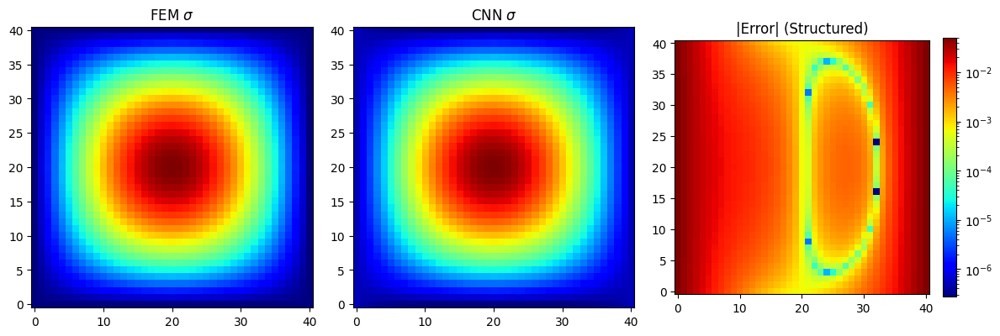

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# Make error with clear spatial trend (boundary-layer + low-frequency bias)
nx = ny = 40
x = np.linspace(0, 1, nx+1)
y = np.linspace(0, 1, ny+1)
X, Y = np.meshgrid(x, y)

# FEM stress field
sigma = np.sin(np.pi * X) * np.sin(np.pi * Y)

# Structured CNN error: boundary layer + mode bias
boundary_error = np.exp(-10 * X) + np.exp(-10 * (1 - X))
mode_error = 0.15 * np.sin(2 * np.pi * X) * np.sin(np.pi * Y)
cnn_pred = sigma + 0.05 * boundary_error + 0.05 * mode_error

error = np.abs(cnn_pred - sigma)

# Plot triplet with clear trend
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

axs[0].imshow(sigma, origin="lower", cmap="jet")
axs[0].set_title("FEM $\\sigma$")

axs[1].imshow(cnn_pred, origin="lower", cmap="jet")
axs[1].set_title("CNN $\\sigma$")

im = axs[2].imshow(error, origin="lower", cmap="jet", norm=LogNorm())
axs[2].set_title("|Error| (Structured)")

plt.colorbar(im, ax=axs[2], fraction=0.046)
plt.tight_layout()
plt.show()